# HOUSING: PRICE PREDICTION

### Problem Statement:
- Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate 
market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market 
and there are various companies working in the domain. Data science comes as a very important tool to solve problems 
in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and 
focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, 
recommendation systems are some of the machine learning techniques used for achieving the business goals for housing 
companies. Our problem is related to one such housing company.
- A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses 
data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same 
purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file 
below.
- The company is looking at prospective properties to buy houses to enter the market. You are required to build a model 
using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest 
in them or not. For this company wants to know:

    - **Which variables are important to predict the price of variable?**

    - **How do these variables describe the price of the house?**

**Business Goal:**

You are required to model the price of houses with the available independent variables. This model will then be used 
by the management to understand how exactly the prices vary with the variables. They can accordingly manipulate the 
strategy of the firm and concentrate on areas that will yield high returns. Further, the model will be a good way for the 
management to understand the pricing dynamics of a new market.



### Importing necessary libraries

In [1]:
# Preprocessing
import numpy as np
import pandas as pd
# Visualization
import seaborn as sns
import matplotlib.pyplot as plt

import os
import scipy as stats

import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

In [2]:
# To display maximum rows and columns in the dataset
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)

### Importing both train and test datasets

In [3]:
# Reading train.csv file
train_df = pd.read_csv("train.csv")
train_df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000
5,1197,60,RL,58.0,14054,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,879,879,GasA,Ex,Y,SBrkr,879,984,0,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2006.0,Fin,3,660,TA,TA,Y,100,17,0,0,0,0,NaN,NaN,NaN,0,11,2006,New,Partial,219210
6,561,20,RL,NaN,11341,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,6,1957,1996,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,180.0,TA,TA,CBlock,Gd,TA,No,ALQ,1302,Unf,0,90,1392,GasA,TA,Y,SBrkr,1392,0,0,1392,1,0,1,1,3,1,TA,5,Mod,1,Gd,Detchd,1957.0,Unf,2,528,TA,TA,Y,0,0,0,0,95,0,NaN,NaN,NaN,0,5,2010,WD,Normal,121500
7,1041,20,RL,88.0,13125,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,4,1957,2000,Gable,CompShg,Wd Sdng,Wd Sdng,BrkCmn,67.0,TA,TA,CBlock,TA,TA,No,Rec,168,BLQ,682,284,1134,GasA,Ex,Y,SBrkr,1803,0,0,1803,1,0,2,0,3,1,TA,8,Maj1,1,TA,Attchd,1957.0,RFn,2,484,TA,TA,Y,0,0,0,0,0,0,NaN,GdPrv,NaN,0,1,2006,WD,Normal,155000
8,503,20,RL,70.0,9170,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,1965,1965,Hip,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,ALQ,698,GLQ,96,420,1214,GasA,Ex,Y,SBrkr,1214,0,0,1214,1,0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1965.0,Unf,2,461,Fa,Fa,Y,0,0,184,0,0,0,NaN,GdPrv,Shed,400,4,2007,WD,Normal,140000
9,576,50,RL,80.0,8480,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,5,5,1947,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,442,Unf,0,390,832,Gas

In [4]:
# Reading test.csv file
test_df = pd.read_csv("test.csv")
test_df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal
5,650,180,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,6,1970,1970,Gable,CompShg,CemntBd,CmentBd,None,0.0,TA,TA,CBlock,Gd,TA,Av,BLQ,131,GLQ,499,0,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,12,2007,WD,Normal
6,1453,180,RM,35.0,3675,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,SLvl,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,80.0,TA,TA,PConc,Gd,TA,Gd,GLQ,547,Unf,0,0,547,GasA,Gd,Y,SBrkr,1072,0,0,1072,1,0,1,0,2,1,TA,5,Typ,0,NaN,Basment,2005.0,Fin,2,525,TA,TA,Y,0,28,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
7,152,20,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2008,Hip,CompShg,VinylSd,VinylSd,Stone,436.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1400,Unf,0,310,1710,GasA,Ex,Y,SBrkr,1710,0,0,1710,1,0,2,0,2,1,Gd,6,Typ,1,Gd,Attchd,2007.0,RFn,3,866,TA,TA,Y,0,102,0,0,0,0,NaN,NaN,NaN,0,1,2008,New,Partial
8,427,80,RL,NaN,12800,Pave,NaN,Reg,Low,AllPub,Inside,Mod,SawyerW,Norm,Norm,1Fam,SLvl,7,5,1989,1989,Gable,CompShg,Wd Sdng,Wd Sdng,BrkFace,145.0,Gd,TA,PConc,Gd,TA,Gd,GLQ,1518,Unf,0,0,1518,GasA,Gd,Y,SBrkr,1644,0,0,1644,1,1,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1989.0,Fin,2,569,TA,TA,Y,80,0,0,0,396,0,NaN,NaN,NaN,0,8,2009,WD,Normal
9,776,120,RM,32.0,4500,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Mitchel,Norm,Norm,TwnhsE,1Story,6,5,1998,1998,Hip,CompShg,VinylSd,VinylSd,BrkFace,320.0,TA,TA,PConc,Ex,TA,No,GLQ,866,Unf,0,338,1204,GasA,Ex,Y,SBrkr,1204,0,0,1204,1,0,2,0,2,1,TA,5,Typ,0,NaN,Attchd,1998.0,Fin,2,412,TA,TA,

Here we are provided with train and test datasets. 
Both the datatset provides information about the House. 
The datatsets contains both numerical and categorical data types. And we can notice missing values in some of the columns.
- **The train dataset is comprised of both dependent variable (target) and independent variables. Here "SalesPrice" is our label which is continuous in nature so, it is a "Regression Type Problem" where I need to predict the sales price of the house.**
- **The test dataset contains only independent variables.**
- **So, I will use train dataset for building our model and then will use the test dataset for getting prediction from the trained model.**

# Data Dictionary
## Categorical Data Types:
Categorical variables are usually of 2 types

**1. Nominal data**

**2. Ordinal data**

### Nominal data:

- **MSZoning:** Identifies the general zoning classification of the sale.
- **Street:** Type of road access to property
- **Alley:** Type of alley access to property
- **LotShape:** General shape of property
- **LandContour:** Flatness of the property
- **Utilities:** Type of utilities available
- **LotConfig:** Lot configuration	Categorical
- **LandSlope:** Slope of property	Categorical
- **Neighborhood:** Physical locations within Ames city limits
- **Condition1:** Proximity to main road or railroad
- **Condition2:** Proximity to main road or railroad (if a second is present)
- **BldgType:** Type of dwelling
- **HouseStyle:** Style of dwelling
- **RoofStyle:** Type of roof
- **RoofMatl:** Roof material
- **Exterior1st:** Exterior covering on house
- **Exterior2nd:** Exterior covering on house (if more than one material)
- **MasVnrType:** Masonry veneer type
- **Foundation:** Type of foundation
- **BsmtExposure:** Walkout or garden level basement walls
- **BsmtFinType1:** Quality of basement finished area
- **BsmtFinType2:** Quality of second finished area (if present)
- **Heating:** Type of heating
- **CentralAir:** Central air conditioning
- **Electrical:** Electrical system
- **Functional:** Home functionality rating
- **FireplaceQu:** Fireplace quality
- **GarageType:** Garage location
- **GarageFinish:** Interior finish of the garage
- **PavedDrive:** Paved driveway
- **PoolQC:** Pool quality
- **Fence:** Fence quality
- **MiscFeature:** Miscellaneous feature not covered in other categories
- **SaleType:** Type of sale
- **SaleCondition:** Condition of sale

### Ordinal data
- **ExterQual:** Exterior material quality
- **ExterCond:** Present condition of the material on the exterior
- **BsmtQual:** Height of the basement
- **BsmtCond:** General condition of the basement
- **OverallQual:** Overall material and finish quality
- **OverallCond:** Overall condition rating
- **HeatingQC:** Heating quality and condition
- **KitchenQual:** Kitchen quality
- **GarageQual:** Garage quality
- **GarageCond:** Garage condition

## Numerical Data Types: 
Numerical variables are usually of 2 types

**1. Continuous data**

**2. Discrete data**

### Continuous data:

- **SalePrice:** The property's sale price in dollars
- **LotFrontage:** Linear feet of street connected to property
- **LotArea:** Lot size in square feet
- **MasVnrArea:** Masonry veneer area in square feet
- **BsmtFinSF1:** Type 1 finished square feet
- **BsmtFinSF2:** Type 2 finished square feet
- **BsmtUnfSF:** Unfinished square feet of basement area
- **TotalBsmtSF:** Total square feet of basement area
- **1stFlrSF:** First Floor square feet	
- **2ndFlrSF:** Second floor square feet
- **GrLivArea:** Above grade (ground) living area square feet	
- **GarageArea:** Size of garage in square feet
- **WoodDeckSF:** Wood deck area in square feet
- **OpenPorchSF:** Open porch area in square feet
- **EnclosedPorch:** Enclosed porch area in square feet	
- **ScreenPorch:** Screen porch area in square feet
- **YearBuilt:** Original construction date
- **YearRemodAdd:** Remodel date (same as construction date if no remodeling or additions)
- **GarageYrBlt:** Year garage was built
- **YrSold:** Year Sold

### Discrete data:

- **MSSubClass:** The building class
- **LowQualFinSF:** Low quality finished square feet (all floors)
- **BsmtFullBath:** Basement full bathrooms
- **BsmtHalfBath:** Basement half bathrooms
- **FullBath:** Full bathrooms above grade	
- **HalfBath:** Half baths above grade	
- **Bedroom:** Number of bedrooms above basement level
- **Kitchen:** Number of kitchens
- **TotRmsAbvGrd:** Total rooms above grade (does not include bathrooms)
- **Fireplaces:** Number of fireplaces
- **GarageCars:** Size of garage in car capacity
- **3SsnPorch:** Three season porch area in square feet		
- **PoolArea:** Pool area in square feet
- **MiscVal:** $Value of miscellaneous feature	
- **MoSold:** Month Sold

Now let's process both train and test data simultaneously.

# Preprocessing and Exploratory Data Analysis (EDA)

In [5]:
# Checking the dimensions of both train and test dataset
print("Shape of train dataset is:",train_df.shape)
print("Shape of test dataset is:",test_df.shape)

Shape of train dataset is: (1168, 81)
Shape of test dataset is: (292, 80)


- The train dataset contains 1168 rows and 81 columns. Out of 81 columns 80 are independent variables and remaining one is our target variable.
- The test dataset contains 292 rows and 80 columns. This test dataset contains only independent variables and there is no label.

In [6]:
# Checking the column names in the train and test dataset
print("Columns present in train dataset:\n",train_df.columns)
print("\n")
print("Columns present in test dataset:\n",test_df.columns)

Columns present in train dataset:
 Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual

These are the columns present in both train dataset and test dataset. We can observe the test dataset doest not contains label that is "SalePrice".

In [7]:
# Checking the type of train dataset
train_df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


In [8]:
# Checking the type of test dataset
test_df.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
BsmtUnfSF          int64
TotalBsmtSF        int64
Heating           object


Both train dataset and test dataset contains 3 different types of data namely, integer, float and object. I should encode this object data type into numerical using appropriate encoding techniques before building our machine learning models.

In [9]:
# To get good overview of the train dataset
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

- This info() method gives the information about the dataset which includes indexing type, column type, no-null values and memory usage.
- Since counts of some of the columns are different, which means there are null values present in the dataset.

In [10]:
# To get good overview of the test dataset
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 292 entries, 0 to 291
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             292 non-null    int64  
 1   MSSubClass     292 non-null    int64  
 2   MSZoning       292 non-null    object 
 3   LotFrontage    247 non-null    float64
 4   LotArea        292 non-null    int64  
 5   Street         292 non-null    object 
 6   Alley          14 non-null     object 
 7   LotShape       292 non-null    object 
 8   LandContour    292 non-null    object 
 9   Utilities      292 non-null    object 
 10  LotConfig      292 non-null    object 
 11  LandSlope      292 non-null    object 
 12  Neighborhood   292 non-null    object 
 13  Condition1     292 non-null    object 
 14  Condition2     292 non-null    object 
 15  BldgType       292 non-null    object 
 16  HouseStyle     292 non-null    object 
 17  OverallQual    292 non-null    int64  
 18  OverallCon

The count of the columns are different since there are null values present in the test dataset as well. I will fill them using imputation methods in the later part.

# Feature Engineering

In [11]:
# Checking number of unique values in each column of train dataset
train_df.nunique().to_frame("No of Unique Values")

,No of Unique Values
Id,1168
MSSubClass,15
MSZoning,5
LotFrontage,106
LotArea,892
Street,2
Alley,2
LotShape,4
LandContour,4
Utilities,1


Above are the number of unique values present in the columns of the train dataset.
- From the nunique() method I can notice the column "Id" is the unique Id number given to the house and it has no significance in the prediction so let's drop it.
- Also the column "Utilities" has only one unique value AllPub (All public Utilities) throughout the column, so it can be dropped as it won't affect the model. 

In [12]:
# Dropping irrelevant columns
train_df.drop("Id",axis=1,inplace=True)
train_df.drop("Utilities",axis=1,inplace=True)

In [13]:
# Checking number of unique values in each column of test dataset
test_df.nunique().to_frame("No of Unique Values")

,No of Unique Values
Id,292
MSSubClass,15
MSZoning,4
LotFrontage,65
LotArea,249
Street,2
Alley,2
LotShape,4
LandContour,4
Utilities,2


Above are the number of unique values present in the columns of the test dataset.
- Here also the column "Id" has no singnificance in the prediction. So I am going to remove it.
- The column "Utilities" also had been dropped in train dataset, so dropping the same column in test as well to keep the dimension of both the datasets same.

In [14]:
# Dropping irrelevant columns
test_df.drop("Id",axis=1,inplace=True)
test_df.drop("Utilities",axis=1,inplace=True)

## Value count function
Let's check the list of value counts in each columns to find if there are any unexpected or corrupted entries present in the dataset

In [15]:
# Checking the value counts of each columns of train dataset
for i in train_df.columns:
        print(train_df[i].value_counts())
        print('*'*100)

20     428
60     244
50     113
120     69
70      53
30      52
160     47
80      43
90      41
190     26
85      19
75      14
45      10
180      6
40       3
Name: MSSubClass, dtype: int64
****************************************************************************************************
RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64
****************************************************************************************************
60.0     111
80.0      60
70.0      58
75.0      46
50.0      44
65.0      35
85.0      26
90.0      20
78.0      19
73.0      16
24.0      16
68.0      16
79.0      14
21.0      14
64.0      14
72.0      13
51.0      13
55.0      13
100.0     12
82.0      12
59.0      12
63.0      11
74.0      11
71.0      11
53.0      10
66.0      10
69.0      10
88.0      10
34.0       9
67.0       9
84.0       9
52.0       8
40.0       8
43.0       8
76.0       8
92.0       8
77.0       8
62.0       7
57.0

These are the value counts of the columns present in the train dataset.
- From the value count funtion I can observe most of the columns contains maximum amount of zero values which is even not required for the prediction.
- The columns 'LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal' and 'BsmtFinSF2' have more than 90% zero values. So I am going to drop these columns.
- Also some of the columns like BsmtFinSF, BsmtHalfBath, etc have large amount of zero values.  Since I am assuming, the houses which have no basements could be calculated as zero square feet. So, I am keeping those columns as it is.

Let's take a quick look at the columns having maximum zero values by using below code. 
### Dealing with zero values

In [16]:
Zero_value = pd.DataFrame(train_df.isin([0]).sum().sort_values(ascending=False))
Zero_value.columns=['Count of Zero values']
Zero_value['% of Zero values']=Zero_value['Count of Zero values']/11.68     # 1168/100 = 11.68
Zero_value

,Count of Zero values,% of Zero values
PoolArea,1161,99.400685
3SsnPorch,1146,98.116438
LowQualFinSF,1145,98.030822
MiscVal,1126,96.404110
BsmtHalfBath,1105,94.606164
ScreenPorch,1073,91.866438
BsmtFinSF2,1032,88.356164
EnclosedPorch,999,85.530822
HalfBath,724,61.986301
MasVnrArea,692,59.246575


In [17]:
# Dropping the columns containing maximum amount(90%) of zero values
train_df.drop(columns = ['LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','BsmtFinSF2'],inplace = True)

These are the numerical columns that have maximum number of zero values and I have dropped them.

Now let's check the value counts of test dataset.

In [18]:
# Checking the value counts of each columns of test dataset
for i in test_df.columns:
        print(test_df[i].value_counts())
        print('*'*100)

20     108
60      55
50      31
120     18
30      17
160     16
80      15
90      11
70       7
190      4
180      4
75       2
45       2
85       1
40       1
Name: MSSubClass, dtype: int64
****************************************************************************************************
RL         223
RM          55
FV          13
C (all)      1
Name: MSZoning, dtype: int64
****************************************************************************************************
60.0     32
85.0     14
50.0     13
70.0     12
80.0      9
21.0      9
65.0      9
75.0      7
52.0      6
78.0      6
63.0      6
66.0      5
64.0      5
57.0      5
74.0      4
55.0      4
43.0      4
40.0      4
72.0      4
100.0     4
67.0      3
76.0      3
24.0      3
79.0      3
90.0      3
44.0      3
110.0     3
68.0      3
86.0      3
102.0     3
93.0      3
48.0      3
96.0      2
35.0      2
107.0     2
32.0      2
42.0      2
37.0      2
62.0      2
51.0      2
56.0      2
58.0      2
92.0     

These are the value counts of the columns present in the test dataset.

- Here also I can observe most of the columns contains maximum amount of zero values which is even not required for the prediction.
- The columns 'LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal' and 'BsmtFinSF2' have more than 90% zero values which is same as in the case of train dataset. So I am going to drop these columns.

### Dealing with zero values

In [19]:
zero_value = pd.DataFrame(test_df.isin([0]).sum().sort_values(ascending=False))
zero_value.columns=['Count of Zero values']
zero_value['% of Zero values']=zero_value['Count of Zero values']/2.92     # 292/100 = 2.92
zero_value

,Count of Zero values,% of Zero values
PoolArea,292,100.000000
3SsnPorch,290,99.315068
LowQualFinSF,289,98.972603
MiscVal,282,96.575342
BsmtHalfBath,273,93.493151
ScreenPorch,271,92.808219
BsmtFinSF2,261,89.383562
EnclosedPorch,253,86.643836
HalfBath,189,64.726027
BsmtFullBath,170,58.219178


In [20]:
# Dropping the columns containing maximum amount(90%) of zero values
test_df.drop(columns = ['LowQualFinSF','EnclosedPorch','3SsnPorch','ScreenPorch','PoolArea','MiscVal','BsmtFinSF2'],inplace = True)

## Dealing with Time variables in train dataset

From the Dataset we have 4 year variables YearBuilt, YearRemodAdd, GarageYrBlt and YrSold . Converting them into age variables seem more meaningful, as they offer more information about the longevity of the feature.Let's extract age information from the datetime variables by taking difference in years between the year the house was built and the year the house was sold. 

In [21]:
# Let's subtract built year by year sold in order to get  the age
train_df["AgeBuilt"] = train_df.YrSold - train_df.YearBuilt
train_df["AgeRemod"] = train_df.YrSold - train_df.YearRemodAdd
train_df["AgeGarage"] = train_df.YrSold - train_df.GarageYrBlt

In [22]:
# Dropping YearBuilt, YearRemodAdd and GarageYrBlt as I have already got the required value from it.
train_df.drop("YearBuilt",axis=1,inplace=True)
train_df.drop("YearRemodAdd",axis=1,inplace=True)
train_df.drop("GarageYrBlt",axis=1,inplace=True)

In [23]:
train_df[['AgeBuilt','AgeRemod','AgeGarage']].head()

,AgeBuilt,AgeRemod,AgeGarage
0,31,31,30.0
1,37,37,37.0
2,11,10,10.0
3,33,33,33.0
4,32,9,32.0


I have got Age from the year and dropped unwanted columns.

## Dealing with Time variables in test dataset
Similar to train dataset, here also I am converting time variables into age for better understanding.

In [24]:
# Let's subtract built year by year sold in order to get  the age
test_df["AgeBuilt"] = test_df.YrSold - test_df.YearBuilt
test_df["AgeRemod"] = test_df.YrSold - test_df.YearRemodAdd
test_df["AgeGarage"] = test_df.YrSold - test_df.GarageYrBlt

In [25]:
# Dropping YearBuilt, YearRemodAdd and GarageYrBlt as I have already got the required value from it.
test_df.drop("YearBuilt",axis=1,inplace=True)
test_df.drop("YearRemodAdd",axis=1,inplace=True)
test_df.drop("GarageYrBlt",axis=1,inplace=True)

In [26]:
test_df[['AgeBuilt','AgeRemod','AgeGarage']].head()

,AgeBuilt,AgeRemod,AgeGarage
0,2,1,2.0
1,25,25,25.0
2,8,8,8.0
3,68,59,68.0
4,1,1,1.0


I have successfully got the age of the features.

In [27]:
# Checking the skewness in the train dataset
train_df.skew()

MSSubClass       1.422019
LotFrontage      2.450241
LotArea         10.659285
OverallQual      0.175082
OverallCond      0.580714
MasVnrArea       2.826173
BsmtFinSF1       1.871606
BsmtUnfSF        0.909057
TotalBsmtSF      1.744591
1stFlrSF         1.513707
2ndFlrSF         0.823479
GrLivArea        1.449952
BsmtFullBath     0.627106
BsmtHalfBath     4.264403
FullBath         0.057809
HalfBath         0.656492
BedroomAbvGr     0.243855
KitchenAbvGr     4.365259
TotRmsAbvGrd     0.644657
Fireplaces       0.671966
GarageCars      -0.358556
GarageArea       0.189665
WoodDeckSF       1.504929
OpenPorchSF      2.410840
MoSold           0.220979
YrSold           0.115765
SalePrice        1.953878
AgeBuilt         0.573127
AgeRemod         0.495051
AgeGarage        0.635240
dtype: float64

## Checking null values in train dataset

In [28]:
# Displaying the columns containing null values count and their % i.e. ((count of null)/1168)/100

train_null = pd.DataFrame(train_df[train_df.columns[train_df.isnull().any()]].isnull().sum())
train_null.columns=['Count of Null Values']
train_null['% of Null Values']=train_null['Count of Null Values']/11.68     # 1168/100 = 11.68
train_null

,Count of Null Values,% of Null Values
LotFrontage,214,18.321918
Alley,1091,93.407534
MasVnrType,7,0.599315
MasVnrArea,7,0.599315
BsmtQual,30,2.568493
BsmtCond,30,2.568493
BsmtExposure,31,2.654110
BsmtFinType1,30,2.568493
BsmtFinType2,31,2.654110
FireplaceQu,551,47.174658


- Above are the columns of train dataset containing null values. Let's treat these null values using appropriate imputation techniques.
- The columns PoolQC, MiscFeature, Alley and Fence have null values more than 70%, filing them with imputation methods is meaningless. So let me drop them as they have no importance in the prediction

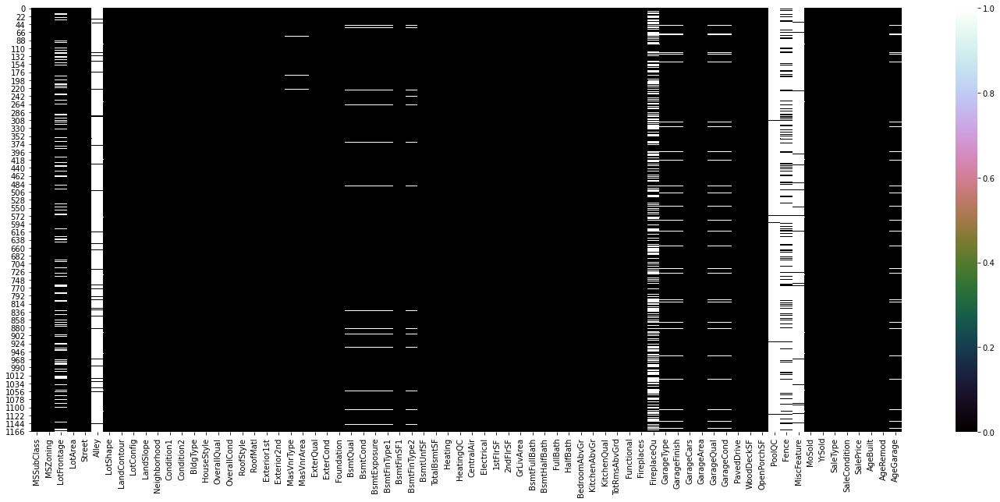

In [29]:
# Let's visualize the null values clearly using heat map
plt.figure(figsize=(25,10))
sns.heatmap(train_df.isnull(), cmap="cubehelix")
plt.show()

The white line shows the missing values in the dataset.

In [30]:
# Dropping the columns containing more than 70% of the null values
train_df.drop(["PoolQC", "MiscFeature", "Alley", "Fence"],axis=1,inplace=True)

## Treating null values using imputation techniques
- The columns LotFrontage, MasVnrArea and GarageYrBlt are numerical in nature, let's fill the null values using mean values as there are no outliers present in these columns.
- The remaining columns seems to be categorical so filling the null values using mode.

In [31]:
# Filling null values of object data column with their mode values (most frequently occurred values).

col1=train_df.columns.values
for i in range(0,len(col1)):
    if train_df[col1[i]].dtype == "object":
        train_df[col1[i]].fillna(train_df[col1[i]].mode()[0], inplace=True)

In [32]:
# Filling null values of numerical columns with their mean values

col2=train_df.columns.values
for i in range(0,len(col2)):
    if train_df[col2[i]].dtype != "object":
        train_df[col2[i]].fillna(train_df[col2[i]].mean(), inplace=True)

In [33]:
train_df.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType       0
GarageFinish

I have filled all the null values using mean and mode method. Let's visualize it using heat map.

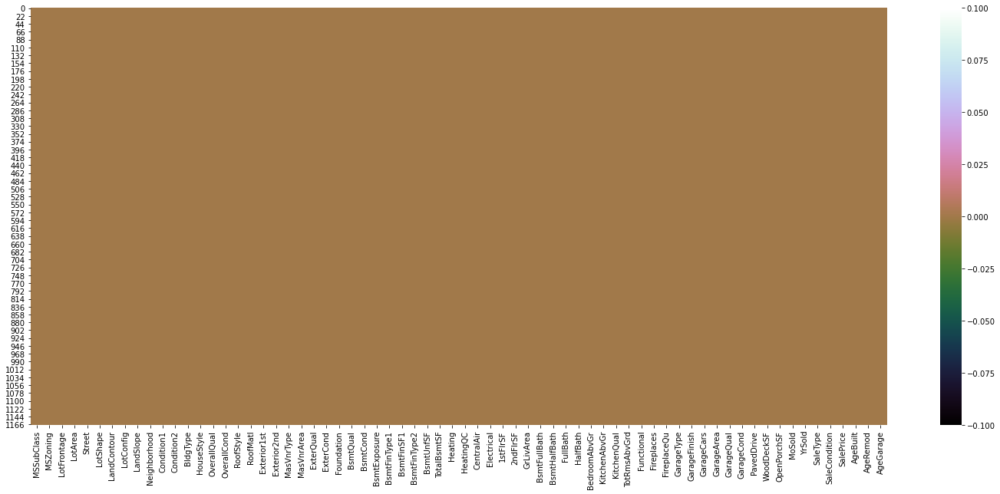

In [34]:
# Let's visualize the null values clearly using heat map
plt.figure(figsize=(25,10))
sns.heatmap(train_df.isnull(), cmap="cubehelix")
plt.show()

It is clear from the heat map that there are no null values in any of the column.

## Checking null values in test dataset

In [35]:
# Displaying the columns containing null values count and their % i.e. ((count of null)/292)/100

test_null = pd.DataFrame(test_df[test_df.columns[test_df.isnull().any()]].isnull().sum())
test_null.columns=['Count of Null Values']
test_null['% of Null Values']=test_null['Count of Null Values']/2.92     # 292/100 = 11.68
test_null

,Count of Null Values,% of Null Values
LotFrontage,45,15.410959
Alley,278,95.205479
MasVnrType,1,0.342466
MasVnrArea,1,0.342466
BsmtQual,7,2.397260
BsmtCond,7,2.397260
BsmtExposure,7,2.397260
BsmtFinType1,7,2.397260
BsmtFinType2,7,2.397260
Electrical,1,0.342466


- Above are the columns of test dataset containing null values. 
- Similar to train data, the columns PoolQC, MiscFeature, Alley and Fence have null values more than 70%, filing them with imputation methods is meaningless. So let me drop them as they have no importance in the prediction

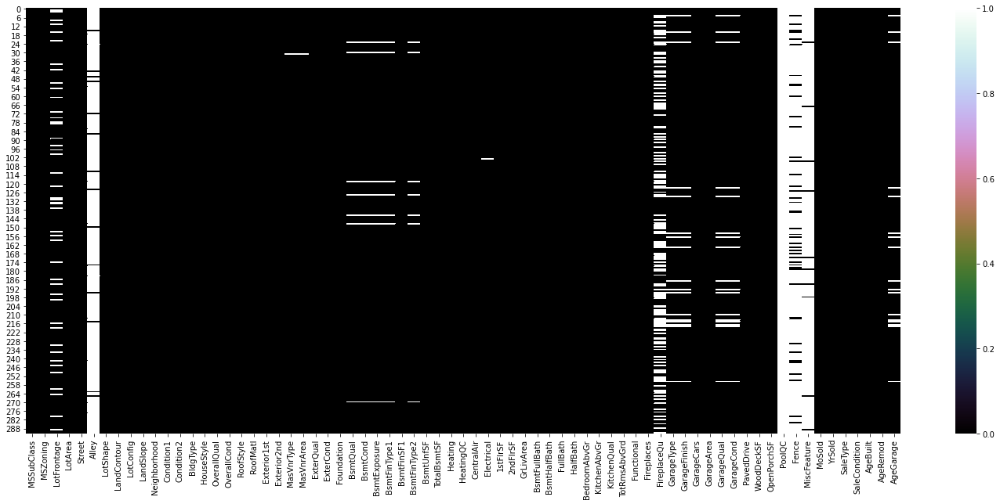

In [36]:
# Let's visualize the null values clearly using heat map
plt.figure(figsize=(25,10))
sns.heatmap(test_df.isnull(), cmap="cubehelix")
plt.show()

The white line shows the missing values in the dataset.

In [37]:
# Dropping the columns containing more than 70% of the null values
test_df.drop(["PoolQC", "MiscFeature", "Alley", "Fence"],axis=1,inplace=True)

## Treating null values using imputation techniques
- The columns LotFrontage, MasVnrArea and GarageYrBlt are numerical in nature, let's fill the null values using mean values as there are no outliers present in these columns.
- The remaining columns seems to be categorical so filling the null values using mode method.

In [38]:
# Filling null values of object data column with their mode values (most frequently occurred values).

cols1=test_df.columns.values
for i in range(0,len(cols1)):
    if test_df[cols1[i]].dtype == "object":
        test_df[cols1[i]].fillna(test_df[cols1[i]].mode()[0], inplace=True)

In [39]:
# Filling null values of numerical columns with their mean values

cols2=test_df.columns.values
for i in range(0,len(cols2)):
    if test_df[cols2[i]].dtype != "object":
        test_df[cols2[i]].fillna(test_df[cols2[i]].mean(), inplace=True)

In [40]:
test_df.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd     0
Functional       0
Fireplaces       0
FireplaceQu      0
GarageType       0
GarageFinish

I have filled all the null values using mean and mode method. Hence there are no null values in any of the column. Let's visualize it using heat map.

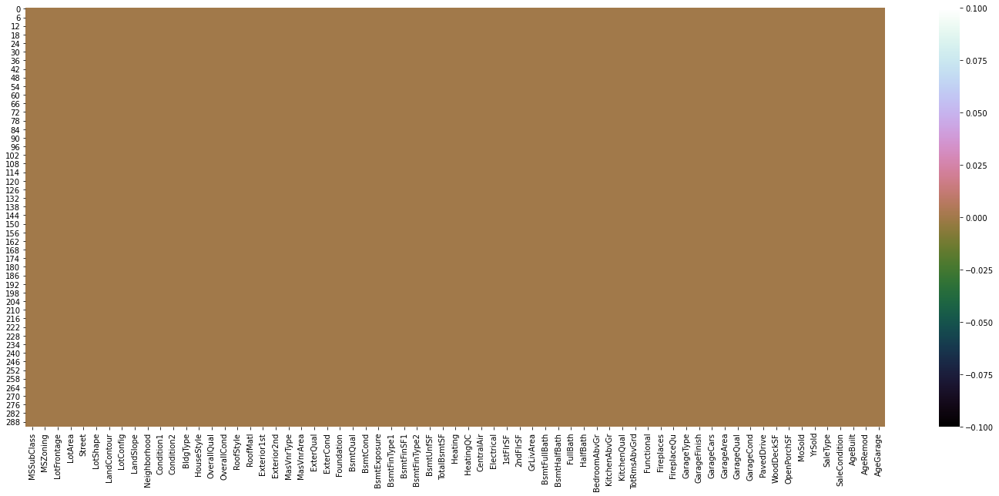

In [41]:
# Let's visualize the null values clearly using heat map
plt.figure(figsize=(25,10))
sns.heatmap(test_df.isnull(), cmap="cubehelix")
plt.show()

It is clear from the heat map that there are no null values in any of the column.

In [42]:
# Checking the uniqueness of target column
train_df["SalePrice"].unique()

array([128000, 268000, 269790, 190000, 215000, 219210, 121500, 155000,
       140000, 118500, 119500, 237000, 201000, 126500, 135500, 165000,
       120500, 194500, 148000, 106000, 231500, 133000, 142125, 136500,
       146000, 217000, 112000, 394432, 113000, 188700, 319900, 135000,
       128500, 169000, 122000, 152000, 243000, 156000,  79500, 132000,
       144152, 130000, 149900, 124500, 179000, 147000,  39300, 312500,
       256000,  60000, 153000,  84900, 230000, 180000, 106500, 239000,
       107500, 123000, 176000, 228500, 117500, 350000, 200624, 173000,
       225000,  84500, 174900,  79000, 297000,  87000, 465000, 204900,
       127000, 159000, 170000, 159500, 102000, 109500, 163990, 189950,
       119000, 157500, 287000, 144000, 286000, 172000, 212000, 124000,
       150000, 205950, 251000, 129000, 223500, 475000, 335000, 115000,
       205000, 209500, 176432, 171000, 302000, 259500, 141000, 187500,
       385000, 275000, 108000,  89500, 109900, 185000, 143000, 127500,
      

These are the unique values present in the target column.

In [43]:
# Checking the dimensions of both train and test dataset
print("Shape of train dataset is:",train_df.shape)
print("Shape of test dataset is:",test_df.shape)

Shape of train dataset is: (1168, 68)
Shape of test dataset is: (292, 67)


### Separating numerical and categorical columns.

In [44]:
# Separating numerical and categorcal columns from train dataset

# Checking for categorical columns
categorical_coltr=[]
for i in train_df.dtypes.index:
    if train_df.dtypes[i]=='object':
        categorical_coltr.append(i)
print("Categorical columns in train dataset are:\n",categorical_coltr)
print("\n")

# Now checking for numerical columns
numerical_coltr=[]
for i in train_df.dtypes.index:
    if train_df.dtypes[i]!='object':
        numerical_coltr.append(i)
print("Numerical columns in train dataset are:\n",numerical_coltr)

Categorical columns in train dataset are:
 ['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


Numerical columns in train dataset are:
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'SalePrice', 'AgeBuilt', 'AgeRe

These are the object data type and numerical type columns present in the train dataset.

In [45]:
# Separating numerical and categorcal columns from test dataset

# Checking for categorical columns
categorical_colte=[]
for i in test_df.dtypes.index:
    if test_df.dtypes[i]=='object':
        categorical_colte.append(i)
print("Categorical columns in test dataset are:\n",categorical_colte)
print("\n")

# Now checking for numerical columns
numerical_colte=[]
for i in test_df.dtypes.index:
    if test_df.dtypes[i]!='object':
        numerical_colte.append(i)
print("Numerical columns in test dataset are:\n",numerical_colte)

Categorical columns in test dataset are:
 ['MSZoning', 'Street', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


Numerical columns in test dataset are:
 ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'MoSold', 'YrSold', 'AgeBuilt', 'AgeRemod', 'AgeGarag

These are the categoricla and numerical columns present in the test dataset.

## Description of Train Dataset

In [46]:
# Statistical summary of dataset
train_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice,AgeBuilt,AgeRemod,AgeGarage
count,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.767979,70.988470,10484.749144,6.104452,5.595890,102.310078,444.726027,569.721747,1061.095034,1169.860445,348.826199,1525.066781,0.425514,0.055651,1.562500,0.388699,2.884418,1.045377,6.542808,0.617295,1.776541,476.860445,96.206336,46.559932,6.344178,2007.804795,181477.005993,36.874144,23.046233,29.608696
std,41.940650,22.437056,8957.442311,1.390153,1.124343,182.047152,462.664785,449.375525,442.272249,391.161983,439.696370,528.042957,0.521615,0.236699,0.551882,0.504929,0.817229,0.216292,1.598484,0.650575,0.745554,214.466769,126.158988,66.381023,2.686352,1.329738,79105.586863,30.193130,20.783486,24.247703
min,20.000000,21.000000,1300.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000,0.000000,-1.000000,0.000000
25%,20.000000,60.000000,7621.500000,5.000000,5.000000,0.000000,0.000000,216.000000,799.000000,892.000000,0.000000,1143.250000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1.000000,338.000000,0.000000,0.000000,5.000000,2007.000000,130375.000000,8.000000,4.000000,7.000000
50%,50.000000,70.988470,9522.500000,6.000000,5.000000,0.000000,385.500000,474.000000,1005.500000,1096.500000,0.000000,1468.500000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,2.000000,480.000000,0.000000,24.000000,6.000000,2008.000000,163995.000000,36.000000,14.000000,29.608696
75%,70.000000,79.250000,11515.500000,7.000000,6.000000,160.000000,714.500000,816.000000,1291.500000,1392.000000,729.000000,1795.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2.000000,576.000000,171.000000,70.000000,8.000000,2009.000000,215000.000000,54.000000,42.000000,46.250000
max,190.000000,313.000000,164660.000000,10.000000,9.000000,1600.000000,5644.000000,2336.000000,6110.000000,4692.000000,2065.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,4.000000,1418.000000,857.000000,547.000000,12.000000,2010.000000,755000.000000,135.000000,60.000000,107.000000


This gives the statistical information of the dataset. The summary of this dataset looks perfect since there is no negative/ invalid values present. It gives the summary of numerical data.

From the above description we can observe the following things

- The counts of every column is same which means there are no missing values preent in the dataset.
- In some of the columns the mean value is greater than the median(50%), which means they are sjewed to right.
- The median(50%) is bit greater than mean in some of the columns so they are skewed to left.
- From the description we can say that the mean sales price of the house is around 181477 dollars(say), maximum sale price is 755000 and min is 163995.
- By summarizing the data I can notice there is huge difference between maximum value and 75% percentile that leads to large number of outliers present in the dataset.
- I will remove these outliers using either Zscore or IQR method.


## Description of Test Dataset

In [47]:
# Statistical summary of dataset
test_df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,AgeBuilt,AgeRemod,AgeGarage
count,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.00000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000,292.000000
mean,57.414384,66.425101,10645.143836,6.078767,5.493151,109.171821,439.294521,557.315068,1042.767123,1133.691781,339.657534,1477.051370,0.424658,0.065068,1.575342,0.359589,2.794521,1.05137,6.417808,0.595890,1.729452,457.458904,86.397260,47.061644,6.232877,2007.859589,35.243151,22.565068,28.090909
std,43.780649,19.975962,13330.669795,1.356147,1.063267,174.729023,429.559675,411.043768,424.561153,366.941919,424.278825,514.199429,0.508831,0.247070,0.547856,0.494795,0.807336,0.23616,1.728105,0.621259,0.754430,210.785591,121.898836,65.865449,2.774556,1.322867,30.494309,20.089470,23.145196
min,20.000000,21.000000,1526.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,372.000000,0.000000,520.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,0.000000,0.000000,0.000000
25%,20.000000,57.750000,7200.000000,5.000000,5.000000,0.000000,0.000000,255.000000,771.750000,858.000000,0.000000,1061.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.00000,5.000000,0.000000,1.000000,300.000000,0.000000,0.000000,4.000000,2007.000000,6.750000,4.000000,6.000000
50%,50.000000,66.425101,9200.000000,6.000000,5.000000,0.000000,369.500000,487.000000,971.000000,1047.500000,0.000000,1440.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.00000,6.000000,1.000000,2.000000,467.500000,0.000000,28.500000,6.000000,2008.000000,32.000000,14.000000,28.090909
75%,70.000000,76.000000,11658.750000,7.000000,6.000000,180.000000,700.500000,780.000000,1322.000000,1370.500000,717.000000,1720.250000,1.000000,0.000000,2.000000,1.000000,3.000000,1.00000,7.000000,1.000000,2.000000,569.750000,149.250000,66.000000,8.000000,2009.000000,53.250000,39.250000,42.000000
max,190.000000,150.000000,215245.000000,10.000000,9.000000,1031.000000,1767.000000,1935.000000,3094.000000,2402.000000,1589.000000,3447.000000,2.000000,1.000000,3.000000,2.000000,6.000000,3.00000,12.000000,2.000000,4.000000,1052.000000,728.000000,418.000000,12.000000,2010.000000,136.000000,60.000000,90.000000


Similar to train dataset, here also we can observe the statistical information of test data.

Now it's time to visualize the data.

# Data Visualization
## Univariate Analysis
### Plotting categorical columns

Let's visualize the categorical data using Pie plots and count plots.
### Pie Plots

Pie plot for the column: Street
Pave    1164
Grvl       4
Name: Street, dtype: int64


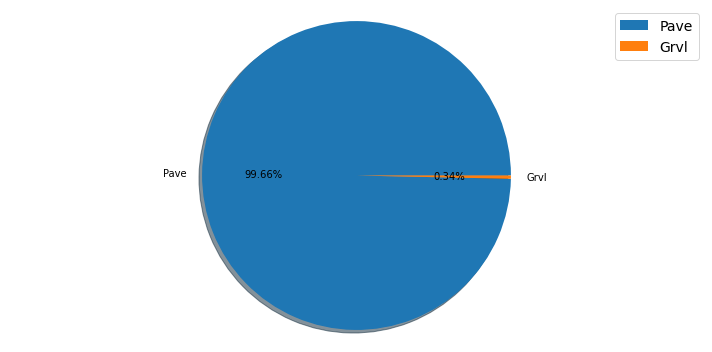

*****************************************************************************************************************************
Pie plot for the column: LotShape
Reg    740
IR1    390
IR2     32
IR3      6
Name: LotShape, dtype: int64


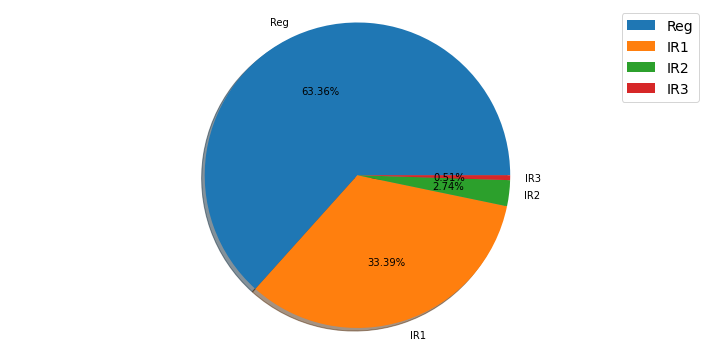

*****************************************************************************************************************************
Pie plot for the column: LandContour
Lvl    1046
Bnk      50
HLS      42
Low      30
Name: LandContour, dtype: int64


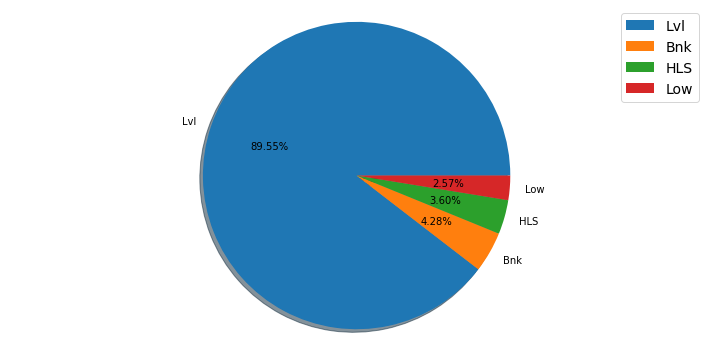

*****************************************************************************************************************************
Pie plot for the column: LandSlope
Gtl    1105
Mod      51
Sev      12
Name: LandSlope, dtype: int64


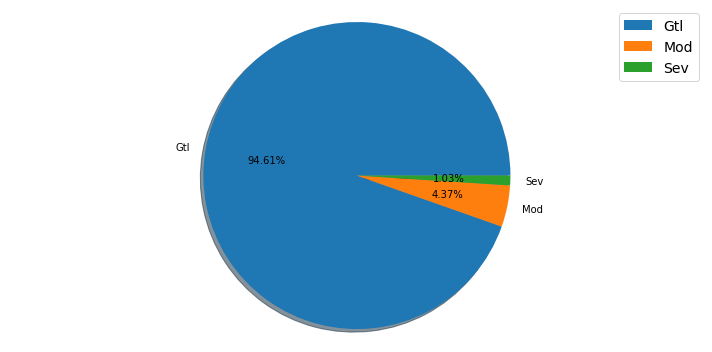

*****************************************************************************************************************************
Pie plot for the column: MasVnrType
None       703
BrkFace    354
Stone       98
BrkCmn      13
Name: MasVnrType, dtype: int64


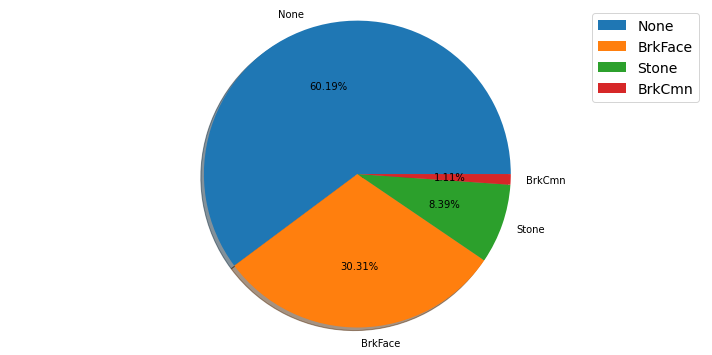

*****************************************************************************************************************************
Pie plot for the column: ExterQual
TA    717
Gd    397
Ex     43
Fa     11
Name: ExterQual, dtype: int64


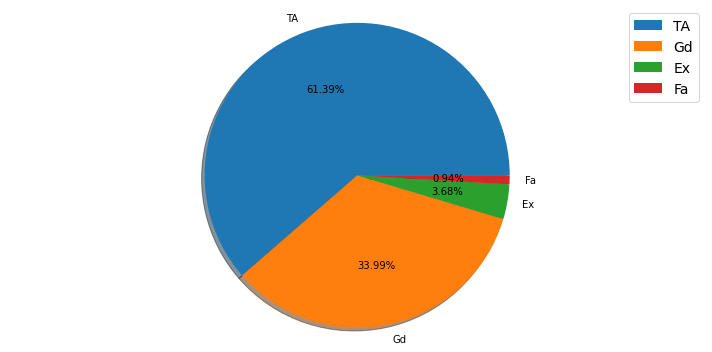

*****************************************************************************************************************************
Pie plot for the column: BsmtQual
TA    547
Gd    498
Ex     94
Fa     29
Name: BsmtQual, dtype: int64


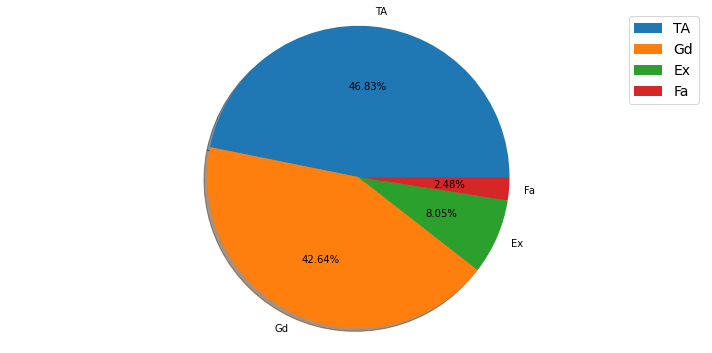

*****************************************************************************************************************************
Pie plot for the column: BsmtCond
TA    1071
Gd      56
Fa      39
Po       2
Name: BsmtCond, dtype: int64


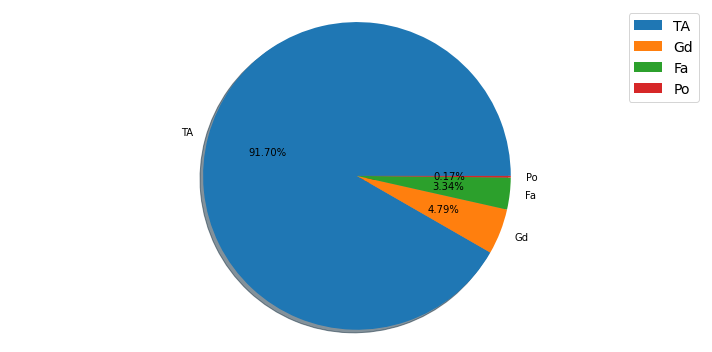

*****************************************************************************************************************************
Pie plot for the column: BsmtExposure
No    787
Av    180
Gd    108
Mn     93
Name: BsmtExposure, dtype: int64


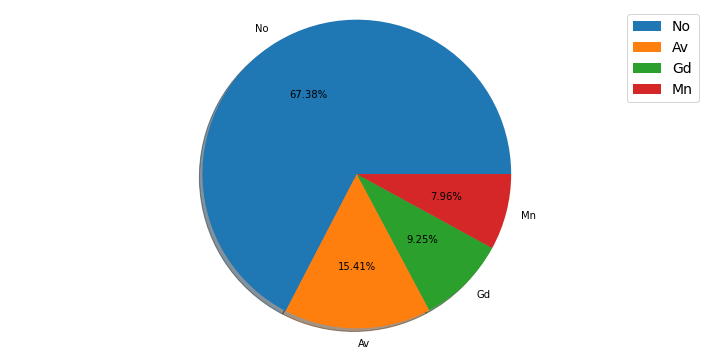

*****************************************************************************************************************************
Pie plot for the column: CentralAir
Y    1090
N      78
Name: CentralAir, dtype: int64


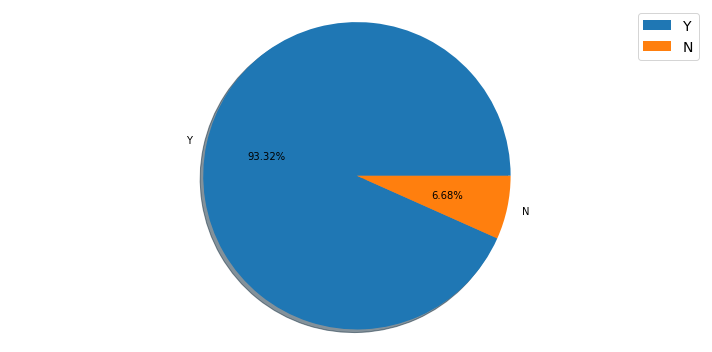

*****************************************************************************************************************************
Pie plot for the column: KitchenQual
TA    578
Gd    478
Ex     82
Fa     30
Name: KitchenQual, dtype: int64


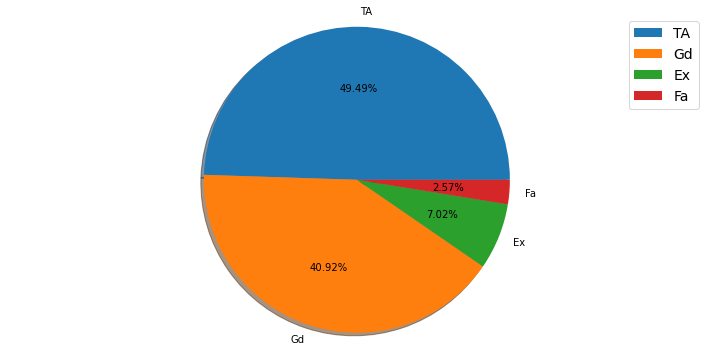

*****************************************************************************************************************************
Pie plot for the column: GarageFinish
Unf    551
RFn    339
Fin    278
Name: GarageFinish, dtype: int64


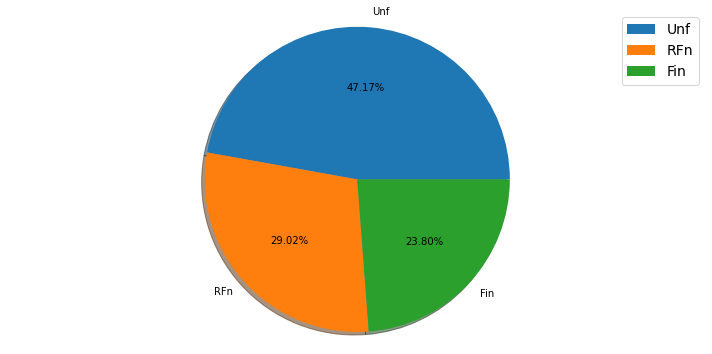

*****************************************************************************************************************************
Pie plot for the column: PavedDrive
Y    1071
N      74
P      23
Name: PavedDrive, dtype: int64


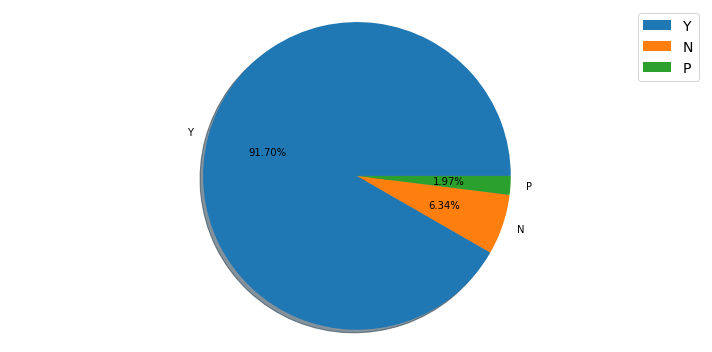

*****************************************************************************************************************************


In [47]:
def generate_pie(i):
    plt.figure(figsize=(10,5))
    plt.pie(i.value_counts(), labels=i.value_counts().index, autopct='%1.2f%%',shadow=True,)
    plt.legend(prop={'size':14})
    plt.axis('equal')
    plt.tight_layout()
    return plt.show()

cols1 = ['Street', 'LotShape','LandContour','LandSlope', 'MasVnrType','ExterQual','BsmtQual','BsmtCond','BsmtExposure','CentralAir','KitchenQual','GarageFinish','PavedDrive']

plotnumber=1
for j in train_df[cols1]:
    print(f"Pie plot for the column:", j)
    print(train_df[j].value_counts())
    generate_pie(train_df[j])
    print("*"*125)

### Observations:
- **Street:** The count of road access to the property Paved is 1164 which covers around 99.66% of the property where Graved type has count 4 that is only 0.34%.
- **LotShape:** The count is high for the property having the shape regular followed by slightly regular and the count is less for irregular shape of property.
- **LandContour:** The total number of flatness of the property for level is high which has 89.55% and the others like banked, hillside and depression have very less flatness of area.
- **LandSlope:** The slope of the property Gentle slope has very high count of 1105 i.e, 94.61% and other types Moderate Slope and Severe Slope have very less count.
- **MasVnrType:** Around 60% of the houses does not have Masonry veneer type, 30% of the houses contains Brick Face type of Masonry veneer.
- **ExterQual:** Around 61% of the houses evaluates typical/average quality of the material on the exterior, 34% of the houses have good quality of the material on the exterior. Only few have excellent quality.
- **BsmtQual:** Most of the houses evaluates typical/average and good quality of heoght of the basement, only few of the houses have excellent quality.
- **BsmtCond:** Around 91% of the houses have typical/average condition of the basement and only 2 houses have poor condion.
- **BsmtExposure:** Around 67% of the houses does not contain any walkout or garden  level walls and 7% of the houses have minimum exposure.
- **CentralAir:** 93.32% of the houses have central air conditioning and only 6.68% of houses do not have air conditioning.
- **KitchenQual:** 49% of the houses contains typical/average kitchen quality and 40% of the houses have good kutchen quality. The count for excellent kitchen quality is very low and is around 2%.
- **GarageFinish:** 47% Of the houses have unfinished garage interior, 29% rough finished and only 23% of the houses' interior garage has finished.
- **PavedDrive:** 91.70% of the houses contains the paved drive way.

### Count Plots
Let's visualize the remaining nominal data.

In [48]:
def value_count(column):
    counts=len(train_df[column].value_counts())
    if counts<3:
        plt.figure(figsize=(8,5))
    elif counts<5:
        plt.figure(figsize=(8,5))
        plt.xticks(rotation=90)
    elif counts<10:
        plt.figure(figsize=(10,6))
        plt.xticks(rotation=90)
    else:
        plt.figure(figsize=(10,8))
        plt.xticks(rotation=90)
    sns.countplot(x=column,data=train_df,palette="Dark2")
    plt.show()
    print("*"*125)

RL         928
RM         163
FV          52
RH          16
C (all)      9
Name: MSZoning, dtype: int64


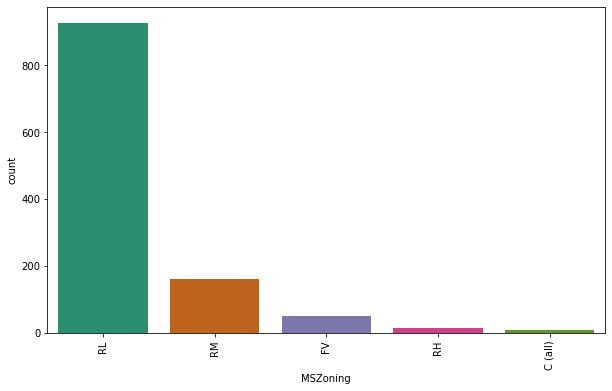

*****************************************************************************************************************************
Inside     842
Corner     222
CulDSac     69
FR2         33
FR3          2
Name: LotConfig, dtype: int64


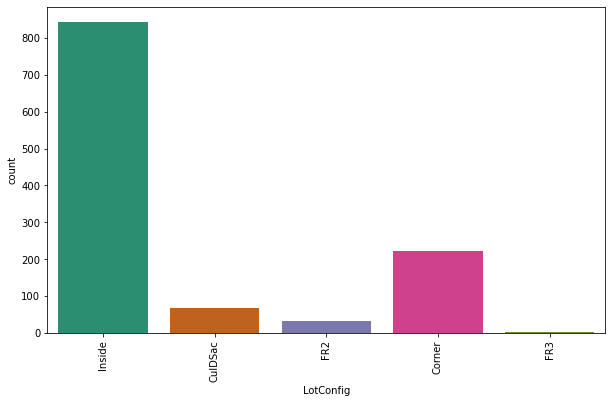

*****************************************************************************************************************************
NAmes      182
CollgCr    118
OldTown     86
Edwards     83
Somerst     68
Gilbert     64
NridgHt     61
Sawyer      60
NWAmes      59
SawyerW     51
BrkSide     50
Crawfor     45
NoRidge     35
Mitchel     34
IDOTRR      30
Timber      24
ClearCr     24
SWISU       21
StoneBr     19
Blmngtn     15
BrDale      11
MeadowV      9
Veenker      9
NPkVill      8
Blueste      2
Name: Neighborhood, dtype: int64


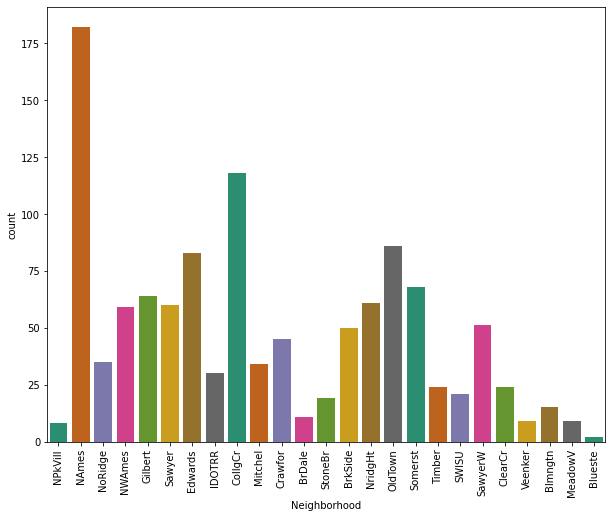

*****************************************************************************************************************************
Norm      1005
Feedr       67
Artery      38
RRAn        20
PosN        17
RRAe         9
PosA         6
RRNn         4
RRNe         2
Name: Condition1, dtype: int64


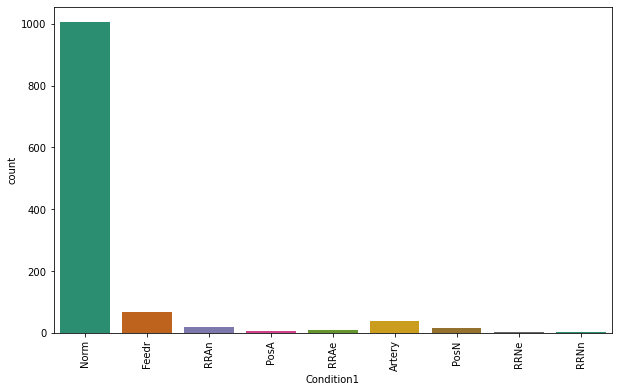

*****************************************************************************************************************************
Norm      1154
Feedr        6
Artery       2
PosN         2
PosA         1
RRAe         1
RRNn         1
RRAn         1
Name: Condition2, dtype: int64


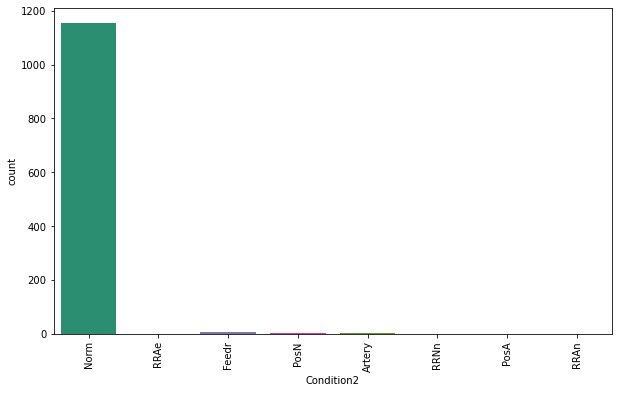

*****************************************************************************************************************************
1Fam      981
TwnhsE     90
Duplex     41
Twnhs      29
2fmCon     27
Name: BldgType, dtype: int64


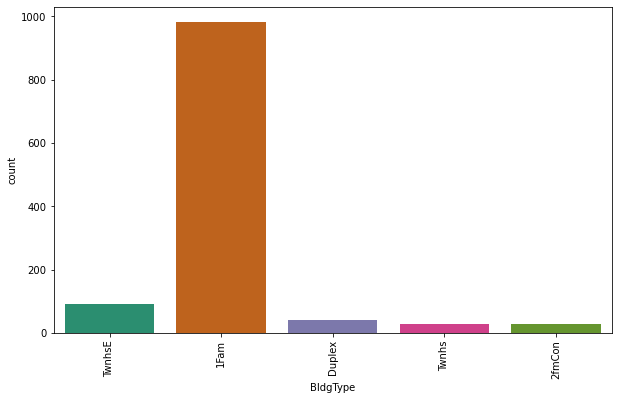

*****************************************************************************************************************************
1Story    578
2Story    361
1.5Fin    121
SLvl       47
SFoyer     32
1.5Unf     12
2.5Unf     10
2.5Fin      7
Name: HouseStyle, dtype: int64


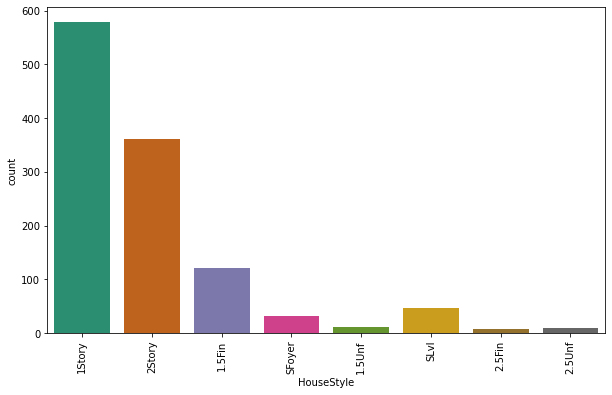

*****************************************************************************************************************************
Gable      915
Hip        225
Flat        12
Gambrel      9
Mansard      5
Shed         2
Name: RoofStyle, dtype: int64


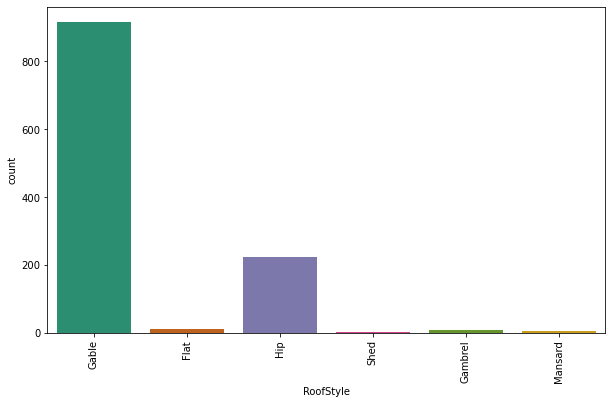

*****************************************************************************************************************************
CompShg    1144
Tar&Grv      10
WdShngl       6
WdShake       4
Roll          1
Membran       1
Metal         1
ClyTile       1
Name: RoofMatl, dtype: int64


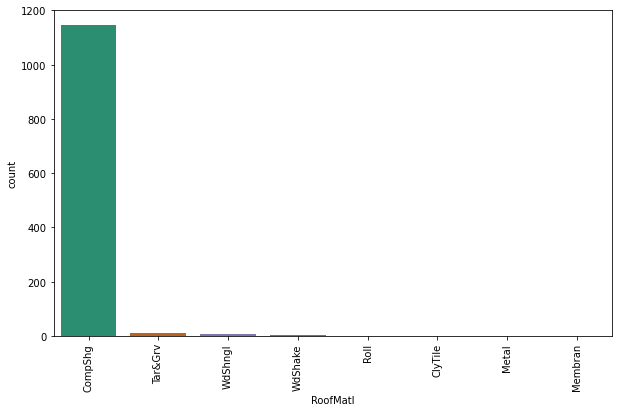

*****************************************************************************************************************************
VinylSd    396
HdBoard    179
MetalSd    178
Wd Sdng    174
Plywood     93
CemntBd     42
BrkFace     41
Stucco      22
AsbShng     19
WdShing     19
Stone        2
ImStucc      1
AsphShn      1
BrkComm      1
Name: Exterior1st, dtype: int64


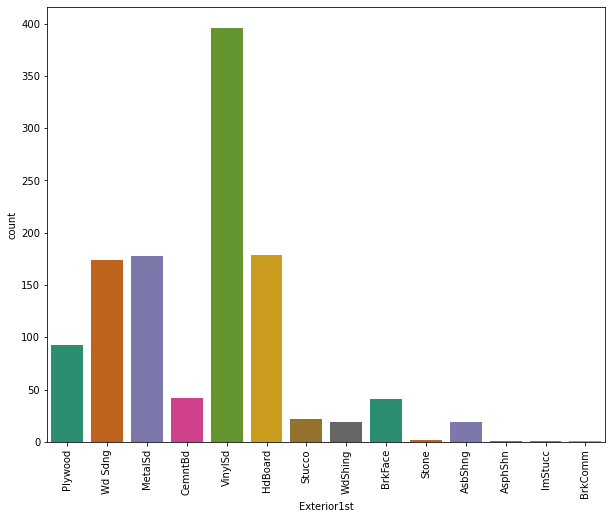

*****************************************************************************************************************************
VinylSd    387
MetalSd    173
HdBoard    170
Wd Sdng    165
Plywood    118
CmentBd     42
Wd Shng     31
Stucco      23
BrkFace     20
AsbShng     18
ImStucc      8
Brk Cmn      5
Stone        4
AsphShn      3
Other        1
Name: Exterior2nd, dtype: int64


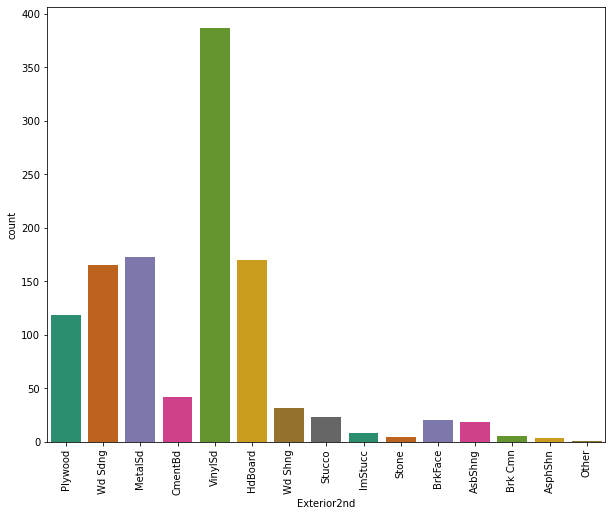

*****************************************************************************************************************************
TA    1022
Gd     117
Fa      26
Ex       2
Po       1
Name: ExterCond, dtype: int64


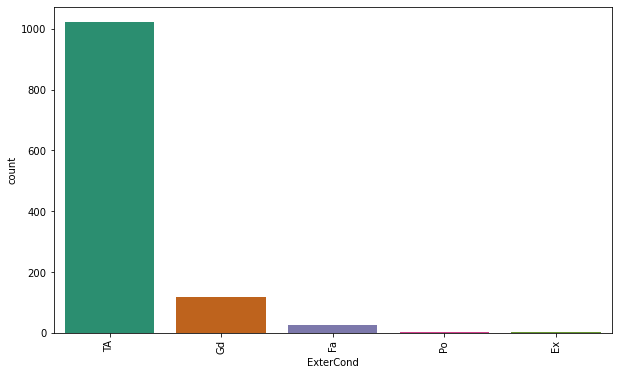

*****************************************************************************************************************************
CBlock    516
PConc     513
BrkTil    112
Slab       21
Stone       5
Wood        1
Name: Foundation, dtype: int64


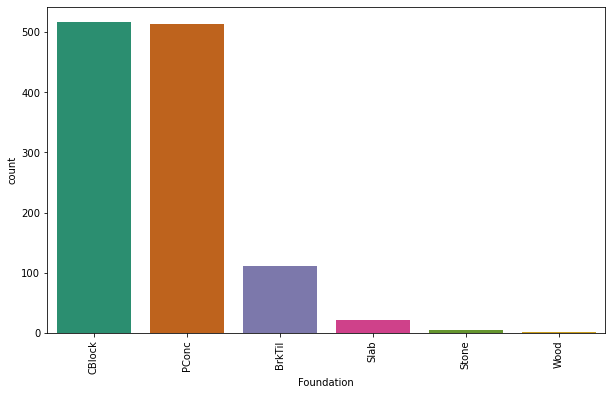

*****************************************************************************************************************************
Unf    375
GLQ    330
ALQ    174
BLQ    121
Rec    109
LwQ     59
Name: BsmtFinType1, dtype: int64


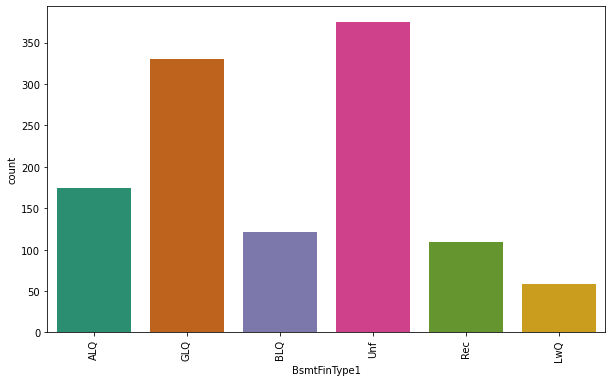

*****************************************************************************************************************************
Unf    1033
Rec      43
LwQ      40
BLQ      24
ALQ      16
GLQ      12
Name: BsmtFinType2, dtype: int64


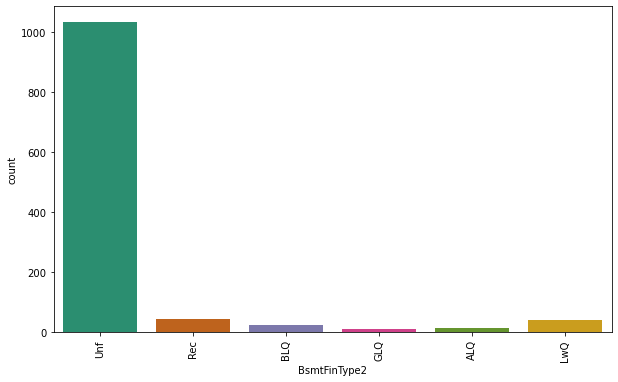

*****************************************************************************************************************************
GasA     1143
GasW       14
Grav        5
Wall        4
Floor       1
OthW        1
Name: Heating, dtype: int64


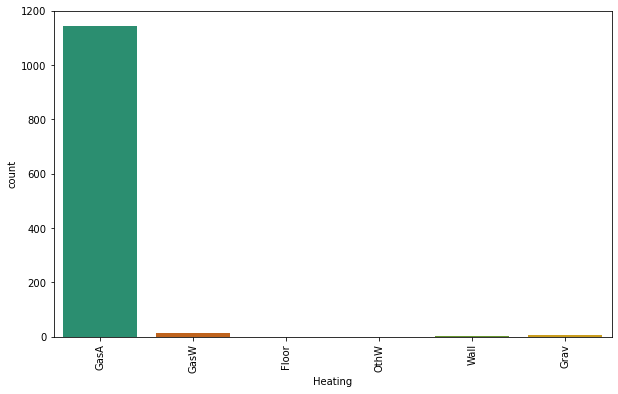

*****************************************************************************************************************************
Ex    585
TA    352
Gd    192
Fa     38
Po      1
Name: HeatingQC, dtype: int64


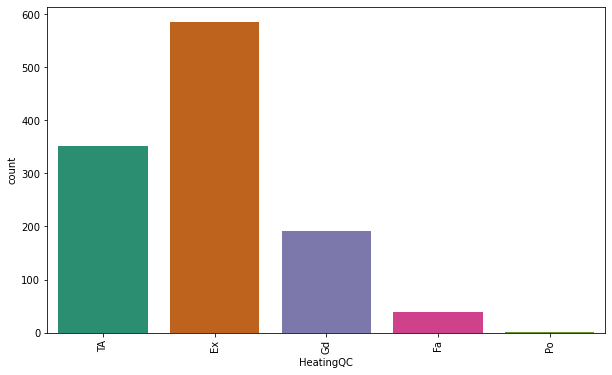

*****************************************************************************************************************************
SBrkr    1070
FuseA      74
FuseF      21
FuseP       2
Mix         1
Name: Electrical, dtype: int64


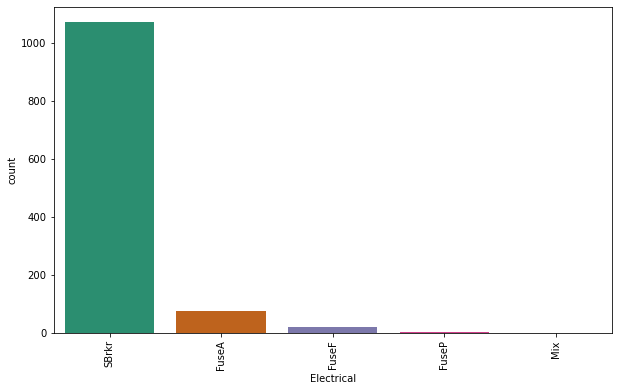

*****************************************************************************************************************************
Typ     1085
Min2      30
Min1      25
Mod       12
Maj1      11
Maj2       4
Sev        1
Name: Functional, dtype: int64


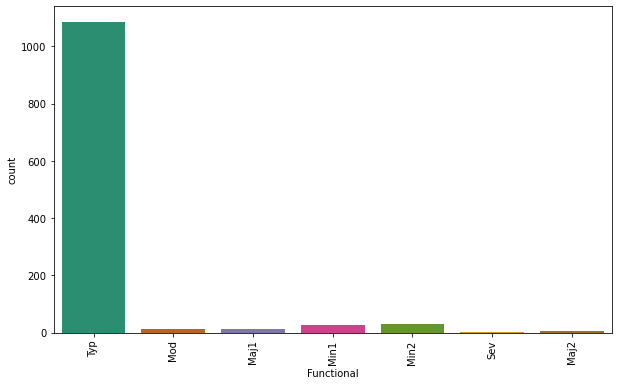

*****************************************************************************************************************************
Gd    852
TA    252
Fa     25
Ex     21
Po     18
Name: FireplaceQu, dtype: int64


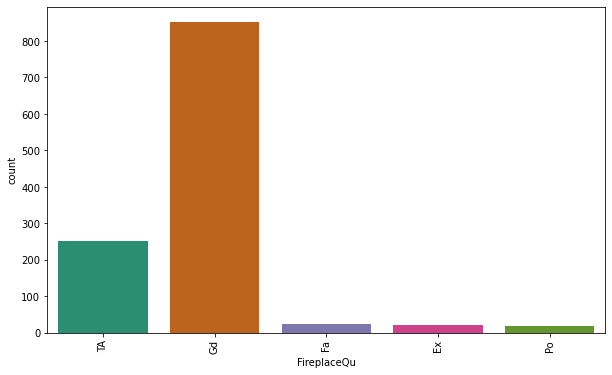

*****************************************************************************************************************************
Attchd     755
Detchd     314
BuiltIn     70
Basment     16
CarPort      8
2Types       5
Name: GarageType, dtype: int64


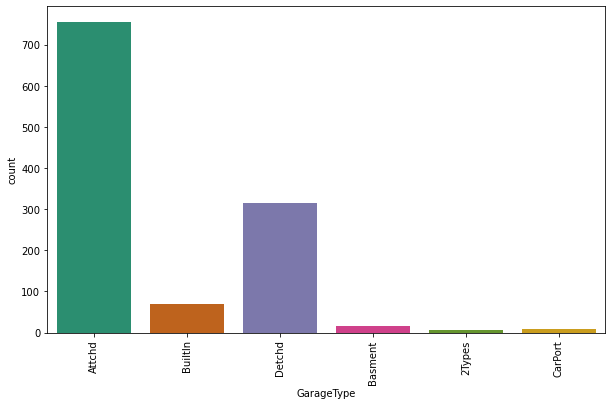

*****************************************************************************************************************************
TA    1114
Fa      39
Gd      11
Po       2
Ex       2
Name: GarageQual, dtype: int64


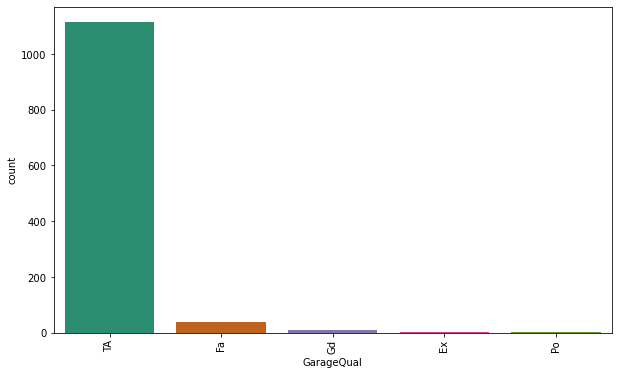

*****************************************************************************************************************************
TA    1125
Fa      28
Gd       8
Po       6
Ex       1
Name: GarageCond, dtype: int64


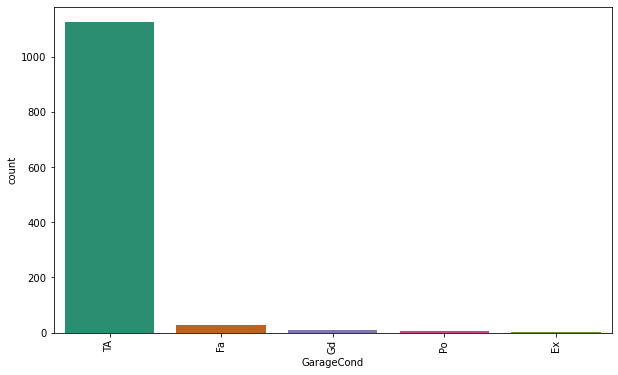

*****************************************************************************************************************************
WD       999
New      106
COD       38
ConLD      8
ConLI      5
ConLw      4
CWD        3
Oth        3
Con        2
Name: SaleType, dtype: int64


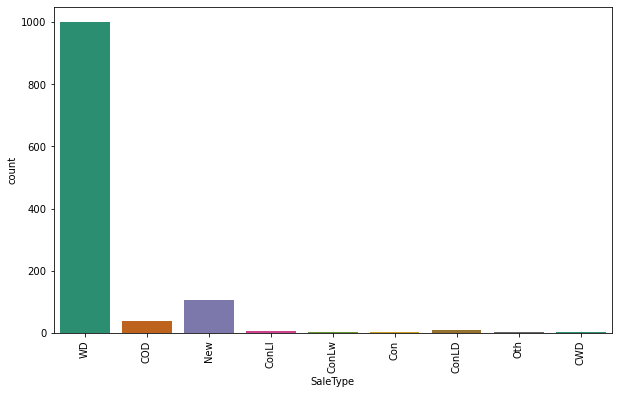

*****************************************************************************************************************************
Normal     945
Partial    108
Abnorml     81
Family      18
Alloca      12
AdjLand      4
Name: SaleCondition, dtype: int64


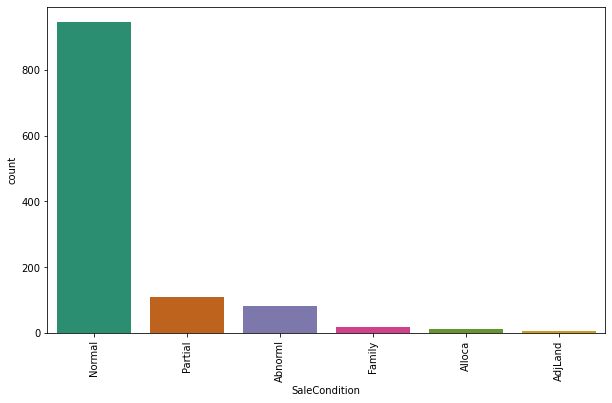

*****************************************************************************************************************************


In [49]:
df1 = train_df[['MSZoning','LotConfig',  'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',  'ExterCond', 'Foundation','BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC',  'Electrical',  'Functional', 'FireplaceQu', 'GarageType',  'GarageQual', 'GarageCond', 'SaleType', 'SaleCondition']]
for i in df1:
    print(df1[i].value_counts())
    value_count(i)

### Observations:
- **MSZoning:** The houses having Residential Low Density zoning of the sale have high count and commercial zoning sale have very less count compared to others.
- **LotConfig:** Inside lot configiration has high count and Frontage on 3 sides of property have very less count compared to others.
- **Neighborhood:** The count is high for the North Ames cities floowed by college creek and count is very low for Bluestem.
- **Condition1:** The count is high for the Normal proximity condition apart from this all the others have very less count.
- **Condition2:** Similar to condition1, in comdition2 also Normal proximity has very high count compared to others.
- **BldgType:** Single-family detached dwelling type has very high counts compared to other types have very less count.
- **HouseStyle:** 1 story style of dwelling has high count followed by 2 story and others have very less count.
- **RoofStyle:** The flat type roof has high count and shed has very less count.
- **RoofMatl:** The roof material type Standard (Composite) Shingle has highest count and others have very less counts.
- **Exterior1st:** Most of the houses have Vinyl Siding exterior covering materials followed by hard board also Brick Common, Asphalt Shingles and Imitation Stucco have very count which means there are no more houses with these types.
- **Exterior2nd:** Similar to Exterior1st, here also most of the houses have Vinyl Siding exterior covering materials.
- **ExterCond:** The present condition of the material on the exterior for most of the houses are Average/Typical. 
- **Foundation:** Most of the houses have Cinder Block and Poured Contrete type of foundation.
- **BsmtFinType1:** The count is high for the houses having unfinished basement area. Also some houses have Good Living Quarters.
- **BsmtFinType2:** Similar to BsmtFinType1, here also the count is high for unfinished basements.
- **Heating:** Most of the houses have Gas forced warm air furnace heating type.
- **HeatingQC:** Most of the houses have excellent heating quality and condition also some houses have typical/average HeatingQC and only 1%  of the houses have poor heating quality and condition.
- **Electrical:** The electrical system of the type Standard Circuit Breakers & Romex has very high count which means most of the houses have this facility. 
- **Functional:** The total number of home functionality of the property for typical functionality have high count compared to others.
- **FireplaceQu:** The houses with Masonry Fireplace in main level have good quality compared ot others.
- **GarageType:** The garage location attachec to home has high count also the garage locations detached to home have moderate level of counts. Only few houses have car port and more than one type of garage.
- **GarageQual:** Houses with typical/average garage quality have high count compared to others.
- **GarageCond:** Houses with typical/average garage condition have high count compared to others.
- **SaleType:** Warranty Deed type of sale has high count followed by Home just constructed and sold(new).
- **SaleCondition:** Mormal sale has high count also the home which was not completed when last assessed also has average sale condition.

## Distribution of skewness
### Plotting numerical columns using 

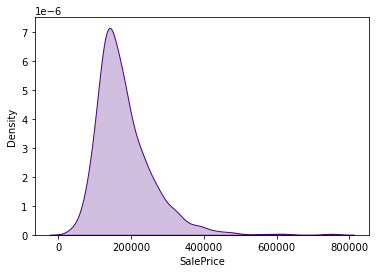

In [50]:
# Let's visualize the target variable SalePrice
plt.figure(figsize=(6,4))
sns.distplot(train_df["SalePrice"],color="indigo",kde_kws={"shade": True},hist=False)
plt.show()

The data in the target variable SalePrice is almost normally distributed. The maximum SalePrice of the house is around 200000. 

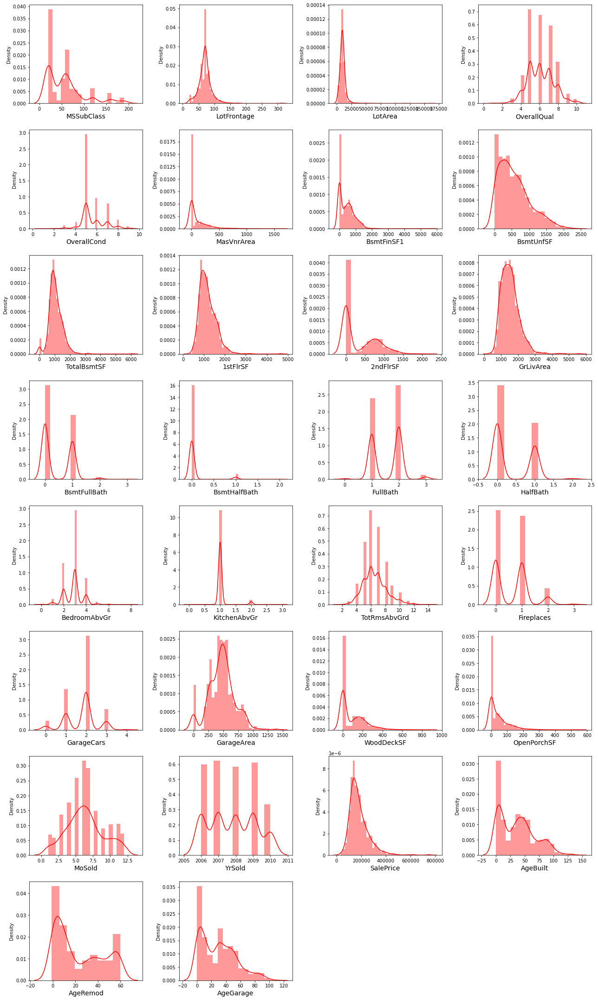

In [51]:
# Checking how the data has been distriubted in each column

plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in numerical_coltr:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.distplot(train_df[column],color="r")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

- From the above distribution plot I can observe most of the columns are not normally distributed only of the columns are almost distributed normally.
- Almost all the columns have skewness and are skewed to right since the mean is greater than the median in these columns. We need to remove this skewness before building our machine learning models.

## Bivariate Analysis
### Plotting Nominal variables vs SalePrice

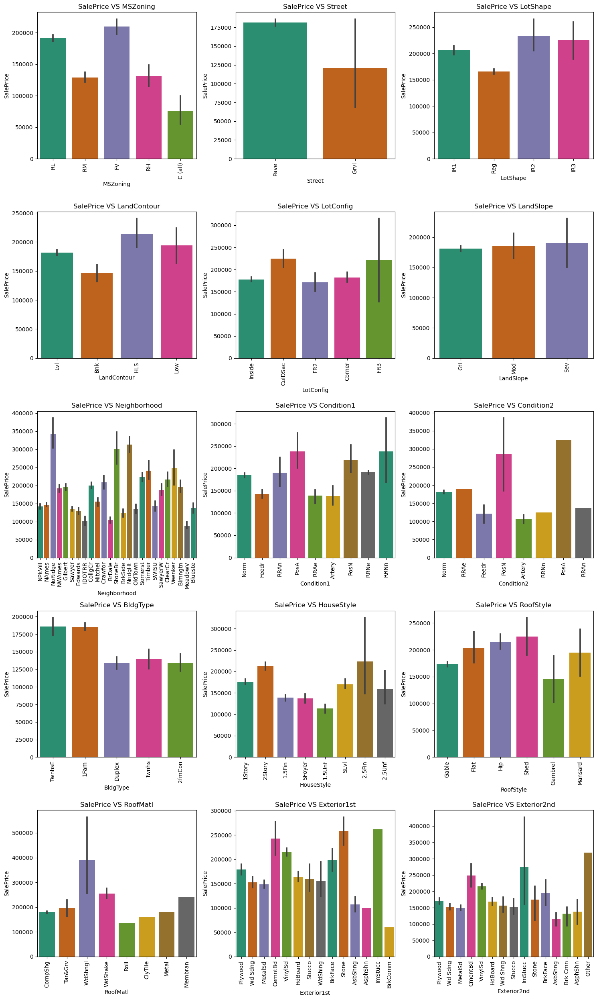

In [52]:
# Cheching relation between nominal categorical variables and target variable
nominal_data1 = ['MSZoning','Street','LotShape','LandContour','LotConfig','LandSlope','Neighborhood','Condition1','Condition2','BldgType','HouseStyle','RoofStyle','RoofMatl','Exterior1st','Exterior2nd']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(nominal_data1)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[nominal_data1[i]],palette="Dark2")
    plt.title(f"SalePrice VS {nominal_data1[i]}",fontsize=12)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

### Observations:
- **SalePrice vs MSZoning:** Most of the houses are belongs to Floating Village Residential followed by Residential Low Density. The houses from this zone are have high saleprice compared to other zones.
- **SlaePrice vs Street:** By observing the bar plot, it is obvious that the property of house with Paved type of road have high SalePrice and the the houses in gravel roads have very less sale price. 
- **SlaePrice vs LotShape:** Most of the houses having moderately irregular and irregular shape of property have high sale price and houses with regullar type of property have less sale peice compared to others.
- **SalePrice vs LandContour:** The houses having the hillside and depression property flatness have high sale price compared to others.
- **SalePrice vs LotConfig:** Most of the houses with Frontage on 3 sides of property have high sale price compared to others.
- **SalePrice vs LandSlope:** There is no significance difference between the slope of the property. As we can observe the houses having Gentle slope, Moderate Slope and Severe Slope have same sale price.
- **SalePrice vs Neighborhood:** The houses which are located near Northridge have high sale price compared to others.
- **SalePrice vs Condition1:** The houses having the conditions adjacent to postive off-site feature and houses within 200' of North-South Railroad have high sale price compared to others.
- **SalePrice vs Condition2:** The houses having the conditions near positive off-site feature park, greenbelt, etc and adjacent to postive off-site feature have high sale price.
- **SalePrice vs BldgType:** Most of the houses are Single-family Detached and Townhouse End Unit and they have higher sale price compared to other categories.
- **SalePrice vs HouseStyle:** Houses which are having style of dwelling 2nd level finished and Two story have high sale price compared to other types.
- **SalePrice vs RoofStyle:** The houses having the roof style Flat, Hip and Shed have high sale price and the houses having gabrel roof style have less sale price.
- **SalePrice vs RoofMatl:** Houses with Wood Shingles root materials have high sale prices.
- **SalePrice vs Exterior1st:** Houses having Imitation Stucco, Stone and Cement Board as 1st exterior cover have high sale price.
- **SalePrice vs Exterior2nd:** Houses having Imitation Stucco and other as 2nd cover have high sale price.

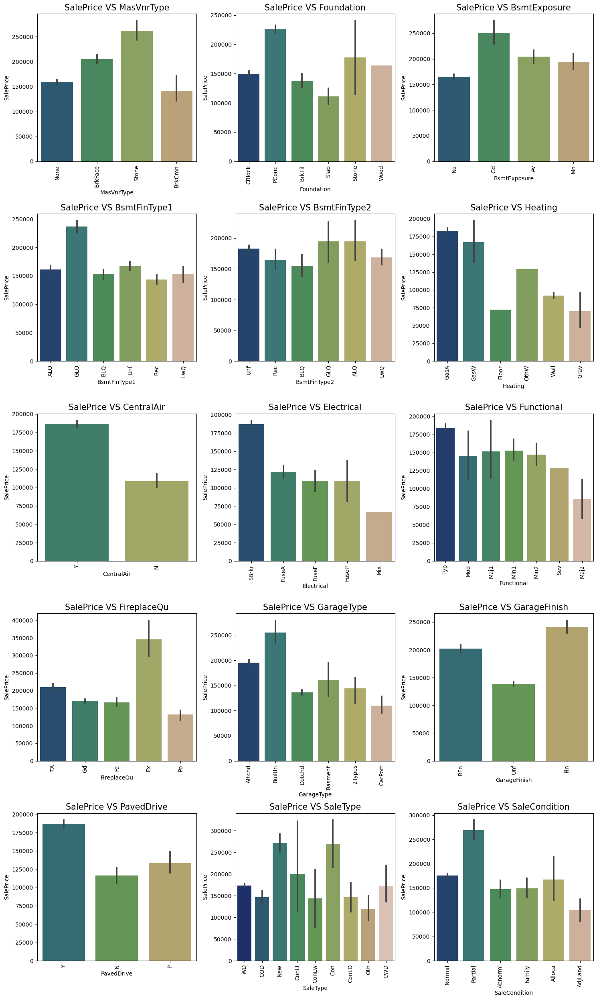

In [53]:
# Cheching relation between nominal categorical variables and target variable
nominal_data2 = ['MasVnrType','Foundation','BsmtExposure','BsmtFinType1','BsmtFinType2','Heating','CentralAir','Electrical','Functional','FireplaceQu','GarageType','GarageFinish','PavedDrive','SaleType','SaleCondition']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(nominal_data2)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[nominal_data2[i]],palette="gist_earth")
    plt.title(f"SalePrice VS {nominal_data2[i]}",fontsize=15)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

### Observations:
- **SalePrice vs MasVnrType:** Houses having Stone Masonry veneer type have high sale price than other types.
- **SalePrice vs Foundation:** Houses having Poured Contrete as foundation type have high sale price compared to other types.
- **SalePrice vs BsmtExposure:** Houses having good walkout or garden level walls have high sale price compared to others.
- **SalePrice vs BsmtFinType1:** The sale price is high for the houses containing good living quarters basement finished area.
- **SalePrice vs BsmtFinType2:** The sale price is moderately high for the houses having good living quarters and average living quarters.
- **SalePrice vs Heating:** The houses having the heating type gas forced warm air furnace and gas hot water or steam heat have high sale price.
- **SalePrice vs CentralAir:** Most of the houses have central air conditioning so it is obvious that these houses have high sale price.
- **SalePrice vs Electrical:** Most of the houses having standard circuit breakers & romex have high sale price compared to others.
- **SalePrice vs Functional:** The houses having the typical functionality have maximum sales price and others have average sale price.
- **SalePrice vs FireplaceQu:** The houses having excellent exceptional masonry fireplace quality have high sale price and the houses having poor fireplace quality have very less sale price compared to others.
- **SalePrice vs GarageType:** The houses having built-in garage have high sale price compared to others.
- **SalePrice vs GarageFinish:** Garages located inside the house which is got finished have high sale price.
- **SalePrice vs PavedDrive:** Houses having paved drive ways have high sale price.
- **SalePrice vs SaleType:** Many houses having sale types as just constructed and sold and Contract 15% Down payment regular terms have high sale price.
- **SalePrice vs SaleCondition:** Houses having partial sale condition that is home was not completed when last assessed have high sale price.

### Plotting Ordinal Variables vs SalePrice

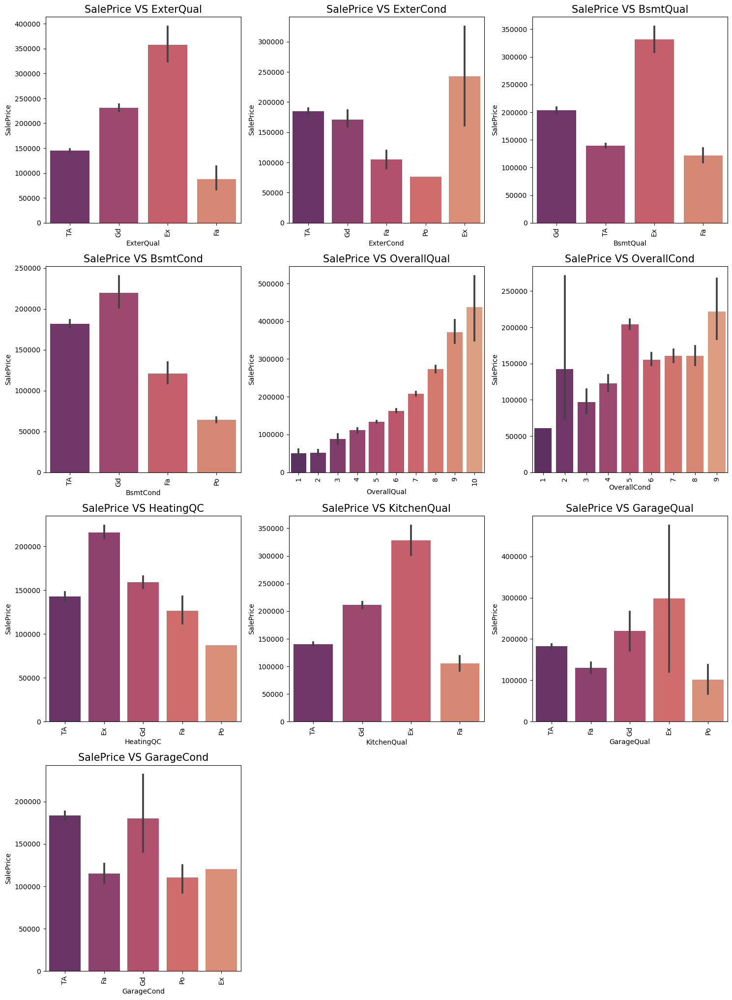

In [54]:
# Cheching relation between ordinal categorical variables and target variable
ordinal_data = ['ExterQual','ExterCond','BsmtQual','BsmtCond','OverallQual','OverallCond','HeatingQC','KitchenQual','GarageQual','GarageCond']
plt.style.use('default')
plt.figure(figsize=(15,25))
for i in range(len(ordinal_data)):
    plt.subplot(5,3,i+1)
    sns.barplot(y=train_df['SalePrice'],x=train_df[ordinal_data[i]],palette="flare_r")
    plt.title(f"SalePrice VS {ordinal_data[i]}",fontsize=15)
    plt.xticks(rotation = 90)  
    plt.tight_layout()

### Observations:
- **SalePrice vs ExterQual:** Houses having excellent quality of the material on the exterior have high sale price and houses having fair quality have very less sale price.
- **SalePrice vs ExterCond:** Houses having excellent condition of the material on the exterior have high sale price and the houses having poor condition of the material on the exterior have very less sale price compared to others.
- **SalePrice vs BsmtQual:** The houses which evaluates the excellent quality of height of the basement have high sale price compared to others.
- **SalePrice vs BsmtCond:** The houses which evaluates the good quality of general condition of the basement have high sale price compared to others.
- **SalePrice vs OverallQual:** The houses which have very excellent overall quality like material and finish of the house have high sale price. Also we can observe from the plot as the overall quality of the house increases, the sale price also increases. That is there is good linear relation between SalePrice and OverallQual.
- **SalePrice vs OverallCond:** The houses having overall condition as excellent and average have very high sale price compared to others.
- **SalePrice vs HeatingQC:** Most of the houses having excellent heating quality and condition have high sale price.
- **SalePrice vs KitchenQual:** Houses having excellent quality of the kitchen have high sale price compared to others.
- **SalePrice vs GarageQual:** The sale price of the house is high for the houses having excellent garage quality.
- **SalePrice vs GarageCond:** Houses having typical/average garage condition have high sale price and the houses having good garage condition also have high sales price compared to others.

### Plotting Continuous variables vs SalePrice

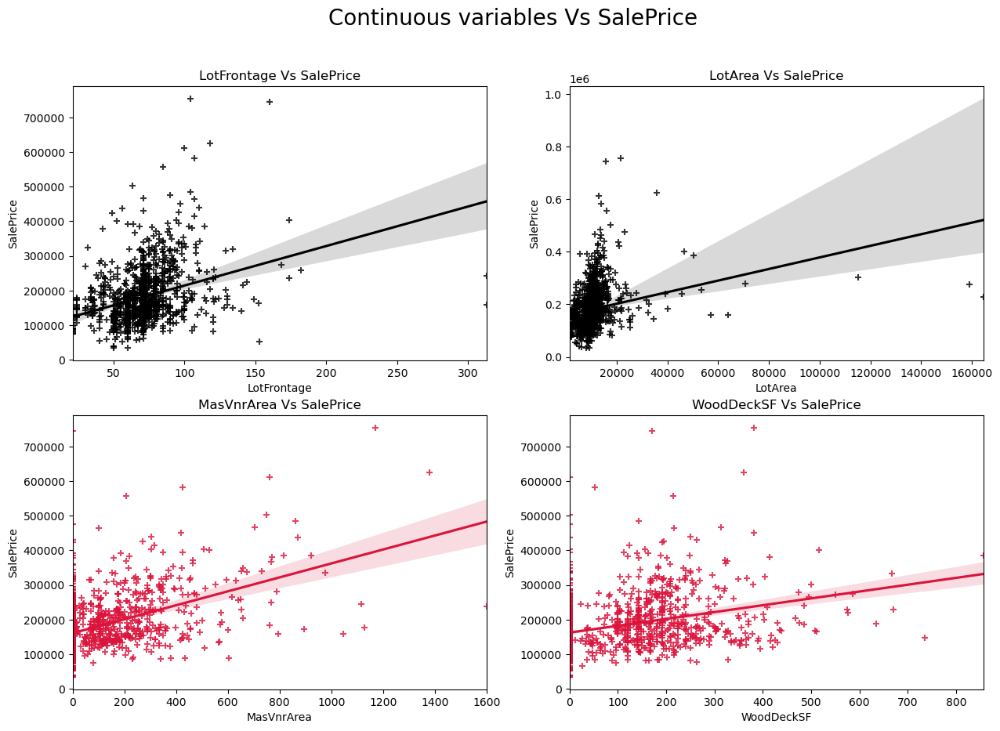

In [55]:
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('LotFrontage Vs SalePrice')
sns.regplot(x='LotFrontage',y='SalePrice',data=train_df,marker="+",color='k')

plt.subplot(2,2,2)
plt.title('LotArea Vs SalePrice')
sns.regplot(x='LotArea',y='SalePrice',data=train_df,marker="+",color='k')

plt.subplot(2,2,3)
plt.title('MasVnrArea Vs SalePrice')
sns.regplot(x='MasVnrArea',y='SalePrice',data=train_df,marker="+",color='crimson')

plt.subplot(2,2,4)
plt.title('WoodDeckSF Vs SalePrice')
sns.regplot(x='WoodDeckSF',y='SalePrice',data=train_df,marker="+",color="crimson")
plt.show()

### Observations:
- **SalePrice vs LotFrontage:** From the plot we can observe there is no much linear relation between the label and feature. If the linear feet of street connected to property is more, the sale price is also high. 
- **SalePrice vs LotArea:** There is weakly positive linear relation between the label and feature. But the sale price is high when lot size has around 20000 square feet area. Also as the lot size increases the price is also increasing moderately.
- **SalePrice vs MasVnrArea:** There is bit positive linear relation between feature and target. Also the sale price is high when Masonry veneer area has around 50-400 square feet. So as the Masonry veneer area in square feet increases sale price is also increasing.
- **SalePrice vs WoodDeckSF:** There is weakly positive linear relation between the feature and target. As the Wood deck area increases, sale price is also increases.

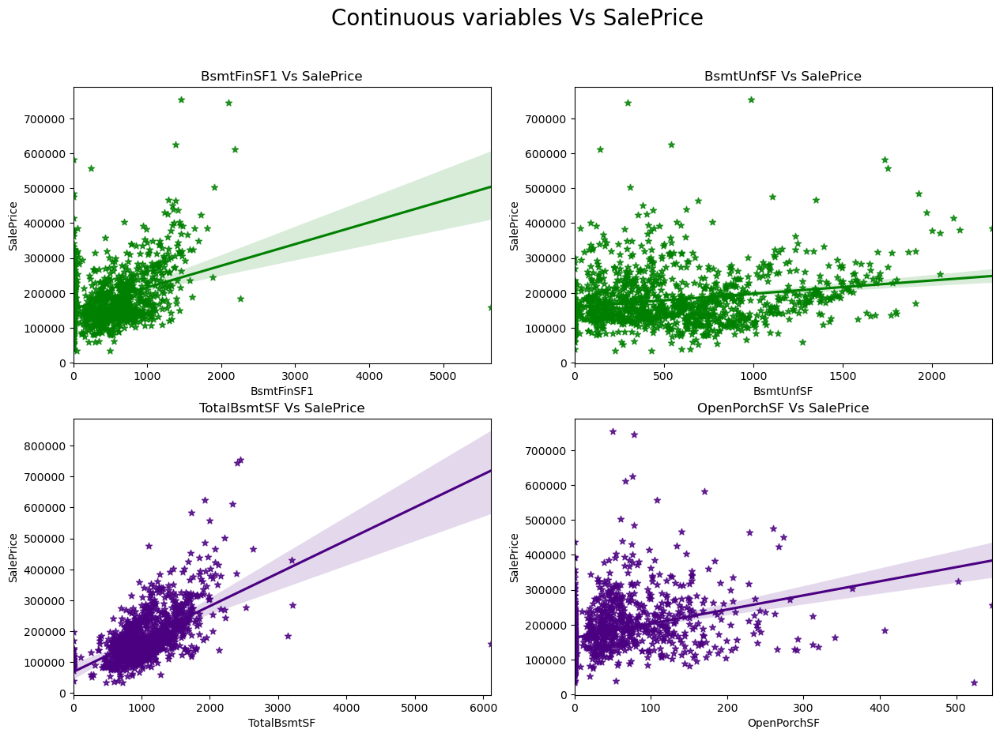

In [56]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('BsmtFinSF1 Vs SalePrice')
sns.regplot(x='BsmtFinSF1',y='SalePrice',data=train_df,marker="*",color='g')

plt.subplot(2,2,2)
plt.title('BsmtUnfSF Vs SalePrice')
sns.regplot(x='BsmtUnfSF',y='SalePrice',data=train_df,marker="*",color='g')

plt.subplot(2,2,3)
plt.title('TotalBsmtSF Vs SalePrice')
sns.regplot(x='TotalBsmtSF',y='SalePrice',data=train_df,marker="*",color='indigo')

plt.subplot(2,2,4)
plt.title('OpenPorchSF Vs SalePrice')
sns.regplot(x='OpenPorchSF',y='SalePrice',data=train_df,marker="*",color="indigo")
plt.show()

### Observations:
- **SalePrice vs BsmtFinSF1:** There is weakly positive linear relation between feature and label. The sale price is high that is 100000-300000 when basement square feet lie upto 1500 square feet. So as the type 1 basement finished square feet increases, sale price is also increases.
- **SalePrice vs BsmtUnfSF:** There is positive linear relation between the target and BsmtUnfSF. When the unfinished basement area is below 1000 square feet, the sale price is high.
- **SalePrice vs TotalBsmtSF:** There is positive linear relation between sale price nad TotalBsmtSF. As total basement area increases, sale price also increases.
- **SalePrice vs OpenPorchSF:** There is a linear relation between the label and feature. The sale price is high when Open porch area is below 200sf. Here also as the Open porch area increases, sale price is also increases.

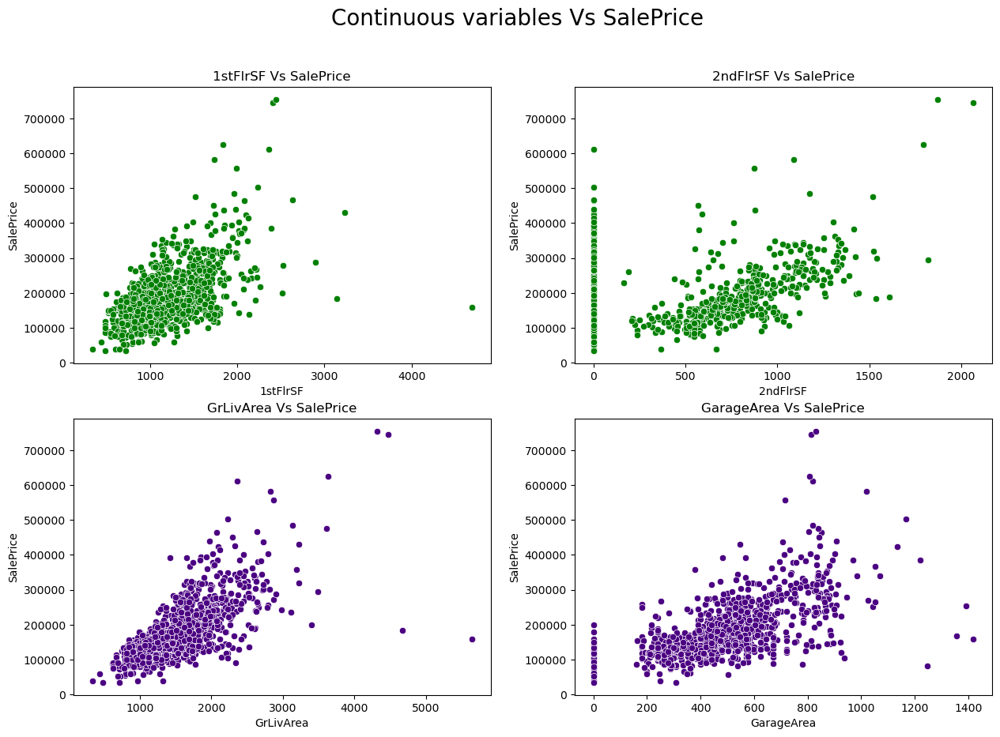

In [57]:
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('1stFlrSF Vs SalePrice')
sns.scatterplot(x='1stFlrSF',y='SalePrice',data=train_df,color='g')

plt.subplot(2,2,2)
plt.title('2ndFlrSF Vs SalePrice')
sns.scatterplot(x='2ndFlrSF',y='SalePrice',data=train_df,color='g')

plt.subplot(2,2,3)
plt.title('GrLivArea Vs SalePrice')
sns.scatterplot(x='GrLivArea',y='SalePrice',data=train_df,color='indigo')

plt.subplot(2,2,4)
plt.title('GarageArea Vs SalePrice')
sns.scatterplot(x='GarageArea',y='SalePrice',data=train_df,color="indigo")
plt.show()

### Observations:
- **SalePrice vs 1stFlrSF:** There is a linear relation between the label and feature. As we can observe in the plot, the sale price is high when the first floor area lies between 500-2000 square feet. So as the 1st floor area increases, sales price also increases moderately.
- **SalePrice vs 2ndFlrSF:** There is a positive correlation between SalePrice and 2ndFlrSF. So it is obvious that the sale price increases based on the floors.
- **SalePrice vs GrLivArea:** Most of the houses have above grade living area. There is a positive correlation between the label and feature. Here as the above grade living area increases, sale price also increases.
- **SalePrice vs GarageArea:** Similar to 2nd floor sf, here also positive linear relation between the label and feature. As size of garage area increases, sale price also increases. The sale price is high when size of garage area is beween 200-800 square feet.

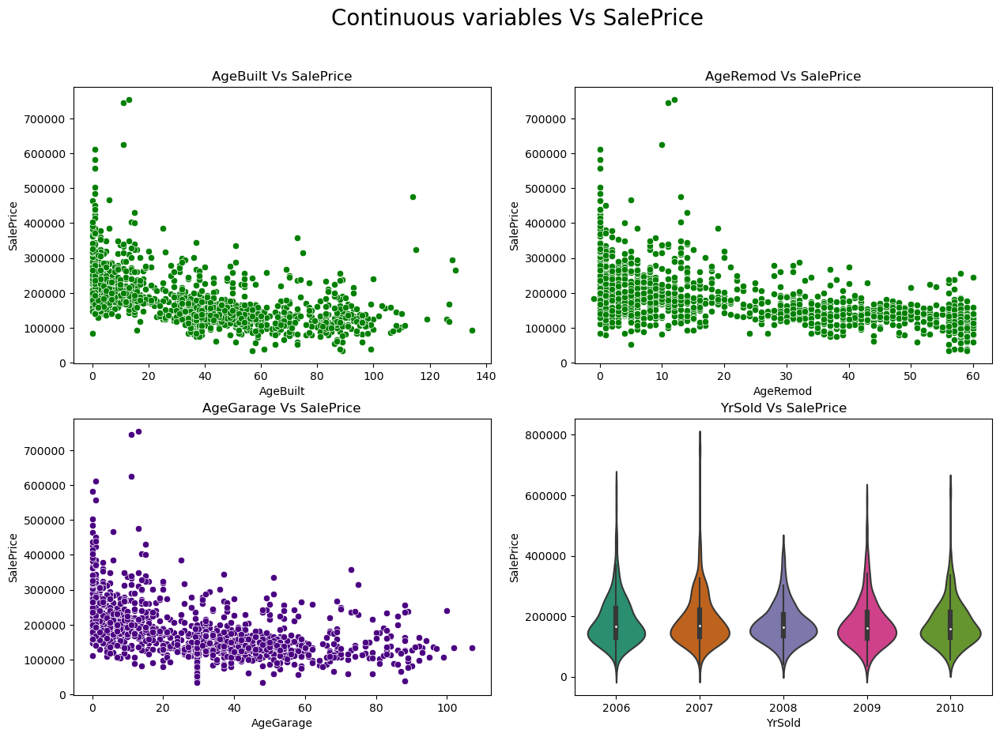

In [58]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Continuous variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('AgeBuilt Vs SalePrice')
sns.scatterplot(x='AgeBuilt',y='SalePrice',data=train_df,color='g')

plt.subplot(2,2,2)
plt.title('AgeRemod Vs SalePrice')
sns.scatterplot(x='AgeRemod',y='SalePrice',data=train_df,color='g')

plt.subplot(2,2,3)
plt.title('AgeGarage Vs SalePrice')
sns.scatterplot(x='AgeGarage',y='SalePrice',data=train_df,color='indigo')

plt.subplot(2,2,4)
plt.title('YrSold Vs SalePrice')
sns.violinplot(x='YrSold',y='SalePrice',data=train_df,palette="Dark2")

plt.show()

### Observations:
- **SalePrice vs AgeBuilt:** From the plot I can notice there is negative linear relation between sale price and AgeBuilt. The buildings which have built long back are having less sales price compare to new buildings. Also there are presence of outliers in the data.
- **SalePrice vs AgeRemod:** Similar to AgeBuilt, there is a negative linear relation between the label and features. As if Building modification has done long back then the price is less compared to new one. As the age increases, sale price decreases.
- **SalePrice vs AgeGarage:** There is negative linear relation and houses which are having recently built garages, they have high sale price. As the age of the garage was built increases, the sale price decreases.
- **SalePrice vs YrSold:** Almost all the buildings sold in the recent years and all of them have same sale price. There is no significance difference.

### Plotting Discrete variables vs SalePrice

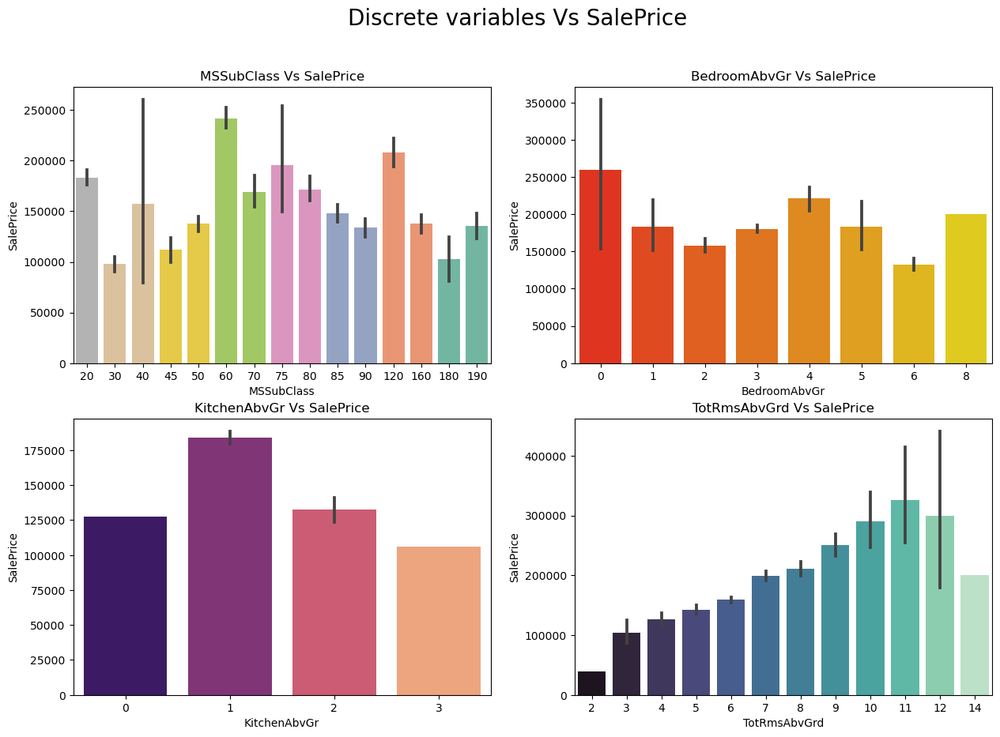

In [59]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Discrete variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('MSSubClass Vs SalePrice')
sns.barplot(x='MSSubClass',y='SalePrice',data=train_df,palette="Set2_r")

plt.subplot(2,2,2)
plt.title('BedroomAbvGr Vs SalePrice')
sns.barplot(x='BedroomAbvGr',y='SalePrice',data=train_df,palette='autumn')

plt.subplot(2,2,3)
plt.title('KitchenAbvGr Vs SalePrice')
sns.barplot(x='KitchenAbvGr',y='SalePrice',data=train_df,palette="magma")

plt.subplot(2,2,4)
plt.title('TotRmsAbvGrd Vs SalePrice')
sns.barplot(x='TotRmsAbvGrd',y='SalePrice',data=train_df,palette='mako')
plt.show()

### Observations:
- **SalePrice vs MSSubClass:** The sale price is high for the MSSubClass 60,120 and 20.
- **SalePrice vs BedroomAbvGr:** Many houses are having 0 and 4 bedrooms have high sales price also houses having 8 bedrooms also have  high sales price. Other bedroom grades have average sale price.
- **SalePrice vs KitchenAbvGr:** Most of the houses have single kitchen and few houses have 2 kitchens. The sale price is also high in case of the houses having single kitchen.
- **SalePrice vs TotRmsAbvGrd:** We can observe some linear relation between Total rooms above grade and Sale Prices as the number of rooms increases the sales price also increases. 

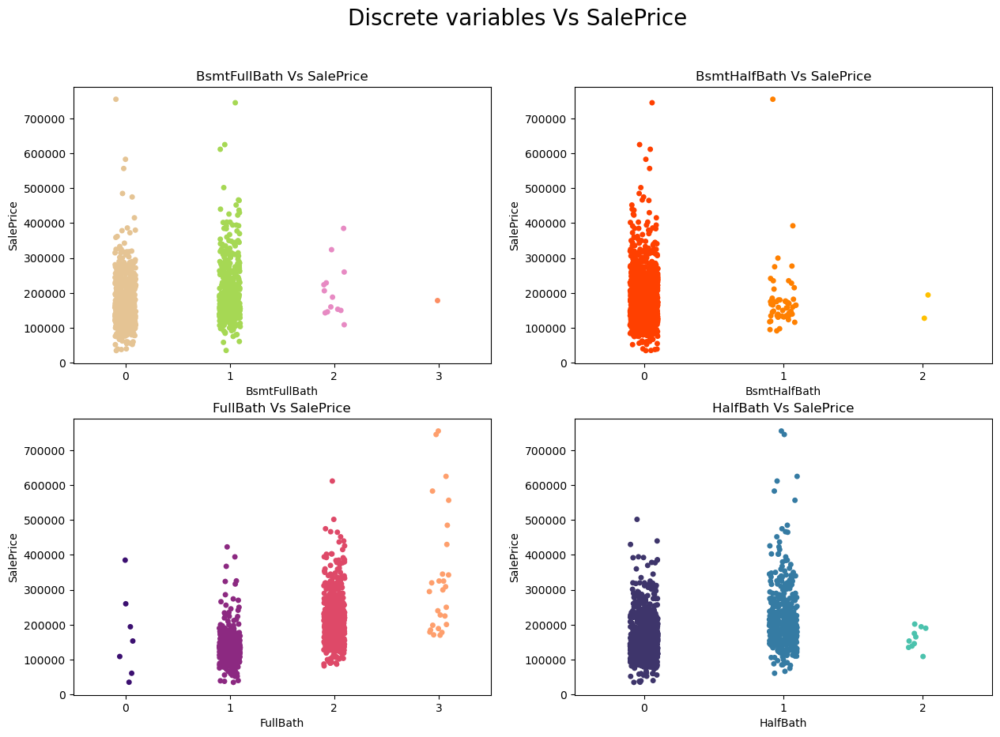

In [60]:
plt.style.use('default')
plt.figure(figsize=(15,10))
plt.suptitle('Discrete variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('BsmtFullBath Vs SalePrice')
sns.stripplot(x='BsmtFullBath',y='SalePrice',data=train_df,palette="Set2_r")

plt.subplot(2,2,2)
plt.title('BsmtHalfBath Vs SalePrice')
sns.stripplot(x='BsmtHalfBath',y='SalePrice',data=train_df,palette='autumn')

plt.subplot(2,2,3)
plt.title('FullBath Vs SalePrice')
sns.stripplot(x='FullBath',y='SalePrice',data=train_df,palette="magma")

plt.subplot(2,2,4)
plt.title('HalfBath Vs SalePrice')
sns.stripplot(x='HalfBath',y='SalePrice',data=train_df,palette='mako')
plt.show()

### Observations:
- **SalesPrice vs BsmtFullBath:** Most of the houses have basement full bathrooms as 0 and 1 which means some of the houses have single basement bathrooms and some of the houses have no basement bathrooms. And sales price is also high in these cases.
- **SalesPrice vs BsmtHalfBath:** The houses do not have any single basement bathrooms and those houses have average sales price.
- **SalesPrice vs FullBath:** There is positive linear relation between the sale price and full bathrooms above grade. Large number of houses have 1-2 full bathrooms. As the full bathrooms grades increases, sale price is also increasing slightly.
- **SalesPrice vs HalfBath:** Some of the houses have no half bathrooms and also some of the houses have single half bathroom and very few houses have 2 half bathrooms. The houses with 0-1 half bathrooms have average sale price.

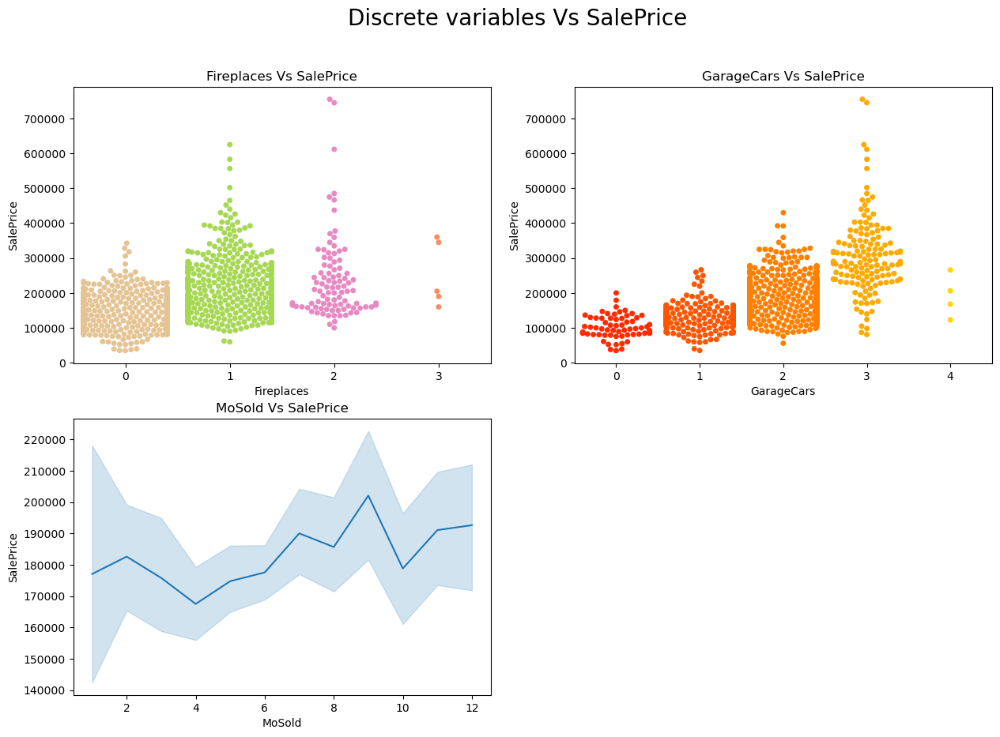

In [61]:
plt.figure(figsize=(15,10))
plt.suptitle('Discrete variables Vs SalePrice',fontsize=20)

plt.subplot(2,2,1)
plt.title('Fireplaces Vs SalePrice')
sns.swarmplot(x='Fireplaces',y='SalePrice',data=train_df,palette="Set2_r")

plt.subplot(2,2,2)
plt.title('GarageCars Vs SalePrice')
sns.swarmplot(x='GarageCars',y='SalePrice',data=train_df,palette='autumn')

plt.subplot(2,2,3)
plt.title('MoSold Vs SalePrice')
sns.lineplot(x='MoSold',y='SalePrice',data=train_df)
plt.show()

### Observations:
- **SalesPrice vs Fireplaces:** Some houses have no fire places and some houses have 1-2 fire places. The sales price is high for houses having single fireplaces.
- **SalesPrice vs GarageCars:** There is positive linear relation between target and feature. As size of garage in car capacity increases, sales price also increases.
- **SalesPrice vs MoSold:** Monthly sold have no significance impact on sale price.

## Identifying the outliers in train dataset

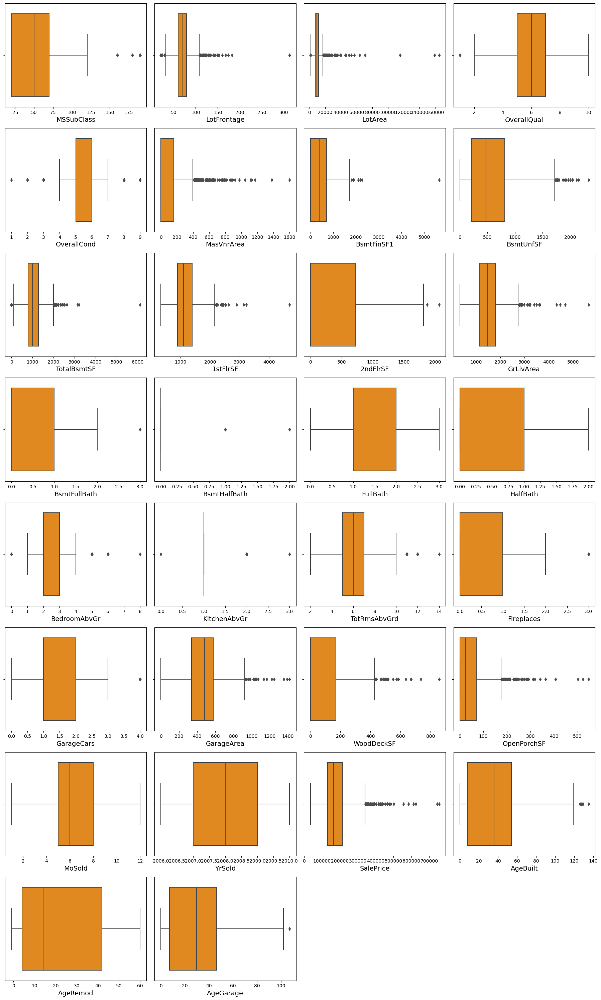

In [62]:
# Identifying the outliers using boxplot
plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in numerical_coltr:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(train_df[column],color="darkorange")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

- All the columns contains outliers except FullBath, HalfBath, MoSold, YrSold and AgeRemod. 
- The columns OverallQual and OverallCond seems to be categorical also, the column SalePrice is the label so I am not removing outliers in these columns.

Let's remove the outliers in the remaining columns using both Zscore and IQR method and compare the dataloss. 


# Removing outliers in train dataset
## i) Zscore method 

In [63]:
# Feature containing outliers
features_tr = train_df[['MSSubClass', 'LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'AgeBuilt', 'AgeGarage']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features_tr))

In [64]:
# Creating new dataframe
new_train_df = train_df[(z<3).all(axis=1)] 
new_train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
0,120,RL,70.98847,4928,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,958,1078,GasA,TA,Y,SBrkr,958,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,RFn,2,440,TA,TA,Y,0,205,2,2007,WD,Normal,128000,31,31,30.0
1,20,RL,95.00000,15865,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,1043,2217,GasA,Ex,Y,SBrkr,2217,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,Unf,2,621,TA,TA,Y,81,207,10,2007,WD,Normal,268000,37,37,37.0
2,60,RL,92.00000,9920,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,255,1117,GasA,Ex,Y,SBrkr,1127,886,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,Unf,2,455,TA,TA,Y,180,130,6,2007,WD,Normal,269790,11,10,10.0
3,20,RL,105.00000,11751,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,1139,1844,GasA,Ex,Y,SBrkr,1844,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,RFn,2,546,TA,TA,Y,0,122,1,2010,COD,Normal,190000,33,33,33.0
5,60,RL,58.00000,14054,Pave,IR1,Lvl,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,879,879,GasA,Ex,Y,SBrkr,879,984,1863,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,Fin,3,660,TA,TA,Y,100,17,11,2006,New,Partial,219210,0,0,0.0


This is the new dataframe after removing the outliers. Here we have removed the outliers whose Zscore is less than 3.

In [65]:
# Checking the shape of dataset before and after removing outliers
print("Shape of train dataset before removing outliers:", train_df.shape)
print("Shape of train dataset after removing outliers:", new_train_df.shape)

Shape of train dataset before removing outliers: (1168, 68)
Shape of train dataset after removing outliers: (947, 68)


In [66]:
# Checking the the data loss after removing outliers
data_loss = (1168-947)/1168*100
data_loss

18.92123287671233

By using Zscore I am losing around 19% of data which is not acceptable. The acceptable range of data loss is less than 10. So let's try to remove outliers using IQR method.

## ii) IQR (Inter Quantile Range) method

In [67]:
# 1st quantile
Q1=features_tr.quantile(0.25)

# 3rd quantile
Q3=features_tr.quantile(0.75)

# IQR
IQR=Q3 - Q1

train_df1=train_df[~((train_df < (Q1 - 1.5 * IQR)) |(train_df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [68]:
print("Shape of train data after using IQR method:", train_df1.shape)

Shape of train data after using IQR method: (756, 68)


In [69]:
# Checking the the data loss after removing outliers
data_loss = (1168-756)/1168*100
data_loss

35.273972602739725

By using Zscore and IQR method I am losing large amount of data, let's use percentile method to remove the outliers by setting the dataloss to 2%.

## iii) Percentile Method

In [70]:
# Removing outliers in train data using percentile method 
for col in features_tr:
    if train_df[col].dtypes != 'object':
        percentile = train_df[col].quantile([0.01,0.98]).values
        train_df[col][train_df[col]<=percentile[0]]=percentile[0]
        train_df[col][train_df[col]>=percentile[1]]=percentile[1]

I have removed the outliers present in train dataset using percentile method.

Let's perform the same thing for test dataset also.

## Identifying the outliers in test dataset

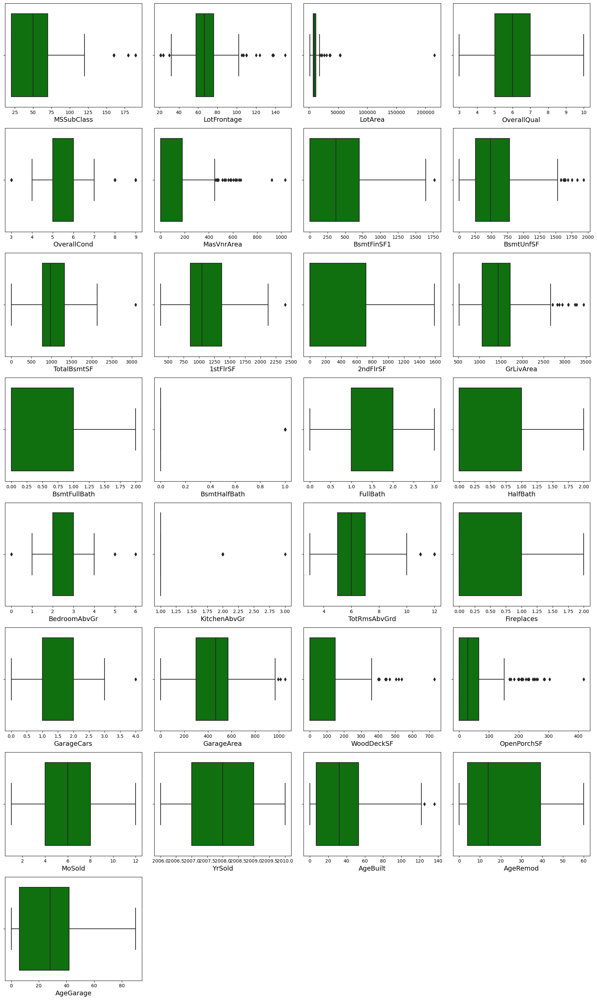

In [71]:
# Identifying the outliers using boxplot
plt.figure(figsize=(18,30),facecolor='white')
plotnumber=1
for column in numerical_colte:
    if plotnumber<=30:
        ax=plt.subplot(8,4,plotnumber)
        sns.boxplot(test_df[column],color="g")
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()

- Outliers present in all the columns except OverallQual, 2ndFlrSF,BsmtFullBath, FullBath, HalfBath, FirePlaces, MoSold, YrSold, AgeRemod and AgeGarage.
- The column OverallCond seems to be categorical so, I am not removing outliers in this columns.

Let's remove the outliers in the remaining columns using both Zscore and IQR method and compare the dataloss.

# Removing outliers in test dataset
## i) Zscore method

In [72]:
# Feature containing outliers
features_te = test_df[['MSSubClass', 'LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'BsmtHalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'AgeBuilt']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features_te))

In [73]:
# Creating new dataframe
new_test_df = test_df[(z<3).all(axis=1)] 
new_test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,20,RL,86.000000,14157,Pave,IR1,HLS,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,673,1922,GasA,Ex,Y,SBrkr,1922,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,Fin,3,676,TA,TA,Y,178,51,7,2007,WD,Normal,2,1,2.0
1,120,RL,66.425101,5814,Pave,IR1,Lvl,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,184,1220,GasA,Gd,Y,SBrkr,1360,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,RFn,2,565,TA,TA,Y,63,0,8,2009,COD,Abnorml,25,25,25.0
2,20,RL,66.425101,11838,Pave,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,1753,1753,GasA,Ex,Y,SBrkr,1788,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,RFn,2,522,TA,TA,Y,202,151,6,2009,WD,Normal,8,8,8.0
3,70,RL,75.000000,12000,Pave,Reg,Bnk,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,429,704,GasA,Ex,Y,SBrkr,860,704,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,Unf,1,234,TA,TA,Y,0,0,7,2009,WD,Normal,68,59,68.0
4,60,RL,86.000000,14598,Pave,IR1,Lvl,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,894,894,GasA,Ex,Y,SBrkr,894,1039,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,Fin,3,668,TA,TA,Y,100,18,1,2008,WD,Normal,1,1,1.0


This is the new dataframe after removing the outliers. Here we have removed the outliers whose Zscore is less than 3.

In [74]:
# Checking the shape of dataset before and after removing outliers
print("Shape of test dataset before removing outliers:", test_df.shape)
print("Shape of test dataset after removing outliers:", new_test_df.shape)

Shape of test dataset before removing outliers: (292, 67)
Shape of test dataset after removing outliers: (234, 67)


In [75]:
# Checking the the data loss after removing outliers
data_loss = (292-234)/292*100
data_loss

19.863013698630137

By using Zscore I am losing around 19.86% of data which is not acceptable. The acceptable range of data loss is less than 10. So let's try to remove outliers using IQR method.

## ii) IQR (Inter Quantile Range) method

In [76]:
# 1st quantile
Q1=features_te.quantile(0.25)

# 3rd quantile
Q3=features_te.quantile(0.75)

# IQR
IQR=Q3 - Q1

test_df1=test_df[~((test_df < (Q1 - 1.5 * IQR)) |(test_df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [77]:
print("Shape of test data after using IQR method:", test_df1.shape)

Shape of test data after using IQR method: (181, 67)


In [78]:
# Checking the the data loss after removing outliers
data_loss = (292-181)/292*100
data_loss

38.013698630136986

By using Zscore and IQR method I am losing large amount of data, let's use percentile method to remove the outliers by setting the dataloss to 2%.

## iii) Percentile Method

In [79]:
# Removing outliers in train data using percentile method 
for col1 in features_te:
    if test_df[col1].dtypes != 'object':
        percentile = test_df[col1].quantile([0.01,0.98]).values
        test_df[col1][test_df[col1]<=percentile[0]]=percentile[0]
        test_df[col1][test_df[col1]>=percentile[1]]=percentile[1]

I have removed the outliers present in train dataset using percentile method.

## Checking for skewness in train data

In [80]:
# Checking the skewness
train_df.skew()

MSSubClass      1.422019
LotFrontage     0.188060
LotArea         1.191912
OverallQual     0.175082
OverallCond     0.580714
MasVnrArea      1.873138
BsmtFinSF1      0.639523
BsmtUnfSF       0.777624
TotalBsmtSF     0.166773
1stFlrSF        0.645842
2ndFlrSF        0.717390
GrLivArea       0.592755
BsmtFullBath    0.355224
BsmtHalfBath    3.954345
FullBath        0.057809
HalfBath        0.656492
BedroomAbvGr   -0.145762
KitchenAbvGr    4.374289
TotRmsAbvGrd    0.443931
Fireplaces      0.552677
GarageCars     -0.434745
GarageArea     -0.135675
WoodDeckSF      1.053617
OpenPorchSF     1.513678
MoSold          0.220979
YrSold          0.115765
SalePrice       1.953878
AgeBuilt        0.469054
AgeRemod        0.495051
AgeGarage       0.598789
dtype: float64

The following features contains skewness more than +0.5 and -0.5
- MSSubClass
- LotArea
- OverallCond
- MasVnrArea
- BsmtFinSF1
- BsmtUnfSF
- 1stFlrSF
- 2ndFlrSF
- GrLivArea
- BsmtHalfBath
- HalfBath
- KitchenAbvGr
- Fireplaces
- WoodDeckSF
- OpenPorchSF
- SalePrice
- AgeGarage

Since OverallCond is categorical and SalePrice is label, so no need to remove skewness in these columns.
Let's remove skewenss present in the remaining columns.

## Removing skewness using Yeo-Johnson method

In [81]:
# Removing skewness using yeo-johnson  method to get better prediction
skew1 = ["MSSubClass","LotArea","MasVnrArea","BsmtFinSF1","BsmtUnfSF","1stFlrSF","2ndFlrSF","GrLivArea","BsmtHalfBath","HalfBath","KitchenAbvGr","Fireplaces","WoodDeckSF","OpenPorchSF","AgeGarage"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [82]:
train_df[skew1] = scaler.fit_transform(train_df[skew1].values)
train_df[skew1].head()

,MSSubClass,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtHalfBath,HalfBath,KitchenAbvGr,Fireplaces,WoodDeckSF,OpenPorchSF,AgeGarage
0,1.370435,-1.306083,-0.822896,-0.117054,0.916764,-0.481887,-0.871789,-1.281768,-0.238775,-0.782707,0.0,0.779453,-0.960144,1.423871,0.284279
1,-1.167999,1.356458,-0.822896,0.395541,1.042594,2.082190,-0.871789,1.377184,-0.238775,-0.782707,0.0,0.779453,0.783831,1.428474,0.520844
2,0.490047,0.113089,-0.822896,0.934402,-0.510359,0.048689,1.177246,1.060650,-0.238775,1.268421,0.0,0.779453,1.047285,1.208580,-0.652949
3,-1.167999,0.530989,1.385487,0.803940,1.178365,1.665038,-0.871789,0.775546,-0.238775,-0.782707,0.0,0.779453,-0.960144,1.178672,0.389131
4,-1.167999,1.497522,1.140684,1.189724,-0.230032,1.201931,-0.871789,0.322952,4.188040,-0.782707,0.0,0.779453,1.139237,-1.062308,0.354804


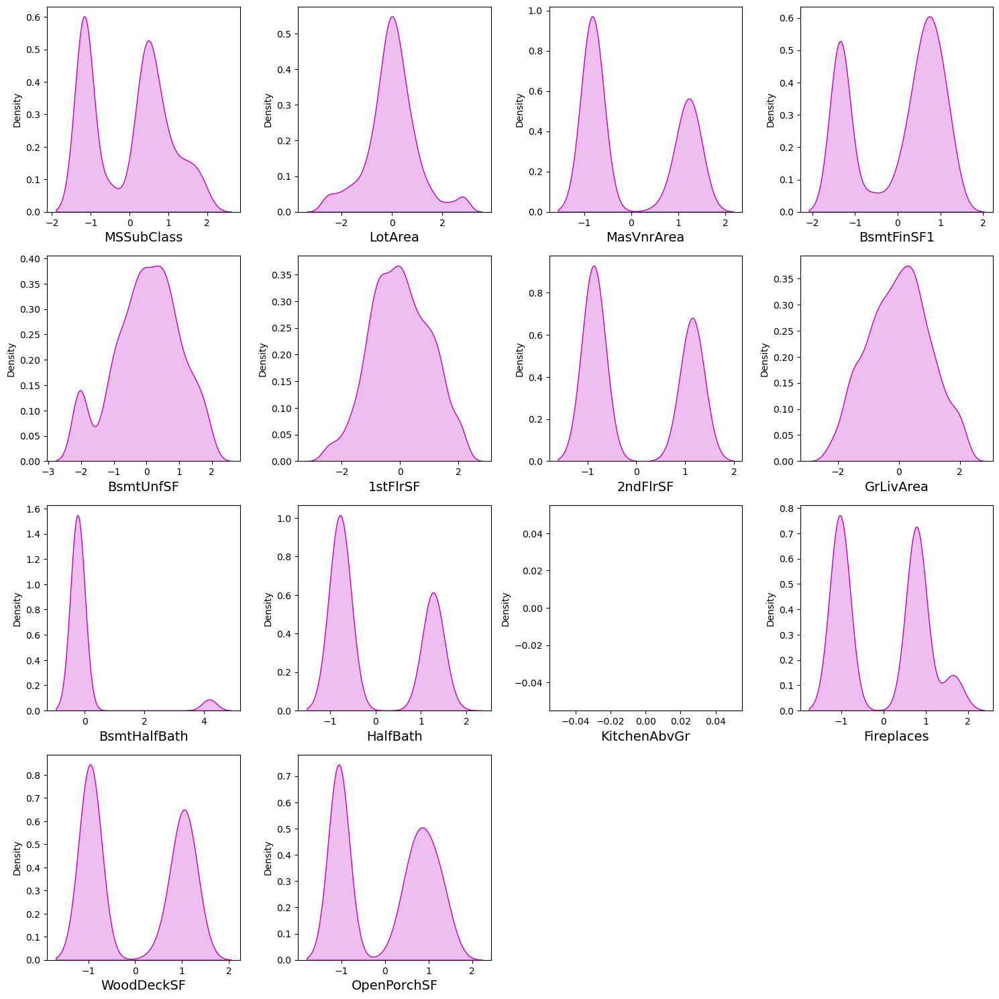

In [83]:
# Checking how the data has been distriubted in each column after removing skewness

plt.figure(figsize=(15,15),facecolor='white')
plotnumber=1
for column in train_df[skew1] :
    if plotnumber<=14:
        ax=plt.subplot(4,4,plotnumber)
        sns.distplot(train_df[column],color="m",kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [84]:
# Checking skewness after using yeo-johnson method
train_df[skew1].skew()

MSSubClass      0.064007
LotArea         0.077862
MasVnrArea      0.415092
BsmtFinSF1     -0.418554
BsmtUnfSF      -0.304290
1stFlrSF       -0.000731
2ndFlrSF        0.279883
GrLivArea      -0.005974
BsmtHalfBath    3.954345
HalfBath        0.498003
KitchenAbvGr    0.000000
Fireplaces      0.076595
WoodDeckSF      0.110387
OpenPorchSF    -0.010092
AgeGarage      -0.217611
dtype: float64

- We can observe the skewness has almost been reduced in all the columns.
- The column KitchenAbvGr has skewness zero which means it contains only one unique value that is zero throughout the dataset, So I can drop this column as well. 

In [85]:
# Dropping irrelevant colum
train_df.drop("KitchenAbvGr",axis=1,inplace=True)

## Checking for skewness in test data

In [86]:
# Checking the skewness
test_df.skew()

MSSubClass      1.323471
LotFrontage    -0.017005
LotArea         1.266527
OverallQual     0.397312
OverallCond     1.209714
MasVnrArea      1.545675
BsmtFinSF1      0.639990
BsmtUnfSF       0.873375
TotalBsmtSF     0.149160
1stFlrSF        0.596239
2ndFlrSF        0.765511
GrLivArea       0.790479
BsmtFullBath    0.463685
BsmtHalfBath    3.544994
FullBath       -0.049800
HalfBath        0.758892
BedroomAbvGr   -0.345731
KitchenAbvGr    4.253608
TotRmsAbvGrd    0.627431
Fireplaces      0.540164
GarageCars     -0.356072
GarageArea      0.051450
WoodDeckSF      1.317908
OpenPorchSF     1.790292
MoSold          0.186504
YrSold          0.018412
AgeBuilt        0.623131
AgeRemod        0.533693
AgeGarage       0.678577
dtype: float64

The following features contains skewness more than +0.5 and -0.5
- MSSubClass
- LotArea
- OverallCond
- MasVnrArea
- BsmtFinSF1
- BsmtUnfSF
- 1stFlrSF
- 2ndFlrSF
- GrLivArea
- BsmtHalfBath
- HalfBath
- KitchenAbvGr
- TotRmsAbvGrd
- Fireplaces
- WoodDeckSF
- OpenPorchSF
- AgeBuilt
- AgeGarage

Since OverallCond is categorical so no need to remove skewness in this columns.
Let's remove skewenss present in the remaining columns.

## Removing skewness using Yeo-Johnson method

In [87]:
# Removing skewness using yeo-johnson  method to get better prediction
skew2 = ["MSSubClass","LotArea","MasVnrArea","BsmtFinSF1","BsmtUnfSF","1stFlrSF","2ndFlrSF","GrLivArea","BsmtHalfBath","HalfBath","KitchenAbvGr","TotRmsAbvGrd","Fireplaces","WoodDeckSF","OpenPorchSF","AgeBuilt","AgeGarage"]

from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [88]:
test_df[skew2] = scaler.fit_transform(test_df[skew2].values)
test_df[skew2].head()

,MSSubClass,LotArea,MasVnrArea,BsmtFinSF1,BsmtUnfSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtHalfBath,HalfBath,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,WoodDeckSF,OpenPorchSF,AgeBuilt,AgeGarage
0,-1.149822,1.012372,1.184649,1.212776,0.459512,1.831025,-0.870294,0.966245,-0.263813,-0.738058,0.0,0.981907,0.808861,1.121289,0.720332,-1.417238,-1.398277
1,1.341197,-0.878055,-0.846660,1.071176,-0.847801,0.748588,-0.870294,-0.083846,-0.263813,-0.738058,0.0,-1.613568,0.808861,0.815051,-1.112306,-0.008559,0.159148
2,-1.149822,0.565525,-0.846660,-1.376632,1.999450,1.606536,-0.870294,0.744611,-0.263813,-0.738058,0.0,0.449228,0.808861,1.156129,1.287751,-0.830966,-0.763392
3,0.706032,0.598156,-0.846660,0.235999,-0.094676,-0.717217,1.137231,0.337234,-0.263813,1.349285,0.0,0.449228,0.808861,-0.913781,-1.112306,1.066994,1.406311
4,0.507373,1.092887,0.953962,-1.376632,0.880166,-0.591803,1.211129,0.983798,-0.263813,1.349285,0.0,1.463878,0.808861,0.955750,0.216312,-1.583151,-1.573401


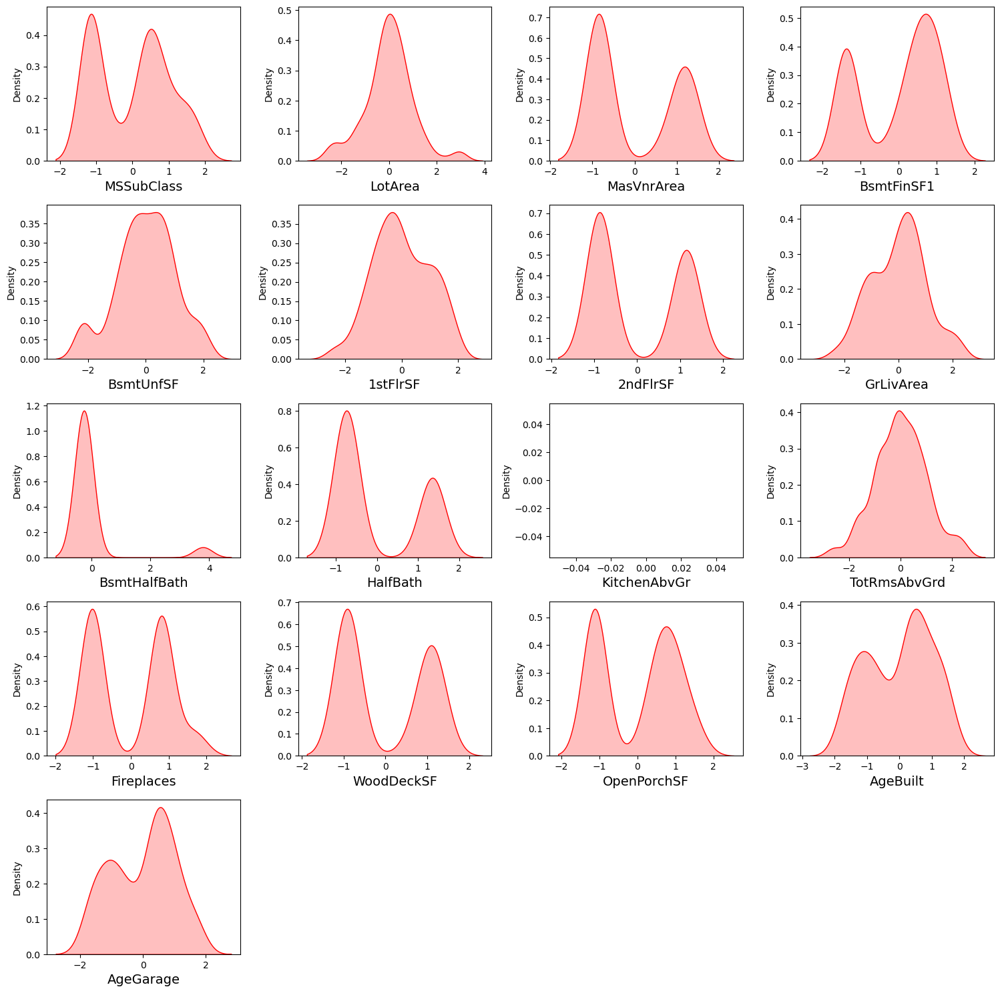

In [89]:
# Checking how the data has been distriubted in each column after removing skewness

plt.figure(figsize=(15,15),facecolor='white')
plotnumber=1
for column in test_df[skew2] :
    if plotnumber<=17:
        ax=plt.subplot(5,4,plotnumber)
        sns.distplot(test_df[column],color="r",kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=14)
    plotnumber+=1
plt.tight_layout()
plt.show()

In [90]:
# Checking skewness after using yeo-johnson method
test_df[skew2].skew()

MSSubClass      0.088585
LotArea         0.075717
MasVnrArea      0.362294
BsmtFinSF1     -0.447437
BsmtUnfSF      -0.247815
1stFlrSF        0.003835
2ndFlrSF        0.284246
GrLivArea      -0.003046
BsmtHalfBath    3.544994
HalfBath        0.621093
KitchenAbvGr    0.000000
TotRmsAbvGrd    0.000698
Fireplaces      0.076669
WoodDeckSF      0.208541
OpenPorchSF    -0.065103
AgeBuilt       -0.190514
AgeGarage      -0.186322
dtype: float64

- We can observe the skewness has almost been reduced in all the columns.
- The column KitchenAbvGr has skewness zero which means it contains only one unique value that is zero throughout the dataset, So I can drop this column as well.

In [91]:
test_df.drop("KitchenAbvGr",axis=1,inplace=True)

## Encoding Train DataFrame

Some of the categorical columns are having the ratings based on specific condition. So I will replace them with numbers according to the condition.

In [92]:
column = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in column:
    train_df[i] = train_df[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [93]:
# Encoding train dataframe using OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
for i in train_df.columns:
    if train_df[i].dtypes == "object":
        train_df[i] = enc.fit_transform(train_df[i].values.reshape(-1,1))

In [94]:
train_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
0,1.370435,3.0,70.98847,-1.306083,1.0,0.0,3.0,4.0,0.0,13.0,2.0,2.0,4.0,2.0,6,5,1.0,1.0,8.0,9.0,2.0,-0.822896,3,3,1.0,4,3,3.0,0.0,-0.117054,5.0,0.916764,1078.00,1.0,3,1.0,4.0,-0.481887,-0.871789,-1.281768,0,-0.238775,2,-0.782707,2.0,3,5.0,6.0,0.779453,3,1.0,1.0,2,440.0,3,3,2.0,-0.960144,1.423871,2,2007,8.0,4.0,128000,31.0,31,0.284279
1,-1.167999,3.0,95.00000,1.356458,1.0,0.0,3.0,4.0,1.0,12.0,2.0,2.0,0.0,2.0,8,6,0.0,5.0,12.0,13.0,2.0,-0.822896,4,4,2.0,3,4,1.0,0.0,0.395541,4.0,1.042594,2025.14,1.0,5,1.0,4.0,2.082190,-0.871789,1.377184,1,-0.238775,2,-0.782707,4.0,4,8.0,6.0,0.779453,3,1.0,2.0,2,621.0,3,3,2.0,0.783831,1.428474,10,2007,8.0,4.0,268000,37.0,37,0.520844
2,0.490047,3.0,92.00000,0.113089,1.0,0.0,3.0,1.0,0.0,15.0,2.0,2.0,0.0,5.0,7,5,1.0,1.0,7.0,7.0,2.0,-0.822896,4,3,2.0,4,3,0.0,2.0,0.934402,5.0,-0.510359,1117.00,1.0,5,1.0,4.0,0.048689,1.177246,1.060650,1,-0.238775,2,1.268421,3.0,3,8.0,6.0,0.779453,3,1.0,2.0,2,455.0,3,3,2.0,1.047285,1.208580,6,2007,8.0,4.0,269790,11.0,10,-0.652949
3,-1.167999,3.0,105.00000,0.530989,1.0,0.0,3.0,4.0,0.0,14.0,2.0,2.0,0.0,2.0,6,6,3.0,1.0,8.0,9.0,1.0,1.385487,3,3,1.0,4,3,3.0,1.0,0.803940,5.0,1.178365,1844.00,1.0,5,1.0,4.0,1.665038,-0.871789,0.775546,0,-0.238775,2,-0.782707,3.0,3,7.0,6.0,0.779453,3,1.0,1.0,2,546.0,3,3,2.0,-0.960144,1.178672,1,2010,0.0,4.0,190000,33.0,33,0.389131
4,-1.167999,3.0,70.98847,1.497522,1.0,0.0,3.0,2.0,0.0,14.0,2.0,2.0,0.0,2.0,6,7,1.0,1.0,4.0,4.0,3.0,1.140684,4,3,1.0,4,3,3.0,0.0,1.189724,5.0,-0.230032,1602.00,1.0,4,1.0,4.0,1.201931,-0.871789,0.322952,0,4.188040,2,-0.782707,3.0,4,8.0,6.0,0.779453,3,1.0,0.0,2,529.0,3,3,2.0,1.139237,-1.062308,6,2009,8.0,4.0,215000,32.0,9,0.354804


I have encoded object data types into numerical using OrdinalEncoder method.

## Encoding Test DataFrame

In [95]:
# Replacing ratings by numbers on the basis of specific condition
columns = ['ExterQual','ExterCond','BsmtQual','BsmtCond','HeatingQC','KitchenQual','FireplaceQu','GarageQual','GarageCond']
for i in columns:
    test_df[i] = test_df[i].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'None':0})

In [96]:
# Encoding test dataframe using OrdinalEncoder
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
for i in test_df.columns:
    if test_df[i].dtypes == "object":
        test_df[i] = enc.fit_transform(test_df[i].values.reshape(-1,1))

In [97]:
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,-1.149822,2.0,86.000000,1.012372,1.0,0.0,1.0,0.0,0.0,21.0,2.0,0.0,0.0,2.0,9,5,3.0,0.0,9.0,11.0,3.0,1.184649,4,3,2.0,5,3,1.0,2.0,1.212776,5.0,0.459512,1922.0,0.0,5,1.0,3.0,1.831025,-0.870294,0.966245,1,-0.263813,2,-0.738058,3,4,0.981907,5.0,0.808861,4,1.0,0.0,3,676.0,3,3,2.0,1.121289,0.720332,7,2007,5.0,2.0,-1.417238,1,-1.398277
1,1.341197,2.0,66.425101,-0.878055,1.0,0.0,3.0,1.0,0.0,21.0,2.0,0.0,4.0,2.0,8,5,1.0,0.0,5.0,5.0,2.0,-0.846660,4,3,1.0,4,3,0.0,2.0,1.071176,5.0,-0.847801,1220.0,0.0,4,1.0,3.0,0.748588,-0.870294,-0.083846,1,-0.263813,1,-0.738058,1,4,-1.613568,5.0,0.808861,5,1.0,1.0,2,565.0,3,3,2.0,0.815051,-1.112306,8,2009,0.0,0.0,-0.008559,25,0.159148
2,-1.149822,2.0,66.425101,0.565525,1.0,3.0,3.0,4.0,0.0,4.0,2.0,0.0,0.0,2.0,8,5,3.0,0.0,9.0,11.0,2.0,-0.846660,4,3,2.0,4,3,0.0,5.0,-1.376632,5.0,1.999450,1753.0,0.0,5,1.0,3.0,1.606536,-0.870294,0.744611,0,-0.263813,2,-0.738058,3,5,0.449228,5.0,0.808861,3,1.0,1.0,2,522.0,3,3,2.0,1.156129,1.287751,6,2009,5.0,2.0,-0.830966,8,-0.763392
3,0.706032,2.0,75.000000,0.598156,1.0,3.0,0.0,4.0,0.0,5.0,2.0,0.0,0.0,5.0,7,7,1.0,0.0,6.0,7.0,2.0,-0.846660,3,3,1.0,3,3,3.0,4.0,0.235999,5.0,-0.094676,704.0,0.0,5,1.0,3.0,-0.717217,1.137231,0.337234,0,-0.263813,1,1.349285,3,2,0.449228,5.0,0.808861,4,1.0,2.0,1,234.0,3,3,2.0,-0.913781,-1.112306,7,2009,5.0,2.0,1.066994,59,1.406311
4,0.507373,2.0,86.000000,1.092887,1.0,0.0,3.0,1.0,0.0,20.0,1.0,0.0,0.0,5.0,6,5,1.0,0.0,9.0,11.0,3.0,0.953962,4,3,2.0,4,3,2.0,5.0,-1.376632,5.0,0.880166,894.0,0.0,5,1.0,3.0,-0.591803,1.211129,0.983798,0,-0.263813,2,1.349285,4,4,1.463878,5.0,0.808861,4,3.0,0.0,3,668.0,3,3,2.0,0.955750,0.216312,1,2008,5.0,2.0,-1.583151,1,-1.573401


I have encoded object data types into numerical using OrdinalEncoder method.

## Correlation between the label and features using HEAT map in Train dataset

In [98]:
# Checking the correlation between features and the target
cor = train_df.corr()
cor

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,AgeBuilt,AgeRemod,AgeGarage
MSSubClass,1.000000,0.026898,-0.316274,-0.312939,-0.017924,0.067516,-0.030467,0.057130,-0.016595,-0.011619,-0.039101,-0.031881,0.586409,0.481353,0.122241,-0.033927,-0.138069,-0.028166,-0.048778,-0.069930,-0.028288,0.004875,0.062077,-0.031109,0.048143,0.076728,-0.006384,-0.060011,0.084234,-0.100436,0.056615,-0.116225,-0.293377,0.071533,0.018161,-0.111572,0.036332,-0.312472,0.558561,0.230677,-0.067705,0.010020,0.197635,0.295003,0.078793,0.048228,0.192707,0.037758,0.029802,-0.004202,0.104343,-0.023714,0.000675,-0.075152,-0.003808,-0.045967,-0.086870,0.038922,0.062935,0.010865,-0.042020,0.064683,-0.027825,-0.001252,0.005669,-0.055151,-0.058538
MSZoning,0.026898,1.000000,-0.084834,-0.058912,0.140215,0.053655,0.001175,-0.027246,-0.023952,-0.251833,-0.025651,0.031959,-0.024776,-0.110991,-0.134037,0.189553,0.000913,0.009719,-0.012037,0.005548,-0.033521,-0.037361,-0.160447,0.097907,-0.244844,-0.206193,-0.041842,0.037414,0.021518,-0.036041,-0.031322,-0.032954,-0.065060,0.051188,-0.149446,-0.015887,-0.079205,-0.037611,-0.016193,-0.086858,-0.009900,0.006809,-0.188837,-0.125164,-0.000610,-0.133170,-0.024508,-0.091684,0.009349,-0.011942,0.125155,0.162566,-0.130963,-0.163414,-0.095053,-0.073200,-0.077280,0.006946,-0.182359,-0.051646,-0.004964,0.079854,0.004501,-0.133221,0.296616,0.174282,0.278292
LotFrontage,-0.316274,-0.084834,1.000000,0.596143,-0.044573,-0.157341,-0.016620,-0.201691,0.023253,0.091671,-0.022579,0.011970,-0.467073,0.057902,0.230687,-0.051887,0.168101,0.063294,0.079942,0.108934,-0.066054,0.166180,0.158712,-0.001004,0.090652,0.163680,0.047333,-0.121117,-0.028977,0.087060,-0.015941,0.130111,0.318263,-0.036713,0.084699,0.087970,0.073880,0.394878,-0.036998,0.318133,0.070859,0.011408,0.180823,0.049731,0.278173,0.158665,0.323070,0.037977,0.227523,-0.059379,-0.243693,-0.202471,0.297190,0.334422,0.053380,0.039626,0.106891,0.065003,0.168784,0.027718,-0.005074,-0.040647,0.076587,0.358470,-0.129581,-0.081202,-0.072003
LotArea,-0.312939,-0.058912,0.596143,1.000000,-0.072669,-0.287003,-0.074834,-0.198998,0.176280,0.075420,0.069366,0.056741,-0.524128,0.005503,0.190547,0.010314,0.119446,0.220463,0.079181,0.095689,-0.019842,0.076589,0.097839,0.070513,0.009319,0.116129,0.047736,-0.144857,-0.043423,0.119301,-0.073788,0.052521,0.332367,-0.021160,0.047385,0.073866,0.053827,0.452791,0.009290,0.397820,0.108691,0.043299,0.187219,0.061575,0.297515,0.127004,0.369388,-0.025038,0.328380,-0.096589,-0.201895,-0.155464,0.272560,0.319552,0.060260,0.030388,0.041033,0.125098,0.146222,0.021311,-0.039843,-0.022130,0.046115,0.394343,-0.029530,-0.031184,0.019759
Street,-0.017924,0.140215,-0.044573,-0.072669,1.000000,-0.012941,0.105226,0.000153,-0.141572,0.001420,0.002189,0.001406,-0.013606,0.016793,0.057140,0.031082,-0.006875,0.007889,0.012482,0.014618,0.000822,0.020075,0.091807,-0.028096,0.032701,0.027107,0.002199,0.065253,-0.006420,0.008924,0.045208,0.030988,0.016841,0.006981,0.038560,0.043024,0.038720,0.009913,0.026241,0.052837,-0.010398,0.013997,0.033208,0.045883,0.028722,0.068306,0.039782,-0.015309,0.021069,-0.027427,-0.000824,-0.001178,0.001838,-0.002976,-0.005942,-0.006471,0.041318,0.022918,0.017900,-0.008860,-0.019635,0.025920,0.014176,0.044753,-0.022127,-0.059127,-0.024426
LotShape,0.067516,0.053655,-0.157341,-0.287003,-0.012941,1.000000,0.081803,0.211

This gives the correlation between the denpendent and independent variables. We can visualize this by plotting heat map.

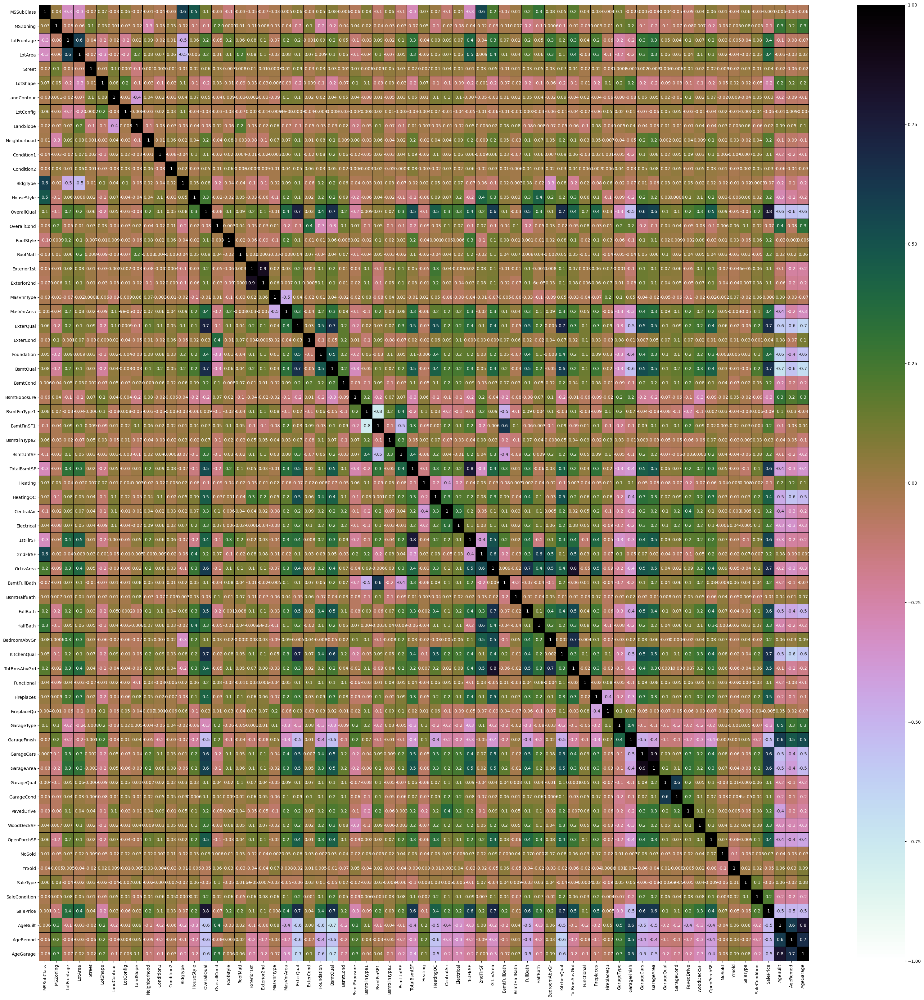

In [99]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(40,40))    
sns.heatmap(train_df.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',linecolor="black",annot=True,cmap="cubehelix_r")
plt.yticks(rotation=0);

- This heatmap shows the correlation matrix by visualizing the data. we can observe the relation between one feature to other.
- Dark shades are positively correlated with the label and light shades are negatively correlated with the label SalePrice.

### Important features that affect SalePrice positively and negatively
**Features having high Positive correlation with label**
- OverallQual     
- GrLivArea        
- ExterQual        
- KitchenQual      
- BsmtQual         
- GarageCars       
- GarageArea       
- TotalBsmtSF      
- 1stFlrSF         
- FullBath         
- TotRmsAbvGrd

**Features having high Negative correlation with label**
- Heating         
- MSZoning        
- LotShape        
- BsmtExposure    
- GarageType      
- AgeRemod        
- AgeGarage       
- AgeBuilt       
- GarageFinish  


- From the heat map it can be seen that most of the features are correlated with each other which means multicollinearity problem. This problem may impact our models.
- To overcome with this multicollinearity I need to check Variance Inflation Factor and should remove the columns containing VIF above 10 which is not acceptable. I will do it in the later part.

Let's check the correlation between feature and label.

In [100]:
cor['SalePrice'].sort_values(ascending=False)

SalePrice        1.000000
OverallQual      0.789185
GrLivArea        0.688210
ExterQual        0.672665
KitchenQual      0.659228
BsmtQual         0.653265
GarageCars       0.634573
GarageArea       0.627504
TotalBsmtSF      0.624311
1stFlrSF         0.575665
FullBath         0.554988
TotRmsAbvGrd     0.528564
Fireplaces       0.475531
OpenPorchSF      0.449961
HeatingQC        0.431516
LotArea          0.394343
Foundation       0.374169
MasVnrArea       0.373364
LotFrontage      0.358470
WoodDeckSF       0.310128
HalfBath         0.309808
CentralAir       0.246754
Electrical       0.234621
PavedDrive       0.231707
BsmtFullBath     0.218620
SaleCondition    0.217687
BsmtFinSF1       0.212858
HouseStyle       0.205502
Neighborhood     0.198942
BsmtUnfSF        0.193140
RoofStyle        0.192654
BsmtCond         0.181625
BedroomAbvGr     0.177452
2ndFlrSF         0.167816
RoofMatl         0.159865
GarageQual       0.147272
GarageCond       0.119962
Functional       0.118673
Exterior1st 

Here I can observe the positive and negative correlation between features and label.

## Visualizing the correlation between label and features using bar plot

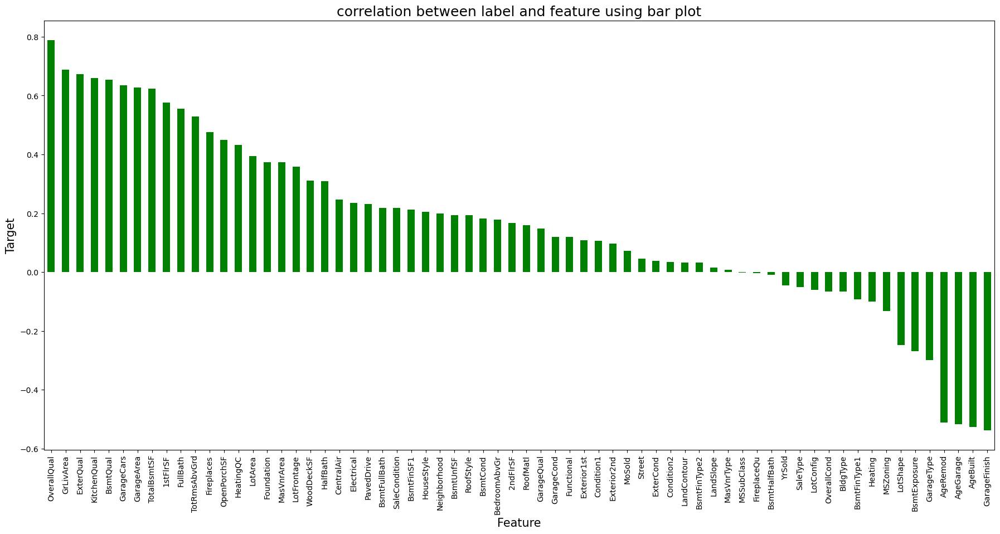

In [101]:
plt.figure(figsize=(22,10))
train_df.corr()['SalePrice'].sort_values(ascending=False).drop(['SalePrice']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('correlation between label and feature using bar plot',fontsize=18)
plt.show()

From the bar plot I can observe the columns MSSubClass and FirePlaceQu have very less correlation with the label. I can drop this columns if necessary. But for now keeping them as it is.

## Checking correlation between the features in test data

In [102]:
# Checking the correlation between features
cor1 = test_df.corr()
cor1

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
MSSubClass,1.000000,0.230922,-0.373908,-0.387652,0.005665,0.126507,0.013631,0.013514,-0.062158,-0.093560,0.060330,-0.028565,0.641508,0.499602,-0.068933,-0.034187,-0.243385,-0.003546,-0.029276,-0.118860,-0.108053,0.000174,-0.044504,-0.081128,0.055058,0.070922,0.040575,-0.027770,0.096357,-0.147265,0.064315,-0.146880,-0.382049,0.043193,-0.070985,-0.066447,0.060709,-0.392687,0.593826,0.176972,-0.062961,-0.039289,0.148119,0.345263,0.030151,-0.134077,0.100772,-0.070135,-0.003696,-0.105648,0.167402,0.018028,-0.053219,-0.089616,0.008007,-0.016228,-0.018566,0.066206,-0.083760,0.027774,0.022935,-0.090847,-0.043731,0.009205,0.027770,-0.038829
MSZoning,0.230922,1.000000,-0.351480,-0.334747,-0.063162,0.167716,-0.099137,0.055261,-0.035312,-0.204984,-0.059909,0.105995,0.230251,-0.068366,-0.276394,0.191126,-0.031210,-0.022604,-0.028611,-0.028994,0.010358,-0.125284,-0.327079,0.065494,-0.195382,-0.219848,-0.139784,0.050552,0.038716,-0.139954,-0.015825,-0.139829,-0.279128,0.094397,-0.225763,-0.235065,-0.035888,-0.222821,0.017233,-0.209589,-0.084559,-0.017534,-0.236326,-0.181873,-0.120083,-0.266916,-0.150258,-0.131738,-0.169600,0.050584,0.142661,0.233188,-0.308576,-0.307001,-0.087401,-0.067022,-0.236680,-0.101952,-0.186630,0.074308,-0.072716,0.123993,0.005290,0.350378,0.154700,0.282159
LotFrontage,-0.373908,-0.351480,1.000000,0.588692,-0.062040,-0.137329,-0.062143,-0.128053,0.121853,0.190659,0.063261,-0.018847,-0.455486,-0.069730,0.270539,-0.105705,0.195909,0.084083,0.050653,0.058110,0.046939,0.130875,0.198226,-0.076662,0.147518,0.173670,0.047516,-0.113060,0.008967,0.089147,-0.093740,0.170756,0.382534,-0.011848,0.112876,0.028364,0.014873,0.458030,-0.077306,0.353087,0.075401,-0.041809,0.219694,0.039841,0.247313,0.181581,0.331847,0.034426,0.253007,-0.009986,-0.240542,-0.315188,0.331935,0.349266,0.061087,0.034276,0.075489,0.027836,0.077141,-0.040921,0.053027,0.032145,0.036364,-0.165926,-0.056636,-0.139324
LotArea,-0.387652,-0.334747,0.588692,1.000000,-0.115787,-0.314092,-0.132902,-0.159049,0.389047,0.167866,0.070621,-0.042893,-0.567474,-0.045095,0.222532,-0.105291,0.238122,0.036748,0.070773,0.072612,-0.022629,0.097522,0.191309,-0.025702,0.087793,0.128584,0.042430,-0.190761,0.006961,0.142195,0.001046,0.119309,0.402904,0.016274,0.069721,0.081991,0.006613,0.489937,-0.020001,0.425677,0.125226,0.082291,0.225790,0.116572,0.348570,0.160187,0.412069,0.043733,0.310479,0.022905,-0.211720,-0.261185,0.361897,0.374366,0.032976,-0.036598,-0.023073,0.125369,0.157970,-0.062967,0.000591,0.071355,0.062657,-0.101061,-0.074685,-0.072105
Street,0.005665,-0.063162,-0.062040,-0.115787,1.000000,-0.002444,0.153613,0.058229,-0.324146,-0.045972,-0.246714,0.004868,-0.028820,0.043073,0.066173,0.077702,-0.054925,0.006540,-0.021532,-0.019729,0.036783,-0.015087,0.128016,0.024868,0.043091,0.009123,0.003768,0.099047,-0.037657,-0.038769,0.110019,0.095220,-0.032170,0.011782,0.060962,0.156680,-0.025961,-0.013159,0.072274,0.051220,-0.094062,0.021908,0.087362,-0.025380,0.031874,0.058313,0.068524,-0.018670,-0.027697,0.033426,0.006743,-0.029487,-0.086271,-0.106612,-0.006540,-0.007318,-0.023367,-0.002458,-0.019054,0.036965,-0.040272,-0.019125,-0.012345,-0.048795,-0.094971,-0.070219
LotShape,0.126507,0.167716,-0.137329,-0.314092,-0.002444,1.000000,0.100105,0.262901,-0.094606,-0.067832,-0.022692,-0.08

This gives the correlation between the features. We can visualize this by plotting heat map.

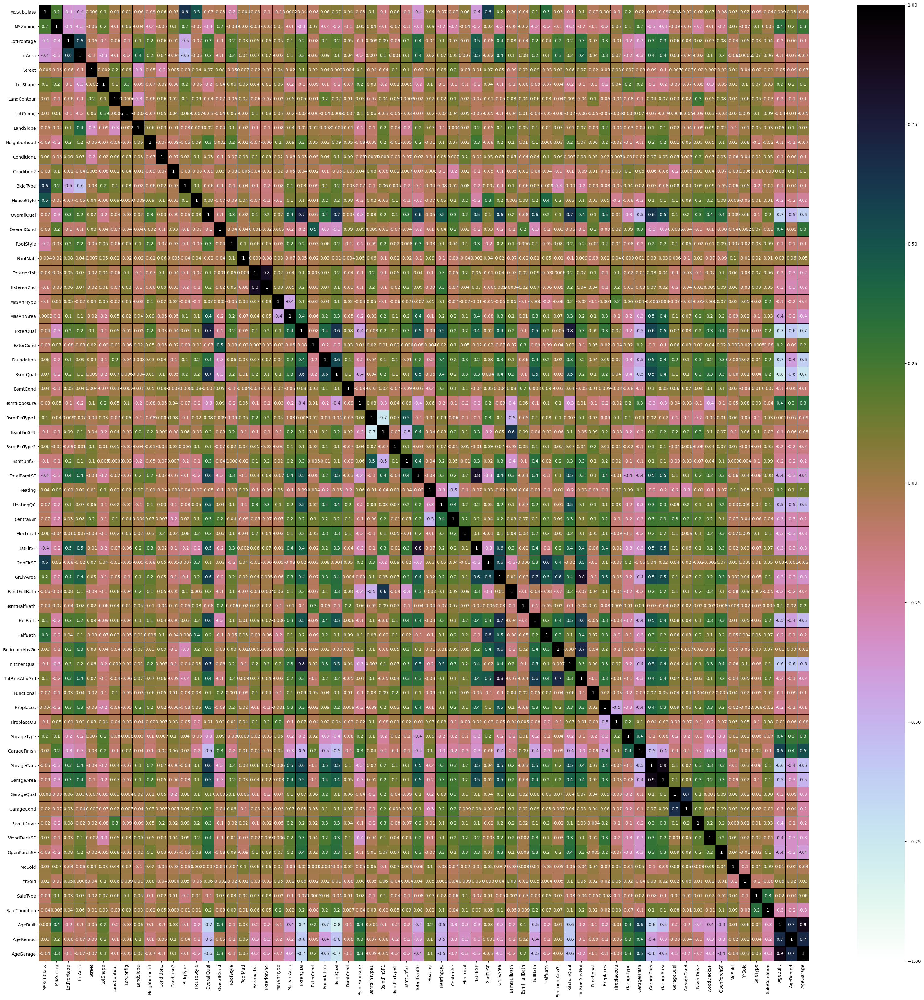

In [103]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(40,40))    
sns.heatmap(test_df.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',linecolor="black",annot=True,cmap="cubehelix_r")
plt.yticks(rotation=0);

From the above heat map I can notice the multicollinearity problem as most of the columns are correlated with each other. We will deal with it later

## Separating the feature and label into x and y

In [104]:
x = train_df.drop("SalePrice", axis=1)
y = train_df["SalePrice"]

In [105]:
# Dimension of x and y
x.shape, y.shape

((1168, 66), (1168,))

## Scaling Train data using StandardScaler 

In [106]:
from sklearn.preprocessing import StandardScaler
# Scaling data
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,1.370435,-0.021646,0.039092,-1.306083,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.142224,-0.037339,-0.023979,2.985495,-0.549930,-0.075169,-0.530217,-0.483544,-0.134573,-0.212927,-0.104890,0.395209,-0.822896,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-1.523529,-0.117054,0.310141,0.916764,0.067300,-0.11909,-1.178317,0.267506,0.299036,-0.481887,-0.871789,-1.281768,-0.838227,-0.238775,0.793082,-0.782707,-1.144966,-0.788838,-1.009429,0.261146,0.779453,-1.163409,-0.693653,-0.288773,0.307737,-0.163806,0.101364,0.110393,0.291828,-0.960144,1.423871,-1.617822,-0.605487,0.330033,0.207932,-0.189926,0.382860,0.284279
1,-1.167999,-0.021646,1.321126,1.356458,0.058621,-1.373107,0.318473,0.606420,3.295414,-0.024227,-0.037339,-0.023979,-0.403288,-0.549930,1.364138,0.359572,-1.685203,6.090408,1.079014,1.050880,0.395209,-0.822896,1.032209,2.589114,0.852451,-0.832343,3.332324,-1.113129,-1.523529,0.395541,-0.771186,1.042594,2.453434,-0.11909,0.903792,0.267506,0.299036,2.082190,-0.871789,1.377184,1.192995,-0.238775,0.793082,-0.782707,1.475072,0.716657,0.975397,0.261146,0.779453,-1.163409,-0.693653,0.946709,0.307737,0.717359,0.101364,0.110393,0.291828,0.783831,1.428474,1.361470,-0.605487,0.330033,0.207932,0.013316,0.671675,0.520844
2,0.490047,-0.021646,1.160948,0.113089,0.058621,-1.373107,0.318473,-1.220661,-0.226126,0.475125,-0.037339,-0.023979,-0.403288,1.030838,0.644484,-0.530217,-0.483544,-0.134573,-0.535912,-0.682775,0.395209,-0.822896,1.032209,-0.223988,0.852451,0.647378,-0.037507,-1.987463,-0.434828,0.934402,0.310141,-0.510359,0.165553,-0.11909,0.903792,0.267506,0.299036,0.048689,1.177246,1.060650,1.192995,-0.238775,0.793082,1.268421,0.165053,-0.788838,0.975397,0.261146,0.779453,-1.163409,-0.693653,0.946709,0.307737,-0.090782,0.101364,0.110393,0.291828,1.047285,1.208580,-0.128176,-0.605487,0.330033,0.207932,-0.867400,-0.627990,-0.652949
3,-1.167999,-0.021646,1.855050,0.530989,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,0.359572,1.919773,-0.134573,-0.212927,-0.104890,-1.241686,1.385487,-0.700004,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-0.979178,0.803940,0.310141,1.178365,1.997087,-0.11909,0.903792,0.267506,0.299036,1.665038,-0.871789,0.775546,-0.838227,-0.238775,0.793082,-0.782707,0.165053,-0.788838,0.313788,0.261146,0.779453,-1.163409,-0.693653,-0.288773,0.307737,0.352235,0.101364,0.110393,0.291828,-0.960144,1.178672,-1.990233,1.651563,-4.612004,0.207932,-0.122178,0.479132,0.389131
4,-1.167999,-0.021646,0.039092,1.497522,0.058621,-1.373107,0.318473,-0.611634,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.075169,1.249361,-0.483544,-0.134573,-1.504868,-1.549602,2.032104,1.140684,1.032209,-0.223988,-0.557836,0.647378,-0.037507,0.635539,-1.523529,1.189724,0.310141,-0.230032,1.387415,-0.11909,-0.137262,0.267506,0.299036,1.201931,-0.871789,0.322952,-0.838227,4.188040,0.793082,-0.782707,0.165053,0.716657,0.975397,0.261146,0.779453,-1.163409,-0.693653,-1.524255,0.307737,0.269474,0.101364,0.110393,0.291828,1.139237,-1.062308,-0.128176,0.899213,0.330033,0.207932,-0.156052,-0.676126,0.354804


I have scaled the data using StandardScaler method to overcome with the issue of data biasness.

## Scaling Test data using StandardScaler

In [107]:
# Scaling data
scaler = StandardScaler()
test_df = pd.DataFrame(scaler.fit_transform(test_df), columns=test_df.columns)
test_df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,AgeBuilt,AgeRemod,AgeGarage
0,-1.149822,-0.287006,1.067625,1.012372,0.083045,-1.402669,-2.566101,-2.001106,-0.226274,1.554460,-0.028763,-0.058621,-0.444642,-0.518671,2.157766,-0.464603,1.846195,-0.078757,0.694397,0.733065,1.952161,1.184649,1.137790,-0.299447,0.776109,2.077301,-0.045376,-1.192678,-0.377559,1.212776,0.296045,0.459512,2.183107,-0.141879,0.842032,0.248633,0.312609,1.831025,-0.870294,0.966245,1.132656,-0.263813,0.776457,-0.738058,0.307995,0.816613,0.981907,0.22482,0.808861,0.487877,-0.659455,-1.474589,1.709952,1.058663,0.078757,0.088121,0.281378,1.121289,0.720332,0.276960,-0.650908,0.23029,0.148654,-1.417238,-1.075294,-1.398277
1,1.341197,-0.287006,0.021774,-0.878055,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.554460,-0.028763,-0.058621,2.722077,-0.518671,1.419117,-0.464603,-0.523427,-0.078757,-1.046066,-1.248926,0.355435,-0.846660,1.137790,-0.299447,-0.518884,0.619196,-0.045376,-2.090260,-0.377559,1.071176,0.296045,-0.847801,0.451512,-0.141879,-0.208709,0.248633,0.312609,0.748588,-0.870294,-0.083846,1.132656,-0.263813,-1.051974,-0.738058,-2.459219,0.816613,-1.613568,0.22482,0.808861,2.268630,-0.659455,-0.254816,0.367732,0.523823,0.078757,0.088121,0.281378,0.815051,-1.112306,0.637997,0.863555,-6.49418,-3.323909,-0.008559,0.121412,0.159148
2,-1.149822,-0.287006,0.021774,0.565525,0.083045,0.745474,0.299297,0.598774,-0.226274,-1.281387,-0.028763,-0.058621,-0.444642,-0.518671,1.419117,-0.464603,1.846195,-0.078757,0.694397,0.733065,0.355435,-0.846660,1.137790,-0.299447,0.776109,0.619196,-0.045376,-2.090260,1.284459,-1.376632,0.296045,1.999450,1.766241,-0.141879,0.842032,0.248633,0.312609,1.606536,-0.870294,0.744611,-0.836008,-0.263813,0.776457,-0.738058,0.307995,2.335408,0.449228,0.22482,0.808861,-1.292875,-0.659455,-0.254816,0.367732,0.316633,0.078757,0.088121,0.281378,1.156129,1.287751,-0.084077,0.863555,0.23029,0.148654,-0.830966,-0.726255,-0.763392
3,0.706032,-0.287006,0.479915,0.598156,0.083045,0.745474,-3.998799,0.598774,-0.226274,-1.114572,-0.028763,-0.058621,-0.444642,1.011146,0.680468,1.419621,-0.523427,-0.078757,-0.610950,-0.588262,0.355435,-0.846660,-0.648418,-0.299447,-0.518884,-0.838910,-0.045376,0.602487,0.730453,0.235999,0.296045,-0.094676,-0.821285,-0.141879,0.842032,0.248633,0.312609,-0.717217,1.137231,0.337234,-0.836008,-0.263813,-1.051974,1.349285,0.307995,-2.220978,0.449228,0.22482,0.808861,0.487877,-0.659455,0.964957,-0.974489,-1.071060,0.078757,0.088121,0.281378,-0.913781,-1.112306,0.276960,0.863555,0.23029,0.148654,1.066994,1.816747,1.406311
4,0.507373,-0.287006,1.067625,1.092887,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.387645,-1.228602,-0.058621,-0.444642,1.011146,-0.058181,-0.464603,-0.523427,-0.078757,0.694397,0.733065,1.952161,0.953962,1.137790,-0.299447,0.776109,0.619196,-0.045376,-0.295096,1.284459,-1.376632,0.296045,0.880166,-0.352619,-0.141879,0.842032,0.248633,0.312609,-0.591803,1.211129,0.983798,-0.836008,-0.263813,0.776457,1.349285,1.691601,0.816613,1.463878,0.22482,0.808861,0.487877,0.497067,-1.474589,1.709952,1.020116,0.078757,0.088121,0.281378,0.955750,0.216312,-1.889261,0.106324,0.23029,0.148654,-1.583151,-1.075294,-1.573401


I have scaled the data using StandardScaler method to overcome with the issue of data biasness.

As we have observed in the heat map there is multicollinearity issue exists in the data, So let's check the VIF value and if the columns have VIF greater than 10 then we can drop those columns in order to overcome with the multicollinearity issue.

## Checking VIF(Variance Inflation Factor) values in train dataset

In [108]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,5.713488,MSSubClass
1,1.360230,MSZoning
2,2.034551,LotFrontage
3,2.646135,LotArea
4,1.105741,Street
5,1.286923,LotShape
6,1.337008,LandContour
7,1.149363,LotConfig
8,1.457392,LandSlope
9,1.247096,Neighborhood


Here the column "GrLivArea" has VIF above 10 which means tjis feature causing multicollinearity problem. Let's drop this column.

In [109]:
x.drop("GrLivArea",axis=1,inplace=True)

In [110]:
# Checking VIF after removing the column
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                     for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,5.693084,MSSubClass
1,1.359386,MSZoning
2,2.030565,LotFrontage
3,2.644317,LotArea
4,1.099567,Street
5,1.285268,LotShape
6,1.336602,LandContour
7,1.149112,LotConfig
8,1.452591,LandSlope
9,1.243868,Neighborhood


Now all the feature have VIF less than 10 which means multicollinearity problem has been solved.

## Checking VIF(Variance Inflation Factor) values in test dataset

In [111]:
# Checking VIF value
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(test_df.values,i)
                     for i in range(len(test_df.columns))]
vif["Features"] = test_df.columns

# Let's check the values
vif

,VIF values,Features
0,11.160763,MSSubClass
1,1.891970,MSZoning
2,2.246917,LotFrontage
3,3.779303,LotArea
4,1.517835,Street
5,1.689038,LotShape
6,1.595889,LandContour
7,1.352861,LotConfig
8,2.055424,LandSlope
9,1.519893,Neighborhood


In [112]:
# Dropping GrLivArea which has high VIF value
test_df.drop("GrLivArea",axis=1,inplace=True)

In [113]:
# Checking VIF value after dropping column
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(test_df.values,i)
                     for i in range(len(test_df.columns))]
vif["Features"] = test_df.columns

# Let's check the values
vif

,VIF values,Features
0,10.514838,MSSubClass
1,1.886631,MSZoning
2,2.215759,LotFrontage
3,3.747210,LotArea
4,1.517410,Street
5,1.688876,LotShape
6,1.595209,LandContour
7,1.348748,LotConfig
8,2.054222,LandSlope
9,1.519540,Neighborhood


Here multicollinearity is almost solved. Since I have removed only one column in teain dataset so in test also I should remove the same column to balance the dimension of the columns. So I am not removing other columns here.

**I have successfully completed preprocessing and data cleaning in both train and test column. Now it is time to build my machine learning models from train dataset.**

# BUILDING ML MODELS FROM TRAIN DATASET

# Finding the Best Random State and Accuracy

In [114]:
# Importing necessary libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [115]:
from sklearn.ensemble import RandomForestRegressor
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.9013211361816019  on Random_state  135


I got maximum R2 score and best acuracy.

## Which variables are important to predict the price of variable?

## Feature Importance

In [116]:
# Lets chkeck the feature importance using Random Forest Regressor

RFR = RandomForestRegressor()
RFR.fit(x_train, y_train)
importances = pd.DataFrame({'Features':x.columns, 'Importance':np.round(RFR.feature_importances_,3)})
importances = importances.sort_values('Importance', ascending=False).set_index('Features')
importances

,Importance
Features,
OverallQual,0.602
GarageArea,0.043
LotArea,0.030
1stFlrSF,0.030
TotalBsmtSF,0.028
FullBath,0.028
2ndFlrSF,0.027
GarageCars,0.021
LotFrontage,0.014


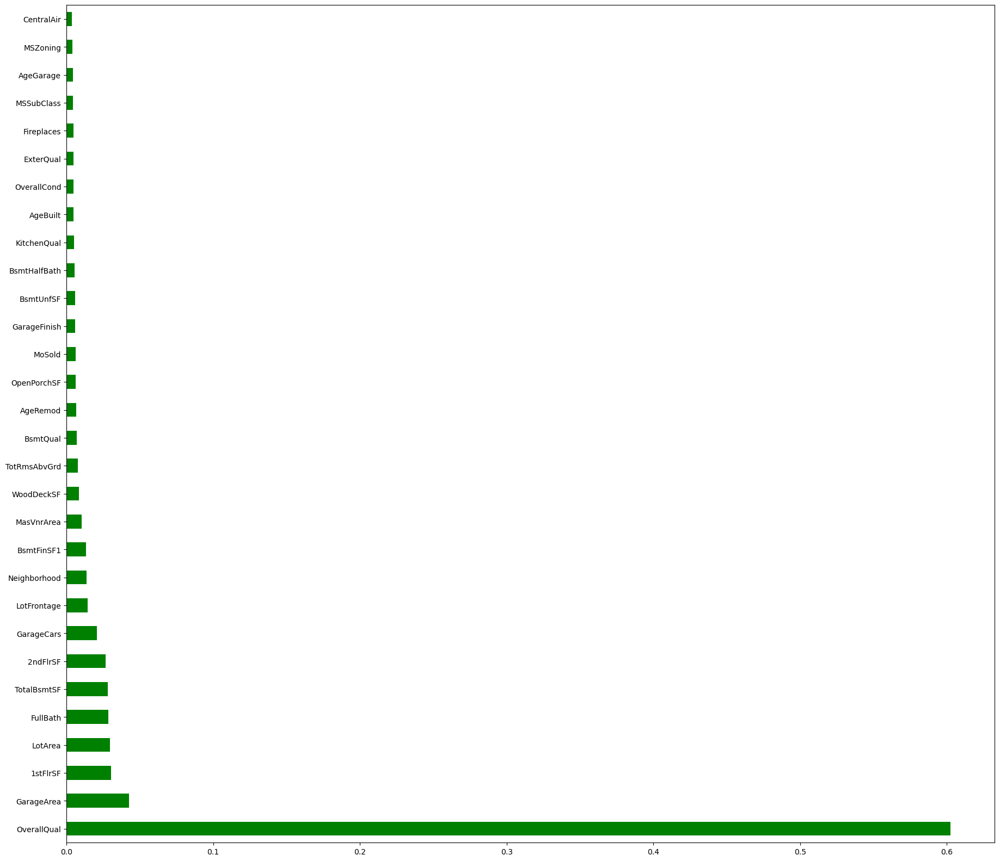

In [117]:
plt.figure(figsize=(22,20))
importances=pd.Series(RFR.feature_importances_,index=x.columns)
importances.nlargest(30).plot(kind='barh',color="g")
plt.show()

OverallQual column contributing more for prediction which means this feature is important for the predictions.

## Creating new train test split

In [118]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

I have created new train test split for model building.

# Regression Algorithms

In [119]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.linear_model import LinearRegression, Lasso,Ridge
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
import xgboost as xgb
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn import metrics

##  Linear Regression 

R2_score: 0.8608122957558328
MAE: 21876.53354638717
MSE: 986885144.6450217
RMSE: 31414.728148513743
Cross Validation Score: 0.8015392145426758


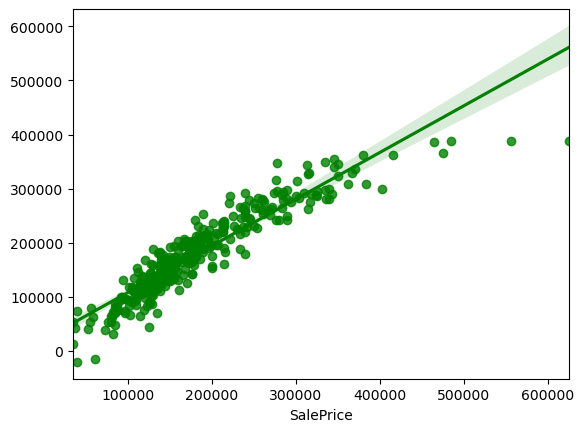

In [120]:
# Checking r2score for Linear Regression
LR = LinearRegression()
LR.fit(x_train,y_train)

# prediction
predLR=LR.predict(x_test)
print('R2_score:',r2_score(y_test,predLR))

# Mean Absolute Error (MAE)
print('MAE:',metrics.mean_absolute_error(y_test, predLR))

# Mean Squared Error (MSE)
print('MSE:',metrics.mean_squared_error(y_test, predLR))

# Root Mean Squared Error (RMSE)
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predLR)))

# Checking Cross Validation Score for Linear Regression
print("Cross Validation Score:",cross_val_score(LR,x,y,cv=5).mean())

# Visualizing the predicteed values
sns.regplot(y_test,predLR,color="g")
plt.show()

Created linear regression model and getting 86.08% R2 score using this model. From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

# Regularization

## Lasso Regressor

In [122]:
# Checking best alpha value
parameters={'alpha':[1e-15,1e-10, 1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}
lasso=Lasso()
clf=GridSearchCV(lasso,parameters)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 100}


R2_Score: 0.8613838819259696
MAE: 21699.36657318623
MSE: 982832416.6885134
RMSE: 31350.15816050237
Cross Validation Score: 0.8032492424881827


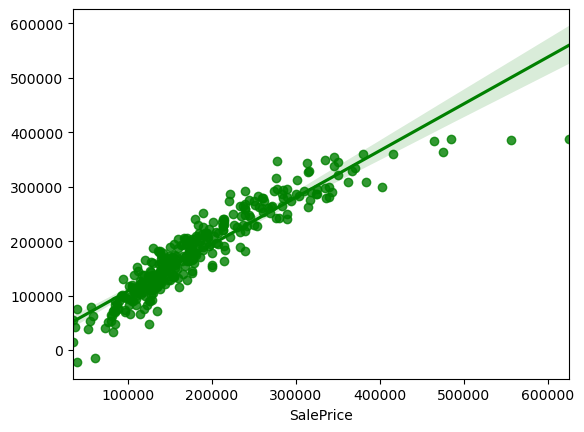

In [123]:
# Checking r2score for Lasso Regressor
lasso=Lasso(alpha=100)

# Predictions
lasso.fit(x_train,y_train)
lasso.score(x_train,y_train)
pred_lasso=lasso.predict(x_test)

print('R2_Score:',r2_score(y_test,pred_lasso))
print('MAE:',metrics.mean_absolute_error(y_test, pred_lasso))
print('MSE:',metrics.mean_squared_error(y_test, pred_lasso))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, pred_lasso)))

# Checking cv score for Lasso Regression
print("Cross Validation Score:",cross_val_score(lasso,x,y,cv=5).mean())

# Visualizing the predicteed values
sns.regplot(y_test,pred_lasso,color="g")
plt.show()

Created Lasso regressor model and getting 86.13% R2 score using this model. From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

## Ridge Regressor

In [124]:
# Checking best alpha value
paramsRidge = {'alpha':[1e-15,1e-10, 1e-8,1e-3,1e-2,1,5,10,20,30,35,40,45,50,55,100]}
ridge=Ridge()
clf=GridSearchCV(ridge,paramsRidge)
clf.fit(x_train,y_train)
print(clf.best_params_)

{'alpha': 100}


R2_Score: 0.8617885801301821
MAE: 21203.762363900718
MSE: 979962977.5525588
RMSE: 31304.360360061004
Cross Validation Score: 0.8056349740088612


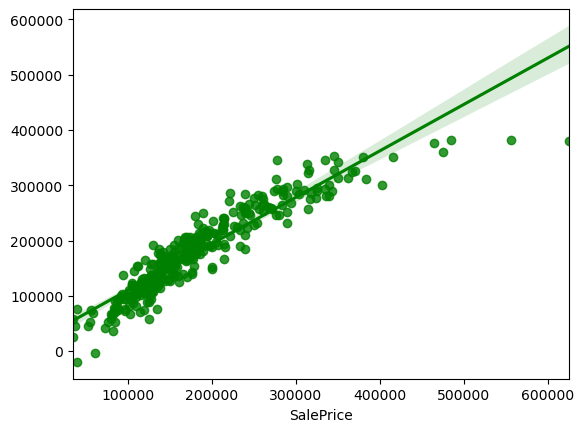

In [125]:
# Checking R2 score for Ridge regressor
ridge=Ridge(alpha=100)
ridge.fit(x_train,y_train)
ridge.score(x_train,y_train)
pred_ridge=ridge.predict(x_test)

print('R2_Score:',r2_score(y_test,pred_ridge))
print('MAE:',metrics.mean_absolute_error(y_test, pred_ridge))
print('MSE:',metrics.mean_squared_error(y_test, pred_ridge))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, pred_ridge)))

# Checking cv score for Lasso Regression
print("Cross Validation Score:",cross_val_score(ridge,x,y,cv=5).mean())

# Visualizing the predicteed values
sns.regplot(y_test,pred_ridge,color="g")
plt.show()

Created Ridge regressor model and getting 86.17% R2 score using this model. From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

# Ensemble Techniques

## Random Forest Regressor

R2_Score: 0.8939210091792377
MAE: 18291.873675213676
MSE: 752133823.6623225
RMSE: 27425.058316479885
Cross Validation Score: 0.8315308349805852


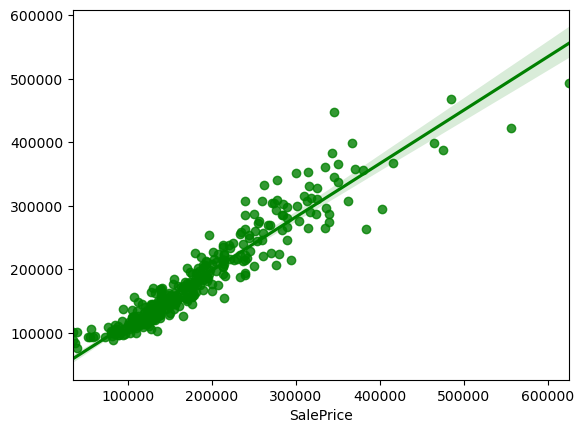

In [126]:
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)

# prediction
predRFR=RFR.predict(x_test)
print('R2_Score:',r2_score(y_test,predRFR))

# Metric evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predRFR))
print('MSE:',metrics.mean_squared_error(y_test, predRFR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predRFR)))

# Checking cv score for Lasso Regression
print("Cross Validation Score:",cross_val_score(RFR,x,y,cv=5).mean())

# Visualizing the predicteed values
sns.regplot(y_test,predRFR,color="g")
plt.show()

Created Random Forest Regressor model and getting 89.39% R2 score using this model.From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

## ExtraTrees Regressor

R2_Score: 0.9027882281575483
MAE: 18292.604387464387
MSE: 689262417.5167186
RMSE: 26253.80767653939
Cross Validation Score: 0.8359816002907327


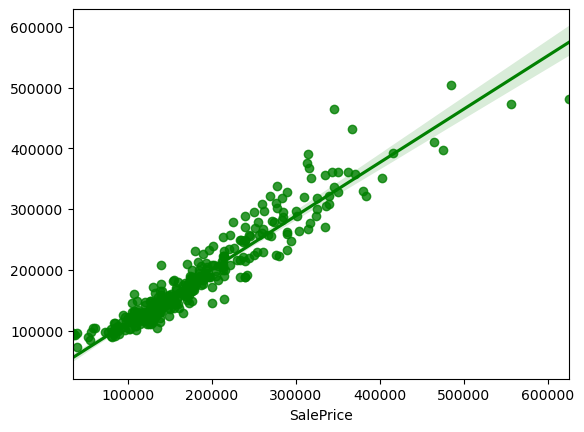

In [127]:
# Checking R2 score for Extra Trees Regressor

XT=ExtraTreesRegressor()
XT.fit(x_train,y_train)

# prediction
predXT=XT.predict(x_test)
print('R2_Score:',r2_score(y_test,predXT))

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predXT))
print('MSE:',metrics.mean_squared_error(y_test, predXT))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predXT)))

# Checking cv score for ExtraTreesRegressor
print("Cross Validation Score:",cross_val_score(XT,x,y,cv=5).mean())

# Visualizing the predicteed values
sns.regplot(y_test,predXT,color="g")
plt.show()

Created ExtraTrees Regressor model and getting 90.27% R2 score using this model. From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

## GradientBoosting Regressor

R2_Score: 0.9230556915430548
MAE: 16588.016106948253
MSE: 545559648.3431883
RMSE: 23357.218334878584
Cross Validation Score: 0.8222943302995821


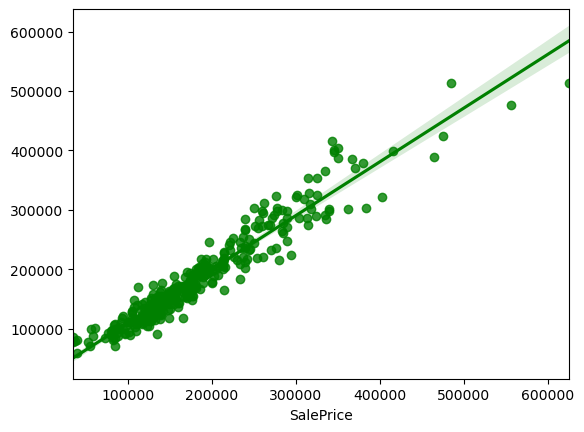

In [128]:
# Checking R2 score for GradientBoosting Regressor
GB=GradientBoostingRegressor()
GB.fit(x_train,y_train)

# prediction
predGB=GB.predict(x_test)
print('R2_Score:',r2_score(y_test,predGB))

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predGB))
print('MSE:',metrics.mean_squared_error(y_test, predGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predGB)))

# Checking cv score for Gradient Boosting Regressor
print("Cross Validation Score:",cross_val_score(GB,x,y,cv=5).mean())

# Visualizing the predicteed values
sns.regplot(y_test,predGB,color="g")
plt.show()

Created GradientBoosting Regressor model and getting 92.30% R2 score using this model. From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

## Extreme Gradient Boosting Regressor (XGB)

R2_Score: 0.8916515385485929
MAE: 18790.61278044872
MSE: 768225093.1013422
RMSE: 27716.873797406195
Cross Validation Score: 0.8287668809805288


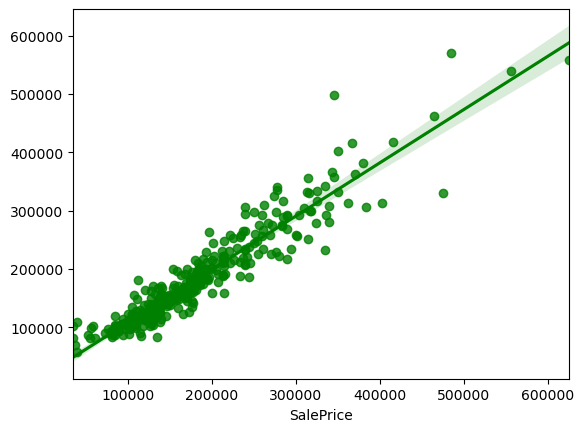

In [129]:
# Checking R2 score for XGB Regressor
from xgboost import XGBRegressor as xgb

XGB=xgb(verbosity=0)
XGB.fit(x_train,y_train)

# prediction
predXGB=XGB.predict(x_test)
print('R2_Score:',r2_score(y_test,predXGB))

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predXGB))
print('MSE:',metrics.mean_squared_error(y_test, predXGB))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predXGB)))

# Checking cv score for XGB Regressor
print("Cross Validation Score:",cross_val_score(XGB,x,y,cv=5).mean())

# Visualizing the predicteed values
sns.regplot(y_test,predXGB,color="g")
plt.show()

Created Extreme Gradient Boosting Regressor model and getting 89.16% R2 score using this model. From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

## BaggingRegressor

R2_Score: 0.8711080586189082
MAE: 20082.818803418806
MSE: 913884907.4650712
RMSE: 30230.52939438989
Cross Validation Score: 0.819069254446498


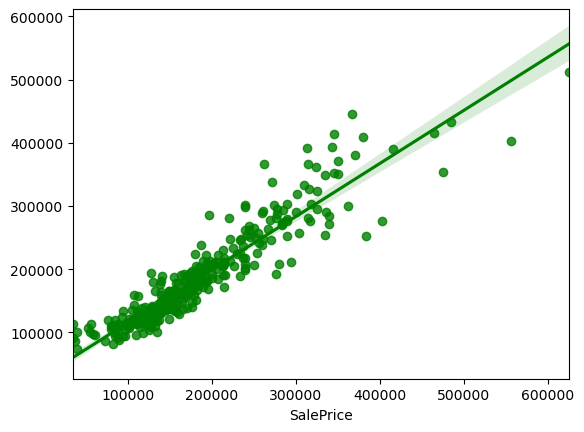

In [130]:
# Checking R2 score for BaggingRegressor
BR=BaggingRegressor()
BR.fit(x_train,y_train)

# prediction
predBR=BR.predict(x_test)
print('R2_Score:',r2_score(y_test,predBR))

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predBR))
print('MSE:',metrics.mean_squared_error(y_test, predBR))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predBR)))

# Checking cv score for BaggingRegressor
print("Cross Validation Score:",cross_val_score(BR,x,y,cv=5).mean())

# Visualizing the predicteed values
sns.regplot(y_test,predBR,color="g")
plt.show()

Created Bagging Regressor model and getting 87.11% R2 score using this model. From the above plot we can observe the sales price of the house. The best fit line shows there is strong linear relation between test data of trained model and predicted values.

## Model Selection
### Difference between R2 score and Cross Validation Score
- Linear Regressor = 5.93%
- Lasso Regressor = 5.81%
- Ridge Regressor = 5.61%
- Random Forest Regressor = 6.24%
- Extra Trees Regressor = 6.68%
- Gradient Boosting Regressor = 10.01%
- XGB Regressor = 6.29%
- Bagging Regressor = 5.21%

From the difference between R2 score and Cross Validation Score I can conclude that Bagging Regressor as my best fitting model as it is giving less difference compare to other models. Let's perform Hyperparameter tuning to increase the model accuracy.

# Hyper parameter tuning

In [131]:
# Let's Use the GridSearchCV to find the best paarameters in Bagging Regressor
from sklearn.model_selection import GridSearchCV
# Bagging Regressor
parameters = {'n_estimators': [10,50,100,200,500],
              'max_samples':[1.0,5.0,6.0,0.008],
              'max_features':[1.0,10.0,0.0001,5.68],
              'bootstrap':[True,False],
              'oob_score':[True,False],
              'n_jobs':[-1,-2,-3,-4]}

In [132]:
GCV=GridSearchCV(BaggingRegressor(),parameters,cv=5)

Running GridSearchCV for the model Bagging Regressor.

In [133]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=BaggingRegressor(),
             param_grid={'bootstrap': [True, False],
                         'max_features': [1.0, 10.0, 0.0001, 5.68],
                         'max_samples': [1.0, 5.0, 6.0, 0.008],
                         'n_estimators': [10, 50, 100, 200, 500],
                         'n_jobs': [-1, -2, -3, -4],
                         'oob_score': [True, False]})

In [134]:
# Getting best parameters
GCV.best_params_

{'bootstrap': True,
 'max_features': 1.0,
 'max_samples': 1.0,
 'n_estimators': 200,
 'n_jobs': -3,
 'oob_score': False}

These are the best parameters obtained after running GridSearchCV.

R2_Score: 90.16971373512644
Mean absolute error: 17839.060754985752
Mean squared error: 696998598.7694212
Root Mean Squared error: 26400.73102717842


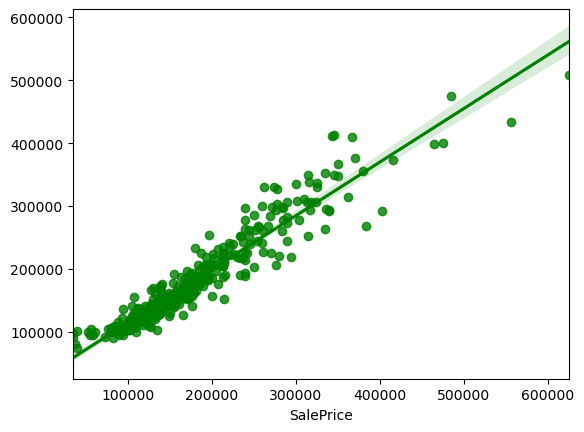

In [135]:
# Creating final model
Final_Model = BaggingRegressor(bootstrap=True, max_features=1.0, max_samples=1.0, n_estimators=200, n_jobs=-3, oob_score=False)

# Prediction
Final_Model.fit(x_train, y_train)
pred = Final_Model.predict(x_test)
print('R2_Score:',r2_score(y_test,pred)*100)

# Metric Evaluation
print('Mean absolute error:',metrics.mean_absolute_error(y_test, pred))
print('Mean squared error:',metrics.mean_squared_error(y_test, pred))
print('Root Mean Squared error:',np.sqrt(metrics.mean_squared_error(y_test, pred)))

# Visualizing the predicteed values
sns.regplot(y_test,pred,color="g")
plt.show()

Great!!! The R2 score of Bagging Regressor has been increased 3% after tuning the model. It is giving R2 score as 90.16% which is very good.
The plot gives some strong linear between test and predicted values.

## Saving the Final model

In [136]:
# Saving the model using .pkl
import joblib
joblib.dump(Final_Model,"Housing_SalePrice_Prediction.pkl")

['Housing_SalePrice_Prediction.pkl']

## Predicting the saved model

In [137]:
# Loading the saved model
Model=joblib.load("Housing_SalePrice_Prediction.pkl")

#Prediction
prediction = Model.predict(x_test)
prediction

array([140281.075, 150825.675, 169247.925, 261987.88 ,  98893.145,
       261528.635, 176636.09 , 121272.3  , 131909.42 , 109600.74 ,
        80844.015, 146051.965, 225832.245, 163253.355, 138180.81 ,
       181736.405, 185033.505, 187211.72 , 293537.61 , 166057.24 ,
       136273.225, 144265.38 , 128897.24 , 306169.125, 115330.295,
       148794.6  , 241974.485, 240141.35 , 100672.365, 175824.525,
       172343.075, 131225.29 , 183735.115, 118115.17 , 153231.48 ,
       161283.005, 308349.   , 130498.21 , 111149.95 , 140550.3  ,
       278290.885, 182223.83 , 433531.305,  74341.   , 101117.965,
       297099.415, 136476.395, 399949.015, 252364.795, 132891.56 ,
       147403.12 , 115796.42 , 186549.51 , 100580.955, 203713.915,
       147722.83 , 217349.03 , 121744.7  , 356109.48 , 326317.38 ,
       141691.97 , 171983.385, 193605.9  , 140619.67 , 174894.6  ,
       196575.55 , 202532.325, 227171.68 , 225303.9  , 105330.95 ,
       116915.945, 102399.015, 413724.27 , 150982.14 , 146907.

These are the predicted sales price of the house.

## Creating DataFrame for the predicted values

In [138]:
pd.DataFrame([Model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350
Predicted,140281.075,150825.675,169247.925,261987.88,98893.145,261528.635,176636.09,121272.3,131909.42,109600.74,80844.015,146051.965,225832.245,163253.355,138180.81,181736.405,185033.505,187211.72,293537.61,166057.24,136273.225,144265.38,128897.24,306169.125,115330.295,148794.6,241974.485,240141.35,100672.365,175824.525,172343.075,131225.29,183735.115,118115.17,153231.48,161283.005,308349.0,130498.21,111149.95,140550.3,278290.885,182223.83,433531.305,74341.0,101117.965,297099.415,136476.395,399949.015,252364.795,132891.56,147403.12,115796.42,186549.51,100580.955,203713.915,147722.83,217349.03,121744.7,356109.48,326317.38,141691.97,171983.385,193605.9,140619.67,174894.6,196575.55,202532.325,227171.68,225303.9,105330.95,116915.945,102399.015,413724.27,150982.14,146907.12,293423.69,191487.9,299822.825,349444.775,138454.825,117419.735,151486.895,119807.59,121296.585,259845.73,91936.58,121942.68,211096.025,311689.9,239158.405,153508.34,97809.61,162337.35,95030.43,102636.22,205705.26,99026.43,129323.29,107416.915,296121.56,223704.075,115889.94,132820.94,284711.19,106983.255,121172.66,240383.965,268788.62,157821.62,203837.985,252038.75,119958.555,179419.66,89724.08,225757.95,136161.07,151155.3,213328.3,306901.925,219206.715,329987.685,126957.61,95495.5,100243.58,203943.86,147813.16,236568.195,153652.44,144115.45,206564.21,376845.4,293480.36,100776.27,172456.23,148136.61,124363.71,157037.755,216745.01,177780.75,191115.6,162913.25,216287.635,91428.29,138789.14,172854.945,397957.415,179877.025,132727.205,111514.115,187636.97,133782.325,125028.53,119102.84,273583.105,158555.96,152958.075,205753.075,161583.16,330236.865,231212.665,135627.055,203938.935,178219.8,268427.73,168131.525,508561.97,141025.11,252261.305,131233.6,206831.88,277092.045,160739.905,348425.25,373136.34,157713.25,140130.565,151348.25,144349.715,135569.58,169180.585,252929.745,126628.165,223109.11,101981.185,148524.445,99078.33,138854.865,187867.975,173155.26,260750.055,134831.895,164006.25,116494.1,336587.28,263366.025,100451.705,164493.45,122784.225,411670.78,241541.185,277426.75,171617.12,124689.735,146133.925,128984.315,218576.085,101768.61,186989.54,110059.2,190135.28,177414.92,166776.575,348714.885,164108.66,232723.52,129402.555,94765.21,130628.015,245054.76,137090.04,131917.2,143516.0,143500.085,352574.2,119939.335,183028.95,126437.34,188586.765,137992.735,155564.015,338073.01,254371.805,99600.75,127129.395,155194.3,291999.11,120815.91,150670.755,170130.24,130977.69,131280.045,122723.18,120941.605,224723.25,201650.95,266819.25,161986.34,268664.68,106144.405,209880.7,410604.285,335403.985,107702.92,330063.925,187614.32,168514.87,177907.095,166534.01,109681.46,113459.78,136743.585,214883.95,2450

The actual and predicted sales price are almost same.

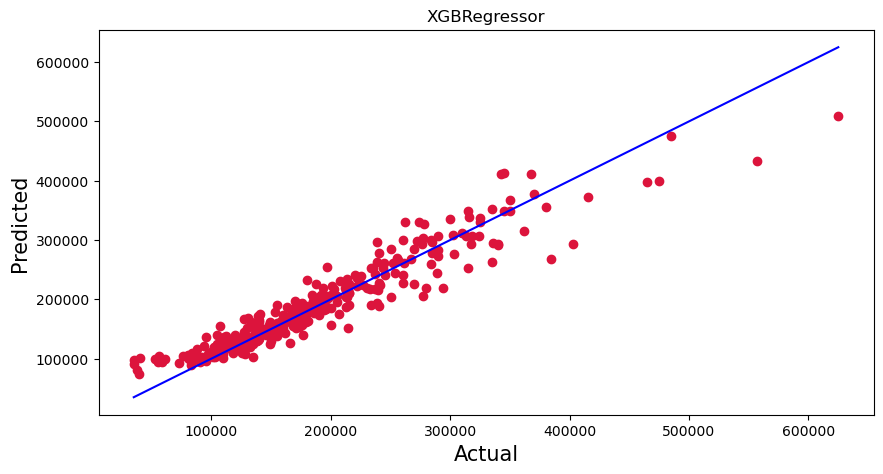

In [139]:
plt.figure(figsize=(10,5))
plt.scatter(y_test, prediction, c='crimson')
p1 = max(max(prediction), max(y_test))
p2 = min(min(prediction), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual', fontsize=15)
plt.ylabel('Predicted', fontsize=15)
plt.title("XGBRegressor")
plt.show()

The plot gives the linear relation between predicted and actual sale price of the house. The best fitting line gives the actual values and red dots gives the predicted values.

# Predicting SalePrice of house for test dataset using saved trained model

In [140]:
# Predicting the house sale price from the features of the testing data 
Predicted_SalePrice = Model.predict(test_df)
Predicted_SalePrice

array([354779.085, 259463.8  , 250229.555, 171859.6  , 205364.77 ,
        94292.385, 145700.955, 395924.05 , 238505.655, 179390.945,
        91605.8  , 151675.335, 126894.985, 179325.45 , 308174.71 ,
       120734.54 , 122666.05 , 128384.35 , 165724.3  , 183952.77 ,
       167415.955, 151190.25 , 160563.37 , 100489.795, 112382.63 ,
       129814.455, 177684.75 , 149327.   , 170385.37 , 119683.71 ,
       131681.14 , 201351.885, 215749.565, 159763.78 , 116122.38 ,
       169544.63 , 183767.36 , 121516.665, 158091.615, 145611.135,
       109094.86 , 304377.14 , 200762.885, 190443.525, 135773.745,
       129068.025, 130140.14 , 108337.43 , 211678.71 , 335279.85 ,
       139602.44 , 192919.72 , 105403.5  , 105583.22 , 282523.875,
       130797.07 , 139106.4  , 183666.52 , 124219.715, 260507.67 ,
       104396.07 , 164421.315, 131040.655, 146647.8  , 196014.275,
       108241.39 , 154389.655, 208511.66 , 138657.77 , 157713.635,
       273112.045, 164791.545, 172306.87 , 145362.73 , 151365.

These are the predicted sales price of the house.

## Creating DataFrame and Saving the predictions

In [141]:
# Creating dataframe for the predicted results 
Prediction = pd.DataFrame()
Prediction['SalePrice']= Predicted_SalePrice
Prediction

,SalePrice
0,354779.085
1,259463.800
2,250229.555
3,171859.600
4,205364.770
5,94292.385
6,145700.955
7,395924.050
8,238505.655
9,179390.945


In [142]:
## Saving the predictions
Prediction.to_csv("Predicted_House_SalePrice_Data.csv", index=False)

## Conclusion:
### Which variables are important to predict the price of house?
- Overall Quality is the most contributing and highest positive impacting feature. Also, the features like GarageArea, LotArea, 1stFlrSF, TotalBsmtSF etc have some what linear relation with the price variable.

### How do these variables describe the price of the house?
- The houses which have very excellent overall quality like material and finish of the house have high sale price. Also we have observed from the plot that as the overall quality of the house increases,the sale price also increases. That is there is good linear relation between SalePrice and OverallQual. So, if the seller builds the house according to these types of qualities that will increase the sale price of the house.
- There is a linear relation between the SalePrice and 1stFlrSF. As we have seen as the 1st floor area increases, sales price also increases moderately. So, people like to live in the houses which have only 1-2 floors and the cost of the house also increases in this case.
- Also, we have seen the positive linear relation between the SalePrice and GarageArea. As size of garage area increases, sale price also increases.
- There is positive linear relation between sale price nad TotalBsmtSF. As total basement area increases, sale price also increases.
- Uisng the features which have some relation with target we have built many ML models also seen the increase in accuracy of the best model.


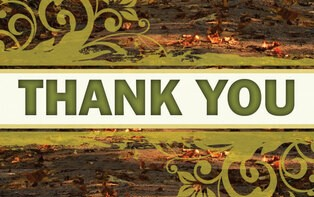